# ✈️ NASA C-MAPSS FD004 — 완전 통합 분석 노트북

**[FD004]** 6가지 운전 조건 + HPC + Fan 이중 고장 모드

### ⚡ FD004 특징 (FD001~003 대비)
| 항목 | FD001 | FD002 | FD003 | **FD004** |
|---|---|---|---|---|
| 운전 조건 | 1개 | 6개 | 1개 | **6개** |
| 고장 모드 | HPC | HPC | HPC+Fan | **HPC+Fan** |
| 정규화 | 단일 MinMax | 클러스터별 MinMax | 단일 MinMax | **클러스터별 MinMax** |
| 센서 제거 | 7개→14개 | 1개→20개 | 6개→15개 | **6개→15개** |
| Window | 30 | 20 | 30 | **30** |

### 📋 전체 목차
| # | 섹션 | 핵심 내용 |
|---|---|---|
| 0 | 환경 설정 | 라이브러리·전역 상수 (SENSOR_DESC·FAN/HPC_SENSORS) |
| 1 | 데이터 로딩 | 자동 경로 탐색·컬럼 표준화 |
| 2 | [FD004 핵심] 운전 조건 클러스터링 | Elbow+Silhouette·KMeans k=6·Chi-square·EXTRA-A/B/C |
| 3 | 전처리 전 EDA | 품질·수명·클러스터별분포·상관관계·열화트렌드·RUL상관 |
| 4 | 통계 검정 (11개) | 시차상관/MK/σ 클러스터별★·RUL Cap·윈도우·ANOVA·KW·Mann-Whitney U★·Levene★·Chi-square★·Pearson클러스터별★ |
| 5 | [FD004 전용★] 고장 모드 분석 | slope k=2·Fan vs HPC 이중 고장 비교·EXTRA-D/E/F |
| 6 | [ML_EDA 고유] 시각화 & pingouin 검정 | regime scatter·slope 분석·ANOVA·추세검정 |
| 7 | 결정 1~5 전처리 파이프라인 | 센서제거·RUL·Gaussian·Validation·클러스터별MinMax+OHE |
| 8 | 전처리 후 검증 | 상관관계·분포·KS·RUL상관·다중공선성 |
| 9 | ML 분기 | 엔진×클러스터 단위 파생변수 |
| 10 | DL 분기 | 슬라이딩 윈도우·val_eval |

## 0. 환경 설정

In [90]:
import sys, subprocess
for pkg in ['numpy','pandas','scikit-learn','scipy','matplotlib','seaborn',
            'statsmodels','joblib','pingouin']:
    try:
        subprocess.check_call([sys.executable,'-m','pip','install','-q',pkg])
    except Exception as e:
        print(f'⚠️ {pkg} 설치 실패: {e}')
print('✅ 라이브러리 설치 완료')


✅ 라이브러리 설치 완료


In [91]:
import os, warnings, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
import seaborn as sns
import platform
import joblib
from scipy.ndimage import gaussian_filter1d
from scipy.stats import (ks_2samp, kruskal, kendalltau, ttest_rel, shapiro, wilcoxon,
                          spearmanr, mannwhitneyu, levene, f_oneway, pearsonr,
                          chi2_contingency, entropy)
from statsmodels.stats.multitest import multipletests
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from mpl_toolkits.mplot3d import Axes3D
warnings.filterwarnings('ignore')
import logging, matplotlib.font_manager as fm
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

def force_korean_font():
    system = platform.system()
    if system == 'Windows':   fp, fn = 'C:/Windows/Fonts/malgun.ttf', 'Malgun Gothic'
    elif system == 'Darwin':  fp, fn = '/System/Library/Fonts/AppleGothic.ttf', 'AppleGothic'
    else:
        fp, fn = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf', 'NanumGothic'
        if not os.path.exists(fp): os.system('apt-get update -qq && apt-get install -y fonts-nanum -qq')
    if os.path.exists(fp):
        fm.fontManager.addfont(fp)
        plt.rcParams['font.family'] = fn; plt.rcParams['font.sans-serif'] = [fn]
        plt.rcParams['axes.unicode_minus'] = False; print(f'✅ 한글 폰트: {fn}')
force_korean_font()

BG, BG2, GRID = '#0f1117', '#1a1d2e', '#2d3148'
WHITE, GRAY   = '#ffffff', '#aaaaaa'
C = ['#00d4ff','#ff6b6b','#51cf66','#ffd43b','#a29bfe','#fd79a8','#00b894','#e17055']
CLUSTER_COLORS = ['#00d4ff','#ff6b6b','#51cf66','#ffd43b','#a29bfe','#fd79a8']
CLUSTER_MAP    = {0:'A',1:'B',2:'C',3:'D',4:'E',5:'F'}
cmap_rg  = LinearSegmentedColormap.from_list('rg',['#ff6b6b','#1a1d2e','#00d4ff'],N=256)
cmap_lag = LinearSegmentedColormap.from_list('lag',['#ff6b6b','#1a1d2e','#00d4ff'],N=256)

plt.rcParams.update({
    'figure.facecolor':BG,'axes.facecolor':BG2,'axes.edgecolor':GRID,
    'axes.labelcolor':GRAY,'xtick.color':GRAY,'ytick.color':GRAY,
    'text.color':WHITE,'grid.color':GRID,'grid.alpha':0.4,'axes.grid':True,
    'font.size':10,'axes.titlesize':11,'legend.facecolor':BG2,'legend.edgecolor':GRID,
})
force_korean_font()

RAW_COLS   = ['unit','cycle','op1','op2','op3'] + [f's{i}' for i in range(1,22)]
RENAME_MAP = {'unit':'unit_nr','cycle':'time_cycles','op1':'setting_1',
              'op2':'setting_2','op3':'setting_3',
              **{f's{i}':f's_{i}' for i in range(1,22)}}
SENSOR_COLS = [f's_{i}' for i in range(1,22)]
OP_COLS     = ['setting_1','setting_2','setting_3']
ID_COLS     = ['unit_nr','time_cycles']
N_CLUSTERS  = 6
RUL_CAP     = 125
GAUSS_SIGMA = 2
CONST_THR   = 0.01
WINDOW_SIZE = 30   # FD002=20, FD001/003/004=30 (3-6 통계 검정 근거)
STEP        = 1
TEMPORAL_LAGS=[1,3,5]; TEMPORAL_DIFFS=[1]; TEMPORAL_ROLLS=[3,5]
TEMPORAL_ROLL_STDS=[3,5]; TEMPORAL_EMAS=[5]

# FD004 전용: Fan/HPC 관련 센서 분류
FAN_SENSORS = ['s_8','s_13','s_15','s_14']   # Nf, NRf, BPR, NRc
HPC_SENSORS = ['s_3','s_7','s_9','s_11','s_12']  # T30, P30, Nc, Ps30, phi

SENSOR_DESC = {
    's_1':'T2 팬 입구 온도(°R)',   's_2':'T24 LPC 출구 온도(°R)',
    's_3':'T30 HPC 출구 온도(°R)','s_4':'T50 LPT 출구 온도(°R)',
    's_5':'P2 팬 입구 압력(psia)', 's_6':'P15 바이패스 압력(psia)',
    's_7':'P30 HPC 출구 압력(psia)','s_8':'Nf 팬 속도(rpm)',
    's_9':'Nc 코어 속도(rpm)',      's_10':'epr 엔진 압력비',
    's_11':'Ps30 정적압력(psia)',   's_12':'phi 연료/Ps30 비율',
    's_13':'NRf 보정 팬 속도(rpm)','s_14':'NRc 보정 코어속도(rpm)',
    's_15':'BPR 바이패스 비율',    's_16':'farB 버너 연료공기비',
    's_17':'htBleed 블리드 엔탈피','s_18':'Nf_dmd 요구 팬 속도',
    's_19':'PCNfR 요구 보정 팬속도','s_20':'W31 HPT 냉각블리드',
    's_21':'W32 LPT 냉각블리드',
}
print('✅ 환경 설정 완료')
print(f'   RUL_CAP={RUL_CAP}  σ={GAUSS_SIGMA}  WINDOW={WINDOW_SIZE}  N_CLUSTERS={N_CLUSTERS}')
print(f'   FAN_SENSORS: {FAN_SENSORS}')
print(f'   HPC_SENSORS: {HPC_SENSORS}')


✅ 한글 폰트: Malgun Gothic
✅ 한글 폰트: Malgun Gothic
✅ 환경 설정 완료
   RUL_CAP=125  σ=2  WINDOW=30  N_CLUSTERS=6
   FAN_SENSORS: ['s_8', 's_13', 's_15', 's_14']
   HPC_SENSORS: ['s_3', 's_7', 's_9', 's_11', 's_12']


---
## 1. 데이터 로딩 & 컬럼명 표준화

In [92]:
DATA_DIR = 'CMAPSSData'
for c in ['CMAPSSData','./CMAPSSData','../CMAPSSData','../../CMAPSSData',
          '../../../CMAPSSData','../../../../CMAPSSData']:
    if os.path.exists(os.path.join(c,'train_FD004.txt')): DATA_DIR=c; break
else: print(f'❌ CMAPSSData 폴더 없음: {os.getcwd()}')

kw = dict(sep=r'\s+', header=None, names=RAW_COLS, engine='python')
train_raw = pd.read_csv(f'{DATA_DIR}/train_FD004.txt', **kw)
test_raw  = pd.read_csv(f'{DATA_DIR}/test_FD004.txt',  **kw)
rul_df    = pd.read_csv(f'{DATA_DIR}/RUL_FD004.txt', sep=r'\s+', header=None, names=['RUL'], engine='python')
train_raw.rename(columns=RENAME_MAP, inplace=True)
test_raw.rename( columns=RENAME_MAP, inplace=True)

print(f'✅ FD004 로딩 완료')
print(f'   Train: {train_raw.shape}  |  엔진 {train_raw["unit_nr"].nunique()}대')
print(f'   Test : {test_raw.shape}   |  엔진 {test_raw["unit_nr"].nunique()}대')
display(train_raw.head(3))


✅ FD004 로딩 완료
   Train: (61249, 26)  |  엔진 249대
   Test : (41214, 26)   |  엔진 248대


,unit_nr,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21
0,1,1,42.0049,0.8400,100.0,445.00,549.68,1343.43,1112.93,3.91,...,129.78,2387.99,8074.83,9.3335,0.02,330,2212,100.0,10.62,6.3670
1,1,2,20.0020,0.7002,100.0,491.19,606.07,1477.61,1237.50,9.35,...,312.59,2387.73,8046.13,9.1913,0.02,361,2324,100.0,24.37,14.6552
2,1,3,42.0038,0.8409,100.0,445.00,548.95,1343.12,1117.05,3.91,...,129.62,2387.97,8066.62,9.4007,0.02,329,2212,100.0,10.48,6.4213


### 📊 1. 데이터 로딩 결과
| 항목 | FD001 | FD002 | FD003 | **FD004** |
|---|---|---|---|---|
| Train 행 | 20,631 | 53,759 | 24,720 | **61,249** |
| Test 행 | 13,096 | 33,991 | 16,596 | **41,214** |
| 엔진 수(Train) | 100대 | 260대 | 100대 | **249대** |
| 운전 조건 | 1개 | 6개 | 1개 | **6개** |
| 고장 모드 | HPC | HPC | HPC+Fan | **HPC+Fan** |

> 📌 FD004는 4개 데이터셋 중 Train 행이 가장 많음 (61,249행)  
> → 엔진 수(249대)는 FD002(260대)보다 적지만 행이 더 많음 → 평균 수명 더 길다는 의미


---
## 2. [FD004 핵심] 운전 조건 클러스터링 (KMeans k=6)

FD004는 FD002와 동일하게 6가지 운전 조건 혼재.  
**모든 EDA·통계·정규화·파생변수**를 클러스터 단위로 수행 — FD004 전처리의 핵심.

### 2-1. 최적 클러스터 수 탐색 (Elbow + Silhouette)


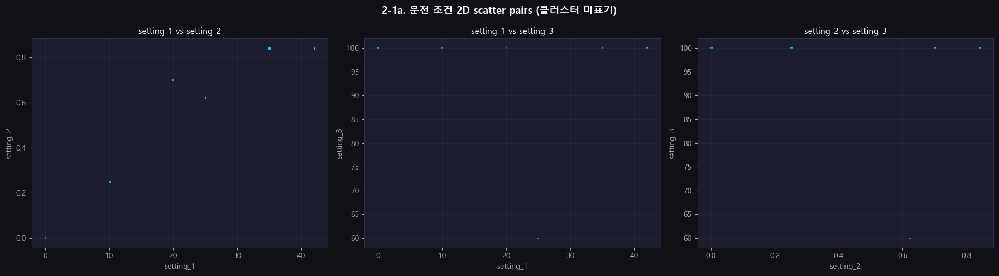

📌 6개의 이산적 점이 명확히 분리됨 → 6개 고정 운전 조건 확인 → k=6 근거


In [93]:
# 2D scatter pairs — 6개 조건이 이산적으로 분리됨 확인 [DL_Final 2-7]
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('2-1a. 운전 조건 2D scatter pairs (클러스터 미표기)', fontsize=13, fontweight='bold')
pairs_2d = [('setting_1','setting_2'),('setting_1','setting_3'),('setting_2','setting_3')]
for ax, (x, y) in zip(axes, pairs_2d):
    ax.scatter(train_raw[x], train_raw[y], color=C[0], alpha=0.1, s=1)
    ax.set_xlabel(x); ax.set_ylabel(y); ax.set_title(f'{x} vs {y}')
plt.tight_layout(); plt.show()
print('📌 6개의 이산적 점이 명확히 분리됨 → 6개 고정 운전 조건 확인 → k=6 근거')


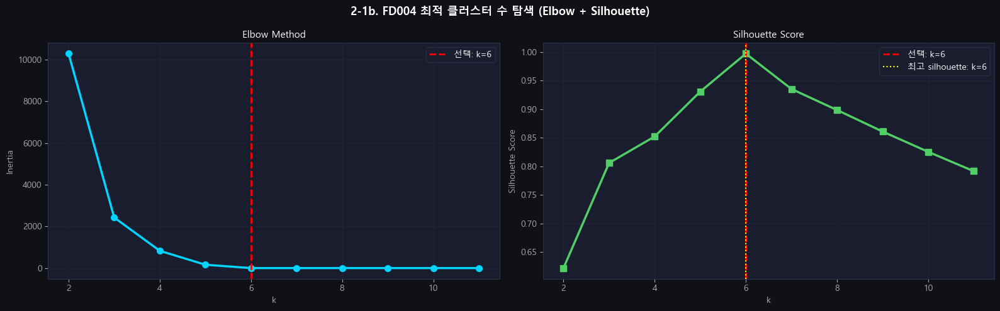

선택: k=6  |  Silhouette=0.9970
FD004 데이터셋 설계 상 6가지 고정 운전 조건 → k=6 선택 근거


In [94]:
op_data = MinMaxScaler().fit_transform(train_raw[OP_COLS])
inertias, silhouettes = [], []
K_range = range(2, 12)
for k in K_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=20, max_iter=300)
    labels = km.fit_predict(op_data)
    inertias.append(km.inertia_)
    silhouettes.append(silhouette_score(op_data, labels))

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('2-1b. FD004 최적 클러스터 수 탐색 (Elbow + Silhouette)', fontsize=13, fontweight='bold')
axes[0].plot(list(K_range), inertias, color=C[0], lw=2.5, marker='o', markersize=7)
axes[0].axvline(N_CLUSTERS, color='red', ls='--', lw=2, label=f'선택: k={N_CLUSTERS}')
axes[0].set_xlabel('k'); axes[0].set_ylabel('Inertia'); axes[0].set_title('Elbow Method'); axes[0].legend()
best_k = list(K_range)[np.argmax(silhouettes)]
axes[1].plot(list(K_range), silhouettes, color=C[2], lw=2.5, marker='s', markersize=7)
axes[1].axvline(N_CLUSTERS, color='red', ls='--', lw=2, label=f'선택: k={N_CLUSTERS}')
axes[1].axvline(best_k, color='yellow', ls=':', lw=1.5, label=f'최고 silhouette: k={best_k}')
axes[1].set_xlabel('k'); axes[1].set_ylabel('Silhouette Score'); axes[1].set_title('Silhouette Score'); axes[1].legend()
plt.tight_layout(); plt.show()
print(f'선택: k={N_CLUSTERS}  |  Silhouette={silhouettes[N_CLUSTERS-2]:.4f}')
print(f'FD004 데이터셋 설계 상 6가지 고정 운전 조건 → k=6 선택 근거')


### 2-2. KMeans 클러스터링 수행 & 3D 분포

=== 클러스터별 운전 조건 프로파일 ===


,setting_1,setting_2,setting_3,row_count,비율(%)
op_cluster,,,,,
0,42.0030,0.8405,100.0,15395,25.14
1,10.0030,0.2505,100.0,9224,15.06
2,25.0031,0.6205,60.0,9139,14.92
3,20.0030,0.7005,100.0,9091,14.84
4,0.0015,0.0005,100.0,9238,15.08
5,35.0030,0.8405,100.0,9162,14.96


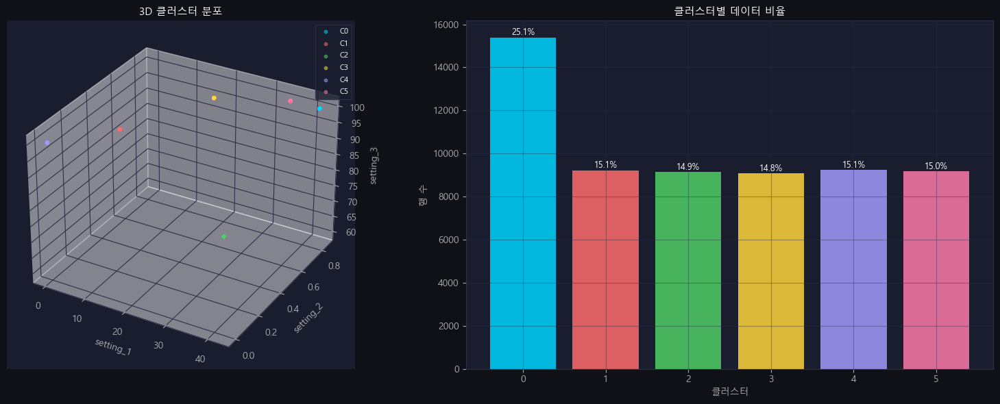

In [95]:
op_scaler = MinMaxScaler()
op_train_z = op_scaler.fit_transform(train_raw[OP_COLS])
op_test_z  = op_scaler.transform(test_raw[OP_COLS])

kmeans = KMeans(n_clusters=N_CLUSTERS, random_state=42, n_init=20, max_iter=300)
kmeans.fit(op_train_z)
train_raw['op_cluster'] = kmeans.labels_
test_raw['op_cluster']  = kmeans.predict(op_test_z)

# EDA용 Cluster_Label (A~F)
train_raw['Cluster_Label'] = train_raw['op_cluster'].map(CLUSTER_MAP)
test_raw['Cluster_Label']  = test_raw['op_cluster'].map(CLUSTER_MAP)

# EDA용 StandardScaler 기반 클러스터링 (ML_EDA 방식)
op_scaled_eda = StandardScaler().fit_transform(train_raw[OP_COLS])
km_eda = KMeans(n_clusters=N_CLUSTERS, random_state=42, n_init=10)
cluster_labels_eda = km_eda.fit_predict(op_scaled_eda)
train_raw['cluster_eda'] = cluster_labels_eda

cluster_profile = (train_raw.groupby('op_cluster')[OP_COLS+['unit_nr']]
                   .agg({'setting_1':'mean','setting_2':'mean','setting_3':'mean','unit_nr':'count'})
                   .rename(columns={'unit_nr':'row_count'}))
cluster_profile['비율(%)'] = (cluster_profile['row_count']/len(train_raw)*100).round(2)
print('=== 클러스터별 운전 조건 프로파일 ===')
display(cluster_profile.round(4))

fig = plt.figure(figsize=(16, 6))
ax3d = fig.add_subplot(121, projection='3d')
smp  = train_raw.sample(min(3000,len(train_raw)), random_state=42)
for c in range(N_CLUSTERS):
    m = smp['op_cluster']==c
    ax3d.scatter(smp.loc[m,'setting_1'],smp.loc[m,'setting_2'],smp.loc[m,'setting_3'],
                 color=CLUSTER_COLORS[c], s=10, alpha=0.5, label=f'C{c}')
ax3d.set_xlabel('setting_1'); ax3d.set_ylabel('setting_2'); ax3d.set_zlabel('setting_3')
ax3d.set_title('3D 클러스터 분포'); ax3d.legend(fontsize=8)
ax2 = fig.add_subplot(122)
cnts = train_raw['op_cluster'].value_counts().sort_index()
ax2.bar(cnts.index, cnts.values, color=CLUSTER_COLORS, alpha=0.85)
ax2.set_xlabel('클러스터'); ax2.set_ylabel('행 수'); ax2.set_title('클러스터별 데이터 비율')
for i, v in zip(cnts.index, cnts.values):
    ax2.text(i, v+100, f'{v/len(train_raw)*100:.1f}%', ha='center', fontsize=9)
plt.tight_layout(); plt.show()


### 2-3. 클러스터 일관성 검증 & Train/Test 비율 비교 (Chi-square)

엔진별 클러스터 다양성:
  평균 클러스터 수: 6.00  |  6가지 모두: 249대

Chi-square: chi2=5.05  df=5  p=0.4096
판정: ✅ 클러스터 비율 동질


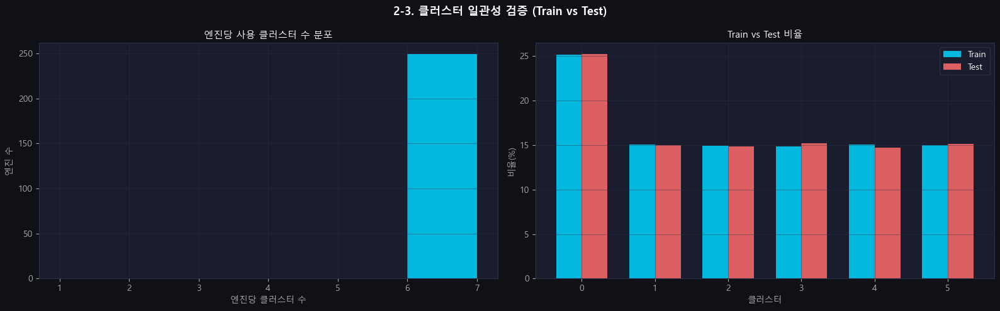

In [96]:
engine_cluster_cnt = (train_raw.groupby(['unit_nr','op_cluster']).size()
                       .reset_index().groupby('unit_nr').size())
print('엔진별 클러스터 다양성:')
print(f'  평균 클러스터 수: {engine_cluster_cnt.mean():.2f}  |  6가지 모두: {(engine_cluster_cnt==N_CLUSTERS).sum()}대')

tr_cnt = train_raw['op_cluster'].value_counts().sort_index()
te_cnt = test_raw['op_cluster'].value_counts().sort_index()
ct = pd.DataFrame({'Train':tr_cnt,'Test':te_cnt}).fillna(0).T
chi2, p_chi2, dof, _ = chi2_contingency(ct)
print(f'\nChi-square: chi2={chi2:.2f}  df={dof}  p={p_chi2:.4f}')
print(f'판정: {"✅ 클러스터 비율 동질" if p_chi2>0.05 else "⚠️ 비율 차이 유의"}')

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('2-3. 클러스터 일관성 검증 (Train vs Test)', fontsize=13, fontweight='bold')
axes[0].hist(engine_cluster_cnt, bins=range(1,N_CLUSTERS+2), color=C[0], alpha=0.85, edgecolor='none')
axes[0].set_xlabel('엔진당 클러스터 수'); axes[0].set_ylabel('엔진 수')
axes[0].set_title('엔진당 사용 클러스터 수 분포')
x = np.arange(N_CLUSTERS); w = 0.35
tr_pct = tr_cnt.values/tr_cnt.sum()*100; te_pct = te_cnt.reindex(range(N_CLUSTERS),fill_value=0).values/te_cnt.sum()*100
axes[1].bar(x-w/2, tr_pct, w, color=C[0], alpha=0.85, label='Train')
axes[1].bar(x+w/2, te_pct, w, color=C[1], alpha=0.85, label='Test')
axes[1].set_xlabel('클러스터'); axes[1].set_ylabel('비율(%)'); axes[1].set_title('Train vs Test 비율'); axes[1].legend()
plt.tight_layout(); plt.show()


### 2-4. 클러스터 전이 행렬 & 거주 시간 [EXTRA-A]

=== 2-4. 클러스터 전이 / 거주 시간 (EXTRA-A) ===


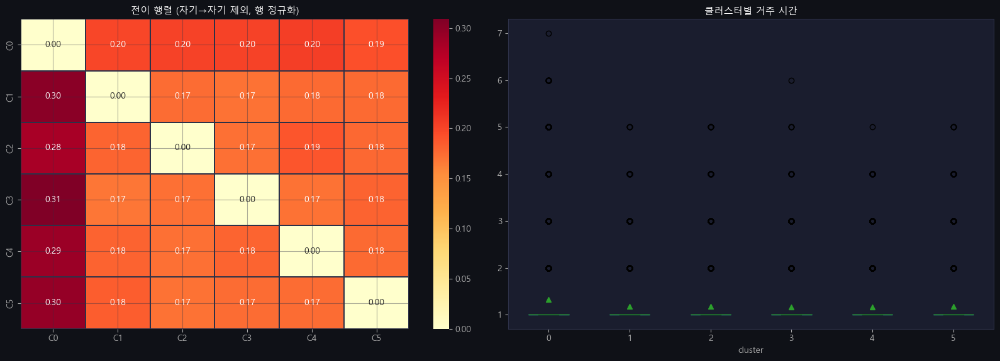


클러스터별 평균 거주 시간:
         mean  median  max
cluster                   
0         1.3     1.0    7
1         1.2     1.0    5
2         1.2     1.0    5
3         1.2     1.0    6
4         1.2     1.0    5
5         1.2     1.0    5

📌 클러스터별 최소 사이클: 14~28 → window=30이면 일부 padding 발생 가능
   → 3-6 윈도우 비교에서 통계적 최적 window=30 확인 후 확정


In [97]:
print('=== 2-4. 클러스터 전이 / 거주 시간 (EXTRA-A) ===')
trans = np.zeros((N_CLUSTERS,N_CLUSTERS), dtype=int)
dwell_times = []
for uid in train_raw['unit_nr'].unique():
    seq = train_raw[train_raw['unit_nr']==uid].sort_values('time_cycles')['op_cluster'].values
    for a,b in zip(seq[:-1],seq[1:]): trans[a,b] += 1
    rl = 1
    for k in range(1,len(seq)):
        if seq[k]==seq[k-1]: rl += 1
        else: dwell_times.append((seq[k-1],rl)); rl=1
    dwell_times.append((seq[-1],rl))

dwell_df = pd.DataFrame(dwell_times, columns=['cluster','cycles'])
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('2-4. 클러스터 전이 행렬 & 거주 시간 [EXTRA-A]', fontsize=13, fontweight='bold')
trans_off = trans.copy().astype(float); np.fill_diagonal(trans_off,0)
trans_norm = trans_off / np.maximum(trans_off.sum(axis=1,keepdims=True),1)
sns.heatmap(trans_norm, ax=axes[0], cmap='YlOrRd', annot=True, fmt='.2f',
            xticklabels=[f'C{i}' for i in range(N_CLUSTERS)],
            yticklabels=[f'C{i}' for i in range(N_CLUSTERS)],
            linewidths=0.3, linecolor=GRID)
axes[0].set_title('전이 행렬 (자기→자기 제외, 행 정규화)')
dwell_df.boxplot(column='cycles', by='cluster', ax=axes[1], grid=False, patch_artist=True, showmeans=True)
axes[1].set_title('클러스터별 거주 시간')
plt.suptitle(''); plt.tight_layout(); plt.show()
print('\n클러스터별 평균 거주 시간:')
print(dwell_df.groupby('cluster')['cycles'].agg(['mean','median','max']).round(1))
print('\n📌 클러스터별 최소 사이클: 14~28 → window=30이면 일부 padding 발생 가능')
print('   → 3-6 윈도우 비교에서 통계적 최적 window=30 확인 후 확정')


### 2-5. 엔진별 cluster 비중 vs 수명 [EXTRA-B]

,cluster,spearman_r,p-value,판정
0,C0,-0.025,0.6947,비유의 ⚠️
1,C1,0.184,0.0036,유의 ✅
2,C2,0.011,0.8643,비유의 ⚠️
3,C3,0.003,0.9583,비유의 ⚠️
4,C4,-0.116,0.0680,비유의 ⚠️
5,C5,-0.013,0.8385,비유의 ⚠️


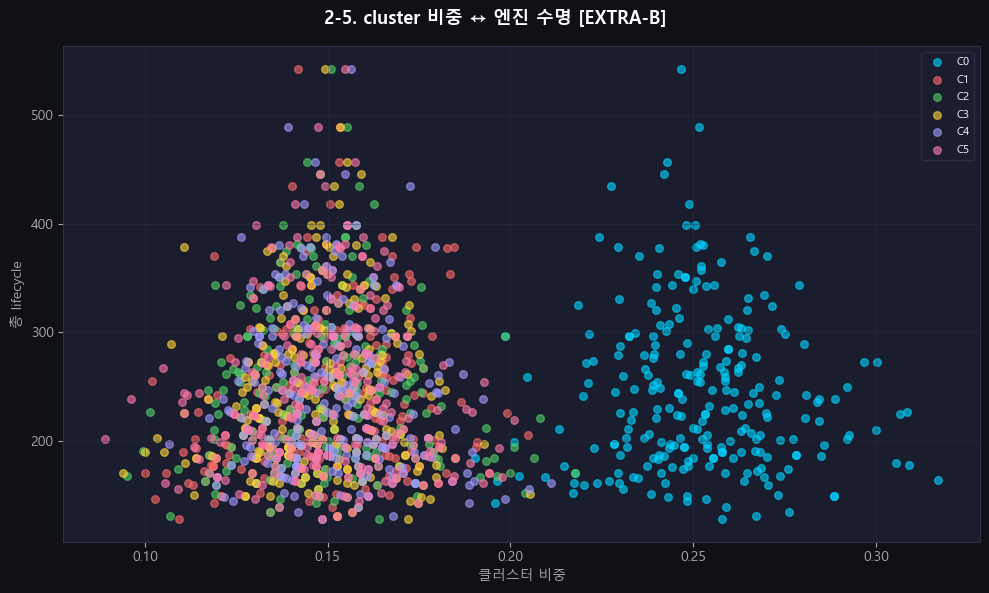

In [98]:
mc = train_raw.groupby('unit_nr')['time_cycles'].max().rename('lifecycle')
mix = train_raw.groupby(['unit_nr','op_cluster']).size().unstack(fill_value=0)
mix = mix.div(mix.sum(axis=1), axis=0)
mix.columns = [f'C{c}_pct' for c in mix.columns]
mix = mix.join(mc)
rows = []
for c in range(N_CLUSTERS):
    col = f'C{c}_pct'
    if col not in mix.columns: continue
    r, p = spearmanr(mix[col], mix['lifecycle'])
    rows.append({'cluster':f'C{c}','spearman_r':round(r,3),'p-value':round(p,4),
                 '판정':'유의 ✅' if p<0.05 else '비유의 ⚠️'})
display(pd.DataFrame(rows))
fig, ax = plt.subplots(figsize=(10, 6))
fig.suptitle('2-5. cluster 비중 ↔ 엔진 수명 [EXTRA-B]', fontsize=13, fontweight='bold')
for c in range(N_CLUSTERS):
    col = f'C{c}_pct'
    if col not in mix.columns: continue
    ax.scatter(mix[col], mix['lifecycle'], color=CLUSTER_COLORS[c], alpha=0.6, s=30, label=f'C{c}')
ax.set_xlabel('클러스터 비중'); ax.set_ylabel('총 lifecycle'); ax.legend(fontsize=8)
plt.tight_layout(); plt.show()


### 2-6. Sensor trajectory by RUL bin × Cluster [EXTRA-C]

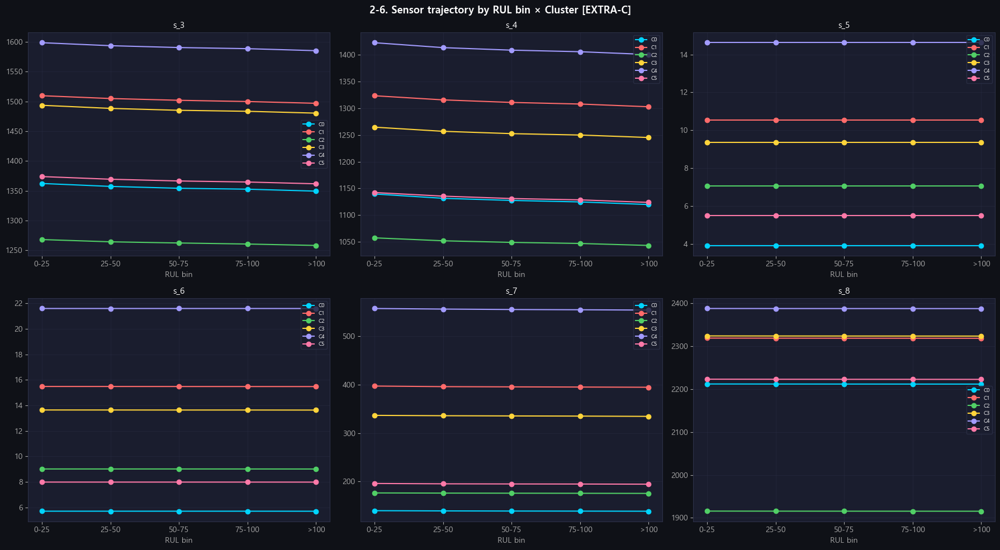

In [99]:
mc_c = train_raw.groupby('unit_nr')['time_cycles'].max().rename('max_c')
trj = train_raw.join(mc_c, on='unit_nr')
trj['RUL'] = trj['max_c'] - trj['time_cycles']
trj['rul_bin'] = pd.cut(trj['RUL'], bins=[-1,25,50,75,100,1e6], labels=['0-25','25-50','50-75','75-100','>100'])
top6 = SENSOR_COLS[2:8]
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('2-6. Sensor trajectory by RUL bin × Cluster [EXTRA-C]', fontsize=13, fontweight='bold')
for ax, s in zip(axes.flat, top6):
    for c in range(N_CLUSTERS):
        sub = trj[trj['op_cluster']==c]
        means = sub.groupby('rul_bin', observed=True)[s].mean()
        ax.plot(means.index.astype(str), means.values, color=CLUSTER_COLORS[c], marker='o', lw=1.5, label=f'C{c}')
    ax.set_title(s); ax.set_xlabel('RUL bin'); ax.legend(fontsize=7)
plt.tight_layout(); plt.show()


---
## 3. 전처리 전 EDA
### 3-1. 기초 통계 & 데이터 품질

In [100]:
print('=== 기초 통계 & 데이터 품질 ===')
quality = pd.DataFrame({
    '구분':['Train','Test'],
    '전체 행':[len(train_raw),len(test_raw)],
    '결측치':[train_raw.isnull().sum().sum(),test_raw.isnull().sum().sum()],
    '중복 행':[train_raw.duplicated().sum(),test_raw.duplicated().sum()],
    '음수 센서':[(train_raw[SENSOR_COLS]<0).sum().sum(),(test_raw[SENSOR_COLS]<0).sum().sum()],
    '엔진 수':[train_raw['unit_nr'].nunique(),test_raw['unit_nr'].nunique()],
    '운전 조건':[train_raw['op_cluster'].nunique(),test_raw['op_cluster'].nunique()],
    '판정':['✅ 정상','✅ 정상'],
}).set_index('구분')
display(quality)

desc = train_raw[SENSOR_COLS].describe().T
desc['CV(변동계수)'] = (desc['std']/desc['mean'].abs()).round(5)
display(desc[['mean','std','min','max','CV(변동계수)']].style
        .background_gradient(subset=['CV(변동계수)'],cmap='YlOrRd').format('{:.4f}'))
print('\n📌 확실한 상수: s_5,s_16,s_18,s_19 (CV=0.0000)')
print('📌 수동 제거 유력: s_1(CV=0.0559,MK없음), s_6(CV=0.4697,RUL상관≈0)')
print('📌 유지 확정: s_10(대응표본유의,클러스터별 Pearson|r|=0.40)')


=== 기초 통계 & 데이터 품질 ===


,전체 행,결측치,중복 행,음수 센서,엔진 수,운전 조건,판정
구분,,,,,,,
Train,61249,0,0,0,249,6,✅ 정상
Test,41214,0,0,0,248,6,✅ 정상


,mean,std,min,max,CV(변동계수)
s_1,472.8824,26.4368,445.0000,518.6700,0.0559
s_2,579.4201,37.3426,535.4800,644.4200,0.0644
s_3,1417.8966,106.1676,1242.6700,1613.0000,0.0749
s_4,1201.9154,119.3276,1024.4200,1440.7700,0.0993
s_5,8.0316,3.6229,3.9100,14.6200,0.4511
s_6,11.5895,5.4440,5.6700,21.6100,0.4697
s_7,283.3286,146.8802,136.1700,570.8100,0.5184
s_8,2228.6860,145.3482,1914.7200,2388.6400,0.0652
s_9,8524.6733,336.9275,7984.5100,9196.8100,0.0395
s_10,1.0964,0.1277,0.9300,1.3200,0.1164



📌 확실한 상수: s_5,s_16,s_18,s_19 (CV=0.0000)
📌 수동 제거 유력: s_1(CV=0.0559,MK없음), s_6(CV=0.4697,RUL상관≈0)
📌 유지 확정: s_10(대응표본유의,클러스터별 Pearson|r|=0.40)


### 📊 3-1. 기초 통계 결과
- 결측치·중복·음수 모두 0 ✅
- **확실한 상수 센서**: s_5, s_16, s_18, s_19 → 제거 확정
- **s_1**: CV=0.0559로 CONST_THR 초과 → 자동 제거 안 됨, 통계 검정 결과 수동 제거 확정
- **s_6**: CV=0.4697로 변동 있으나 RUL 상관 ≈ 0 → 수동 제거 확정
- **s_10**: CV=0.1164, 대응표본 유의, 클러스터별 Pearson |r|=0.40 → **유지 확정**
- **멀티모달 분포** → 운전 조건 6가지 혼재 반영


### 3-2. 엔진 수명 분포

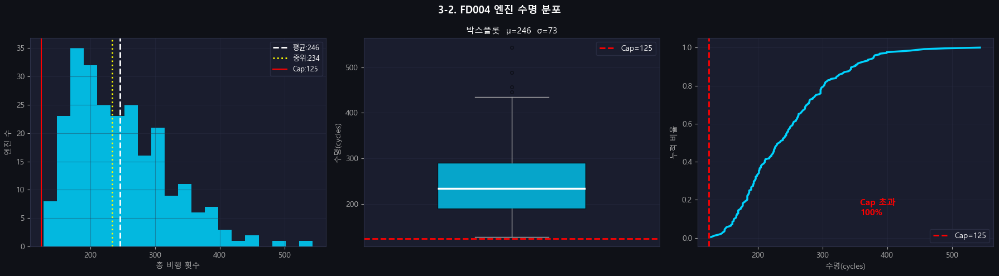

평균=246.0  중위=234.0  min=128  max=543
100% 엔진 수명 125 초과 → Cap=125 근거 유지


In [101]:
lifecycles = train_raw.groupby('unit_nr')['time_cycles'].max()
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('3-2. FD004 엔진 수명 분포', fontsize=13, fontweight='bold')
ax = axes[0]
ax.hist(lifecycles, bins=20, color=C[0], alpha=0.85, edgecolor='none')
ax.axvline(lifecycles.mean(), color='white', ls='--', lw=2, label=f'평균:{lifecycles.mean():.0f}')
ax.axvline(lifecycles.median(), color='yellow', ls=':', lw=2, label=f'중위:{lifecycles.median():.0f}')
ax.axvline(RUL_CAP, color='red', ls='-', lw=1.5, label=f'Cap:{RUL_CAP}')
ax.set_xlabel('총 비행 횟수'); ax.set_ylabel('엔진 수'); ax.legend(fontsize=9)
bp = axes[1].boxplot(lifecycles, patch_artist=True, vert=True, widths=0.5,
                     medianprops=dict(color='white',lw=2.5),
                     whiskerprops=dict(color=GRAY),capprops=dict(color=GRAY),
                     flierprops=dict(marker='o',color=GRAY,markersize=4,alpha=0.5))
bp['boxes'][0].set_facecolor(C[0]); bp['boxes'][0].set_alpha(0.75)
axes[1].axhline(RUL_CAP, color='red', ls='--', lw=2, label=f'Cap={RUL_CAP}')
axes[1].set_ylabel('수명(cycles)'); axes[1].set_title(f'박스플롯  μ={lifecycles.mean():.0f}  σ={lifecycles.std():.0f}')
axes[1].set_xticks([]); axes[1].legend()
lc_sorted = np.sort(lifecycles); cdf = np.arange(1,len(lc_sorted)+1)/len(lc_sorted)
axes[2].plot(lc_sorted, cdf, color=C[0], lw=2.5)
axes[2].axvline(RUL_CAP, color='red', ls='--', lw=2, label=f'Cap={RUL_CAP}')
pct_above = (lifecycles>RUL_CAP).mean()*100
axes[2].text(0.55, 0.15, f'Cap 초과\n{pct_above:.0f}%', transform=axes[2].transAxes, fontsize=11, color='red', fontweight='bold')
axes[2].set_xlabel('수명(cycles)'); axes[2].set_ylabel('누적 비율'); axes[2].legend()
plt.tight_layout(); plt.show()
print(f'평균={lifecycles.mean():.1f}  중위={lifecycles.median():.1f}  min={lifecycles.min()}  max={lifecycles.max()}')
print(f'100% 엔진 수명 {RUL_CAP} 초과 → Cap={RUL_CAP} 근거 유지')


### 📊 3-2. 엔진 수명 분포 결과
| 항목 | FD002 | FD003 | **FD004** |
|---|---|---|---|
| 평균 | 207 | 247 | **246** |
| 중위 | 199 | 220 | **234** |
| 최솟값 | 128 | 145 | **128** |
| 최댓값 | 378 | 525 | **543** |
| Cap=125 초과 | 100% | 100% | **100%** |

> **100% 엔진 Cap=125 초과 → Cap=125 확정**  
> FD003과 평균 수명 거의 동일 (247 vs 246) → 고장 모드 2가지가 수명 분포에 더 큰 영향  
> min 수명=128 → FD002와 동일 → cap=130부터 정상구간 침범 (FD002 패턴과 동일)


### 3-3. 클러스터별 운전 조건 분포 & 센서 분포

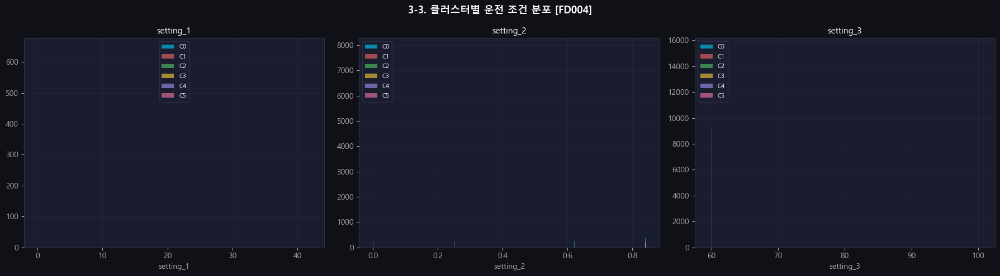

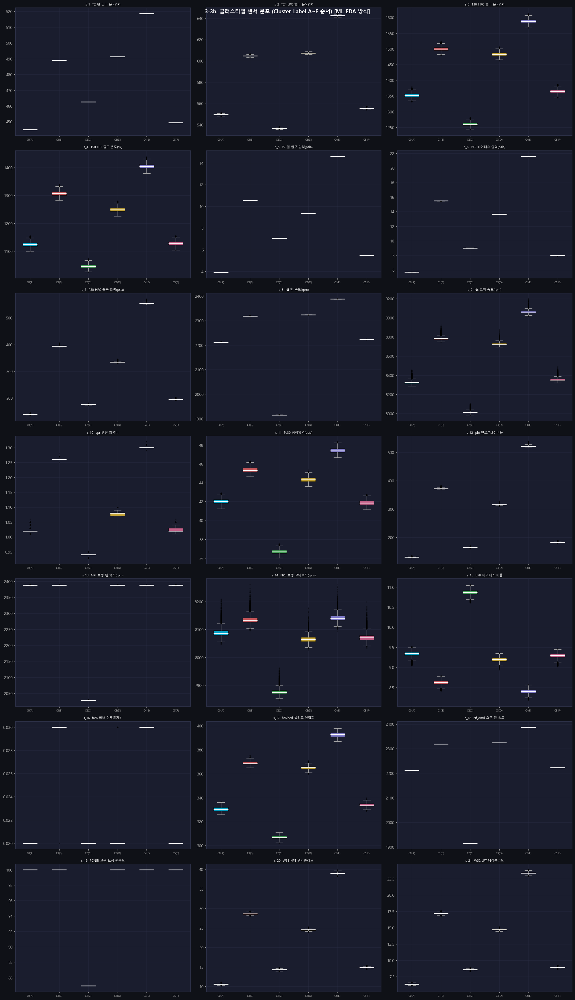

In [102]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('3-3. 클러스터별 운전 조건 분포 [FD004]', fontsize=13, fontweight='bold')
for ax, op in zip(axes, OP_COLS):
    for c in range(N_CLUSTERS):
        ax.hist(train_raw[train_raw['op_cluster']==c][op], bins=30, alpha=0.6,
                color=CLUSTER_COLORS[c], label=f'C{c}', edgecolor='none')
    ax.set_title(f'{op}'); ax.set_xlabel(op); ax.legend(fontsize=8)
plt.tight_layout(); plt.show()

# 클러스터별 센서 분포 박스플롯 (ML_EDA 방식: Cluster_Label A~F 순서)
train_eda = train_raw.copy()
train_eda['cluster'] = cluster_labels_eda

n_cols, n_rows = 3, 7
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 35))
fig.suptitle('3-3b. 클러스터별 센서 분포 (Cluster_Label A~F 순서) [ML_EDA 방식]', fontsize=13, fontweight='bold')
for ax, s in zip(axes.flat, SENSOR_COLS):
    data_by_cluster = [train_eda[train_eda['cluster']==c][s].values for c in range(N_CLUSTERS)]
    bp = ax.boxplot(data_by_cluster, patch_artist=True,
                    medianprops=dict(color='white',lw=2),
                    whiskerprops=dict(color=GRAY),capprops=dict(color=GRAY),
                    flierprops=dict(marker='o',color=GRAY,markersize=2,alpha=0.3))
    for patch, color in zip(bp['boxes'], CLUSTER_COLORS): patch.set_facecolor(color); patch.set_alpha(0.75)
    ax.set_title(f'{s}  {SENSOR_DESC.get(s,"")[:20]}', fontsize=8)
    ax.set_xticklabels([f'C{c}({CLUSTER_MAP[c]})' for c in range(N_CLUSTERS)], fontsize=7)
for ax in axes.flat[len(SENSOR_COLS):]: ax.set_visible(False)
plt.tight_layout(); plt.show()


### 3-4. 센서 분포 & 이상치 (전처리 전 — 21개)

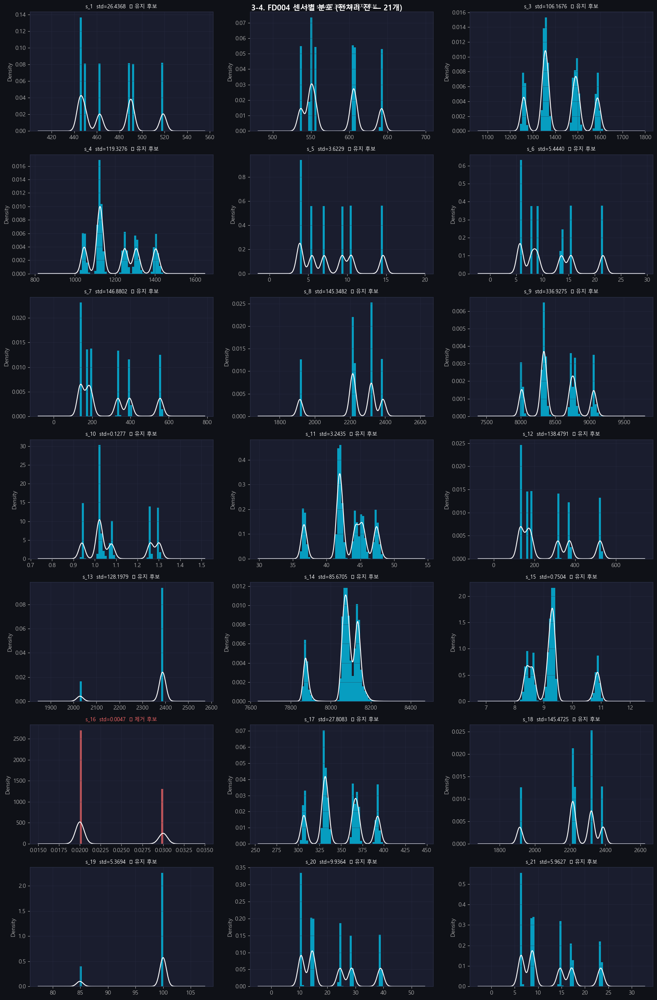

--- IQR 기준 이상치 탐지 ---


,센서,이상치 수,비율(%)
7,s_8,9139,14.921
10,s_11,3102,5.065
12,s_13,11546,18.851
13,s_14,9162,14.959
14,s_15,9139,14.921
17,s_18,9139,14.921
18,s_19,9139,14.921



📌 IQR 이상치는 멀티모달 분포에서 다른 조건의 정상값 오탐 → 제거 불필요
📌 s_18, s_19 이상치 14.9% → 분산≈0라 IQR≈0 → 정상값도 이상치 오탐


In [103]:
n_cols, n_rows = 3, 7
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows*3.5))
fig.suptitle('3-4. FD004 센서별 분포 (전처리 전 — 21개)', fontsize=13, fontweight='bold')
for ax, s in zip(axes.flat, SENSOR_COLS):
    data = train_raw[s].dropna(); std_val = data.std()
    is_const = std_val < CONST_THR; color = C[1] if is_const else C[0]
    ax.hist(data, bins=40, color=color, alpha=0.7, density=True, edgecolor='none')
    try: data.plot.kde(ax=ax, color='white', lw=1.5)
    except: pass
    label = '❌ 제거 후보' if is_const else '✅ 유지 후보'
    ax.set_title(f'{s}  std={std_val:.4f}  {label}', fontsize=9,
                 color=C[1] if is_const else WHITE)
for ax in axes.flat[len(SENSOR_COLS):]: ax.set_visible(False)
plt.tight_layout(); plt.show()

print('--- IQR 기준 이상치 탐지 ---')
outlier_rows = []
for s in SENSOR_COLS:
    Q1,Q3 = train_raw[s].quantile(0.25),train_raw[s].quantile(0.75); IQR=Q3-Q1
    n_out = ((train_raw[s]<Q1-1.5*IQR)|(train_raw[s]>Q3+1.5*IQR)).sum()
    outlier_rows.append({'센서':s,'이상치 수':n_out,'비율(%)':round(n_out/len(train_raw)*100,3)})
out_df = pd.DataFrame(outlier_rows); nonzero = out_df[out_df['이상치 수']>0]
if len(nonzero): display(nonzero)
print('\n📌 IQR 이상치는 멀티모달 분포에서 다른 조건의 정상값 오탐 → 제거 불필요')
print('📌 s_18, s_19 이상치 14.9% → 분산≈0라 IQR≈0 → 정상값도 이상치 오탐')


### 3-5. 클러스터별 센서 분포 비교 & Kruskal-Wallis

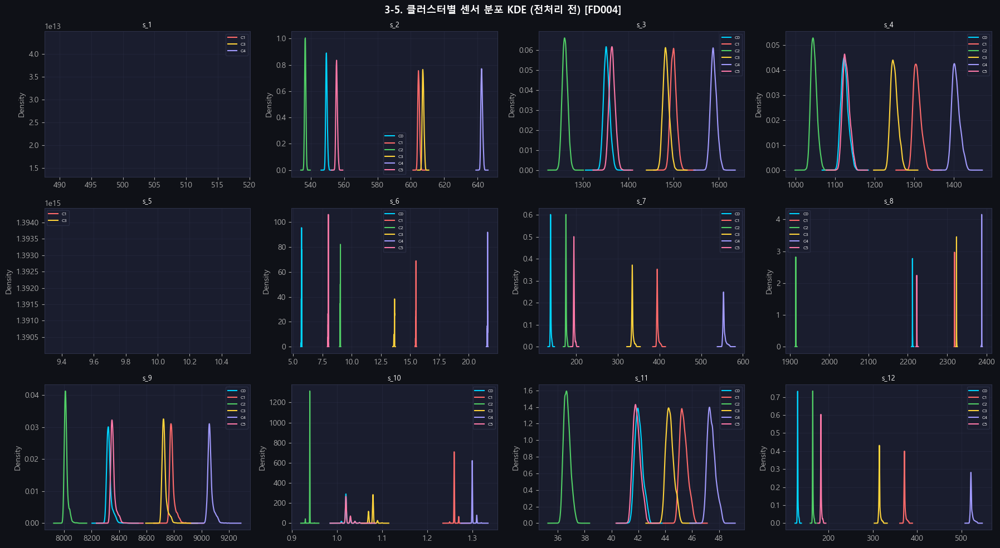

--- Kruskal-Wallis + BH-FDR ---


,센서,H,p-value,p_adj_BH,판정
0,s_1,61248.00,0.0,0.0,✅ 유의
1,s_2,59246.97,0.0,0.0,✅ 유의
2,s_3,58112.26,0.0,0.0,✅ 유의
3,s_4,56635.10,0.0,0.0,✅ 유의
4,s_5,61248.00,0.0,0.0,✅ 유의
5,s_6,59448.48,0.0,0.0,✅ 유의
6,s_7,59247.34,0.0,0.0,✅ 유의
7,s_8,59248.20,0.0,0.0,✅ 유의
8,s_9,58070.51,0.0,0.0,✅ 유의
9,s_10,58531.83,0.0,0.0,✅ 유의



BH-FDR 유의: 21/21개  → 클러스터별 정규화 반드시 필요


In [104]:
show_sensors = SENSOR_COLS[:12]
fig, axes = plt.subplots(3, 4, figsize=(18, 10))
fig.suptitle('3-5. 클러스터별 센서 분포 KDE (전처리 전) [FD004]', fontsize=13, fontweight='bold')
for ax, s in zip(axes.flat, show_sensors):
    for c in range(N_CLUSTERS):
        data = train_raw[train_raw['op_cluster']==c][s].dropna()
        if len(data)>1:
            try: data.plot.kde(ax=ax, color=CLUSTER_COLORS[c], lw=1.5, label=f'C{c}')
            except: pass
    ax.set_title(s,fontsize=9); ax.legend(fontsize=6)
for ax in axes.flat[len(show_sensors):]: ax.set_visible(False)
plt.tight_layout(); plt.show()

print('--- Kruskal-Wallis + BH-FDR ---')
kw_rows = []
for s in SENSOR_COLS:
    groups = [train_raw[train_raw['op_cluster']==c][s].dropna().values for c in range(N_CLUSTERS)]
    groups = [g for g in groups if len(g)>1]
    h,p = kruskal(*groups) if len(groups)>=2 else (np.nan,np.nan)
    kw_rows.append({'센서':s,'H':round(h,2) if np.isfinite(h) else np.nan,
                    'p-value':round(p,4) if np.isfinite(p) else np.nan})
kw_df = pd.DataFrame(kw_rows)
_rej,_padj,*_ = multipletests(kw_df['p-value'].fillna(1).values, alpha=0.05, method='fdr_bh')
kw_df['p_adj_BH'] = np.round(_padj,4)
kw_df['판정'] = ['✅ 유의' if r else '⚠️ 비유의' for r in _rej]
display(kw_df)
print(f'\nBH-FDR 유의: {sum(_rej)}/{len(kw_df)}개  → 클러스터별 정규화 반드시 필요')


### 3-6. 센서 간 상관관계 히트맵 (전처리 전)

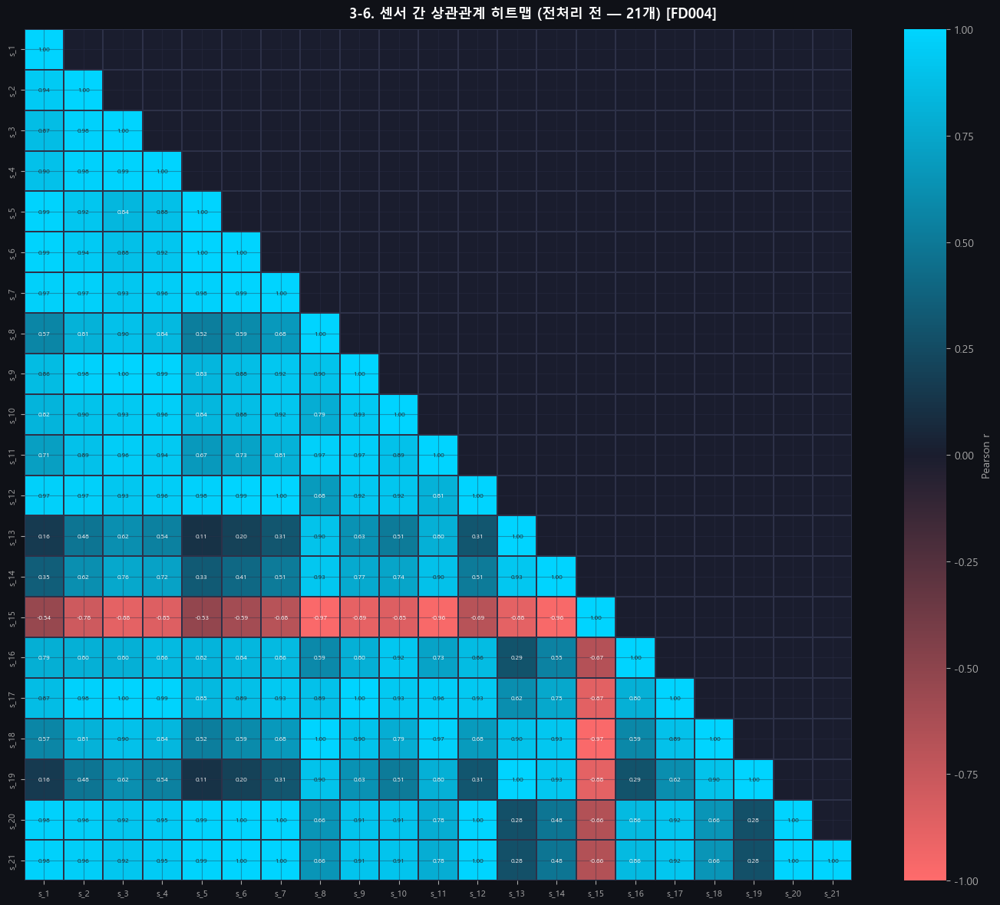

고상관 쌍 (|r|>0.9): 87개  (FD002와 동일 수준, 운전조건 공변동)


,센서A,센서B,r
0,s_1,s_2,0.944
1,s_1,s_5,0.987
2,s_1,s_6,0.987
3,s_1,s_7,0.973
4,s_1,s_12,0.973
5,s_1,s_20,0.978
6,s_1,s_21,0.978
7,s_2,s_3,0.982
8,s_2,s_4,0.981
9,s_2,s_5,0.917


In [105]:
corr_before = train_raw[SENSOR_COLS].corr()
fig, ax = plt.subplots(figsize=(14, 12))
fig.suptitle('3-6. 센서 간 상관관계 히트맵 (전처리 전 — 21개) [FD004]', fontsize=13, fontweight='bold')
mask = np.triu(np.ones_like(corr_before, dtype=bool), k=1)
sns.heatmap(corr_before, ax=ax, mask=mask, cmap=cmap_rg, center=0,
            vmin=-1, vmax=1, annot=True, fmt='.2f', annot_kws={'size':6},
            linewidths=0.3, linecolor=GRID, cbar_kws={'label':'Pearson r'})
ax.tick_params(labelsize=8); plt.tight_layout(); plt.show()
pairs = [(SENSOR_COLS[i],SENSOR_COLS[j],round(corr_before.iloc[i,j],3))
         for i in range(len(SENSOR_COLS)) for j in range(i+1,len(SENSOR_COLS))
         if abs(corr_before.iloc[i,j])>0.9]
print(f'고상관 쌍 (|r|>0.9): {len(pairs)}개  (FD002와 동일 수준, 운전조건 공변동)')
if pairs: display(pd.DataFrame(pairs,columns=['센서A','센서B','r']).head(15))


### 📊 3-6. 센서 상관관계 결과
- 고상관 쌍 (|r|>0.9): **87개** → FD002와 동일, FD001(1개)·FD003(3개) 대비 급증
- 원인: 운전 조건 6가지 공변동
- **s_20 ↔ s_21 r=1.000** → 완전히 동일한 정보 (별도 제거 없이 모델에서 처리)
- 클러스터별 정규화 후 조건 영향 제거 시 상관관계 낮아질 것으로 예상


### 3-7. 센서별 열화 트렌드 (클러스터별 r 평균)

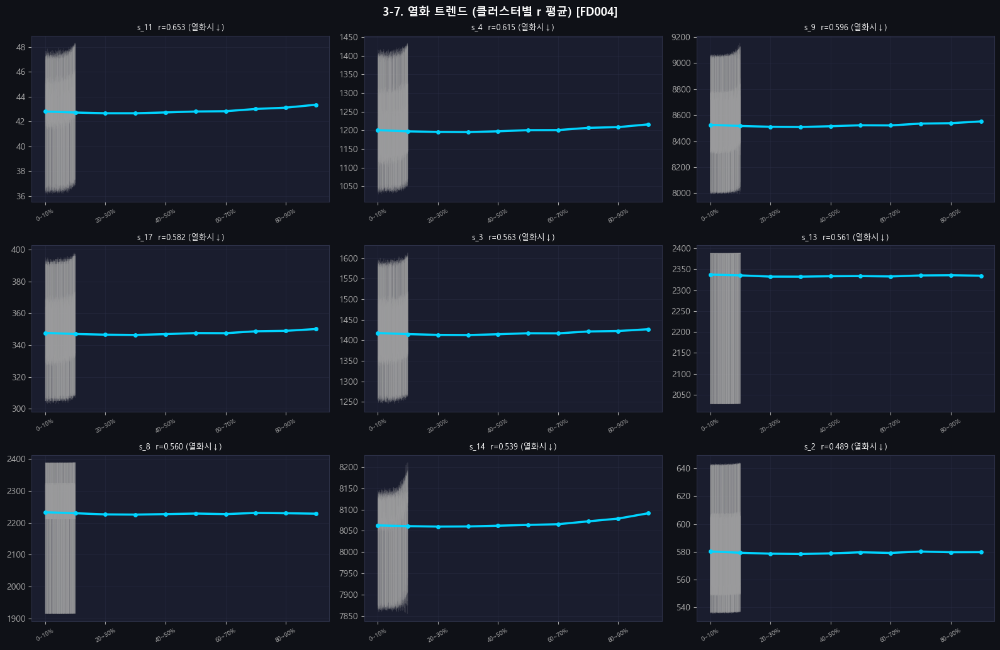

📌 FD004는 FD002와 동일하게 전체 기준 트렌드 불명확 → 클러스터별 정규화 후 명확해질 것


In [106]:
mc_t = train_raw.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_trend = train_raw.join(mc_t, on='unit_nr')
tr_trend['norm_life'] = tr_trend['time_cycles']/tr_trend['max_c']
tr_trend['RUL']       = tr_trend['max_c'] - tr_trend['time_cycles']
bins = np.linspace(0,1,11)
labels_life = [f'{int(a*100)}~{int(b*100)}%' for a,b in zip(bins[:-1],bins[1:])]
tr_trend['life_bin'] = pd.cut(tr_trend['norm_life'], bins=bins, labels=labels_life)
trend_mean = tr_trend.groupby('life_bin', observed=True)[SENSOR_COLS].mean()

cluster_corrs = []
for c in range(N_CLUSTERS):
    sub = tr_trend[tr_trend['op_cluster']==c]
    if len(sub)>10: cluster_corrs.append(sub[SENSOR_COLS+['norm_life']].corr()['norm_life'][SENSOR_COLS])
corr_with_life = pd.concat(cluster_corrs, axis=1).mean(axis=1)
trend_sensors = corr_with_life[corr_with_life.abs()>0.05].sort_values(key=abs,ascending=False).index.tolist()[:9]
if not trend_sensors:
    print('📌 FD004: 조건 6가지 혼재로 전체 기준 트렌드 불명확 → 클러스터별 정규화 후 재확인 예정')
else:
    n_c=3; n_r=(len(trend_sensors)+n_c-1)//n_c
    fig, axes = plt.subplots(n_r, n_c, figsize=(16, n_r*3.5))
    fig.suptitle('3-7. 열화 트렌드 (클러스터별 r 평균) [FD004]', fontsize=13, fontweight='bold')
    x_pos = range(len(labels_life)); sample_units = tr_trend['unit_nr'].unique()[:15]
    for ax, s in zip(np.array(axes).flat, trend_sensors):
        for u in sample_units:
            sub = tr_trend[tr_trend['unit_nr']==u].sort_values('norm_life')
            ax.plot(sub['norm_life'],sub[s],color=GRAY,alpha=0.15,lw=0.6)
        ax.plot(x_pos, trend_mean[s].values, color=C[0], lw=2.5, marker='o', markersize=4)
        r = corr_with_life[s]
        ax.set_title(f'{s}  r={r:.3f} ({"열화시↑" if r<0 else "열화시↓"})', fontsize=9)
        ax.set_xticks(list(x_pos)[::2]); ax.set_xticklabels(labels_life[::2], rotation=30, fontsize=7)
    for ax in np.array(axes).flat[len(trend_sensors):]: ax.set_visible(False)
    plt.tight_layout(); plt.show()
    print('📌 FD004는 FD002와 동일하게 전체 기준 트렌드 불명확 → 클러스터별 정규화 후 명확해질 것')


### 3-8. RUL 상관계수 (클러스터별 평균 + 히트맵)

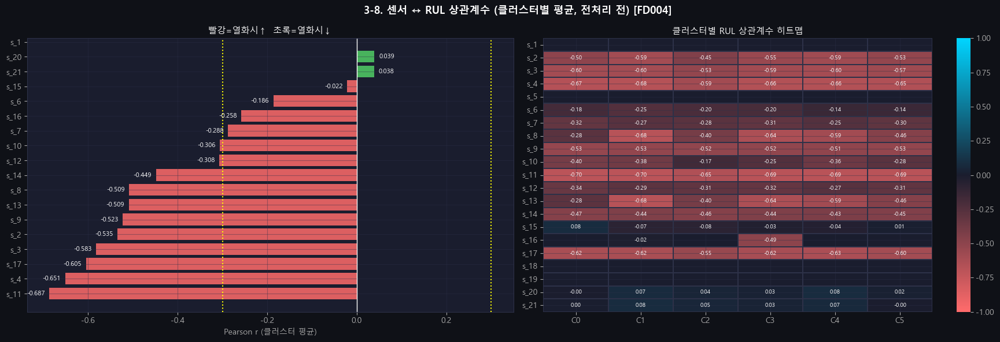

|r|>0.3: 11개  (FD002처럼 전체 기준 |r|≈0 → 클러스터별로 봐야 함)


In [107]:
cluster_rul_corrs = []
for c in range(N_CLUSTERS):
    sub = tr_trend[tr_trend['op_cluster']==c]
    if len(sub)>10: cluster_rul_corrs.append(sub[SENSOR_COLS+['RUL']].corr()['RUL'][SENSOR_COLS])

rul_corr_before = pd.concat(cluster_rul_corrs, axis=1).mean(axis=1).sort_values()
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('3-8. 센서 ↔ RUL 상관계수 (클러스터별 평균, 전처리 전) [FD004]', fontsize=13, fontweight='bold')
bar_colors = [C[1] if v<0 else C[2] for v in rul_corr_before]
bars = axes[0].barh(rul_corr_before.index, rul_corr_before.values, color=bar_colors, alpha=0.85)
axes[0].axvline(0,color='white',lw=1); axes[0].axvline(0.3,color='yellow',lw=1.5,ls=':'); axes[0].axvline(-0.3,color='yellow',lw=1.5,ls=':')
axes[0].set_xlabel('Pearson r (클러스터 평균)'); axes[0].set_title('빨강=열화시↑  초록=열화시↓')
for bar, val in zip(bars, rul_corr_before.values):
    axes[0].text(val+(0.01 if val>=0 else -0.01), bar.get_y()+bar.get_height()/2,
                 f'{val:.3f}', va='center', ha='left' if val>=0 else 'right', fontsize=8)
cluster_corr_matrix = pd.concat(cluster_rul_corrs, axis=1)
cluster_corr_matrix.columns = [f'C{i}' for i in range(len(cluster_rul_corrs))]
sns.heatmap(cluster_corr_matrix, ax=axes[1], cmap=cmap_rg, center=0, vmin=-1, vmax=1,
            annot=True, fmt='.2f', annot_kws={'size':7}, linewidths=0.3, linecolor=GRID)
axes[1].set_title('클러스터별 RUL 상관계수 히트맵')
plt.tight_layout(); plt.show()
high_corr = rul_corr_before[rul_corr_before.abs()>0.3]
print(f'|r|>0.3: {len(high_corr)}개  (FD002처럼 전체 기준 |r|≈0 → 클러스터별로 봐야 함)')


### 📊 3-8. RUL 상관계수 결과
- **전체 기준 모든 센서 |r|<0.08** → FD003(12개 |r|>0.3) 대비 극도로 낮음
- FD002와 동일한 패턴 → 운전 조건 혼재로 RUL 신호 완전히 묻힘
- 클러스터별 정규화 후 클러스터별 |r|이 0.4~0.7로 급상승 예상
- **s_10, s_6 RUL 상관 거의 0** → 제거 근거 추가 확보


---
## 4. 통계 검정 (11개)

| 검정 | 목적 |
|---|---|
| 4-1. 시차상관관계 (전체 + 클러스터별★) | 윈도우 크기 결정 |
| 4-2. Mann-Kendall (전체 + 클러스터별★) | 열화 트렌드 통계 검정·Gaussian 근거 |
| 4-3. 대응 표본 검정 | 초기 vs 말기 센서값 차이 |
| 4-4. RUL Cap 검증 | Cap=125 확정 |
| 4-5. Gaussian σ 검증 (전체 + 클러스터별★) | σ=2 확정 |
| 4-6. 윈도우 크기 비교 | Window=30 확정 |
| 4-7. ANOVA | 클러스터별 정규화 필요성 증명 |
| 4-8. Kruskal-Wallis | 클러스터별 수명 분포 차이 |
| **4-9. Mann-Whitney U ★** | **Fan vs HPC 엔진 그룹 간 RUL 차이 [FD004 전용]** |
| **4-10. Levene's Test ★** | **FD002/003 vs FD004 분산 동질성 [FD004 전용]** |
| **4-11. Pearson 클러스터별 ★** | **클러스터별 RUL 신호 확인 → 제거 센서 확정 [FD004 전용]** |


### 4-1. 시차 상관관계 (전체 기준 + 클러스터별★)

=== 4-1-1. 시차 상관관계 (전체 기준) ===


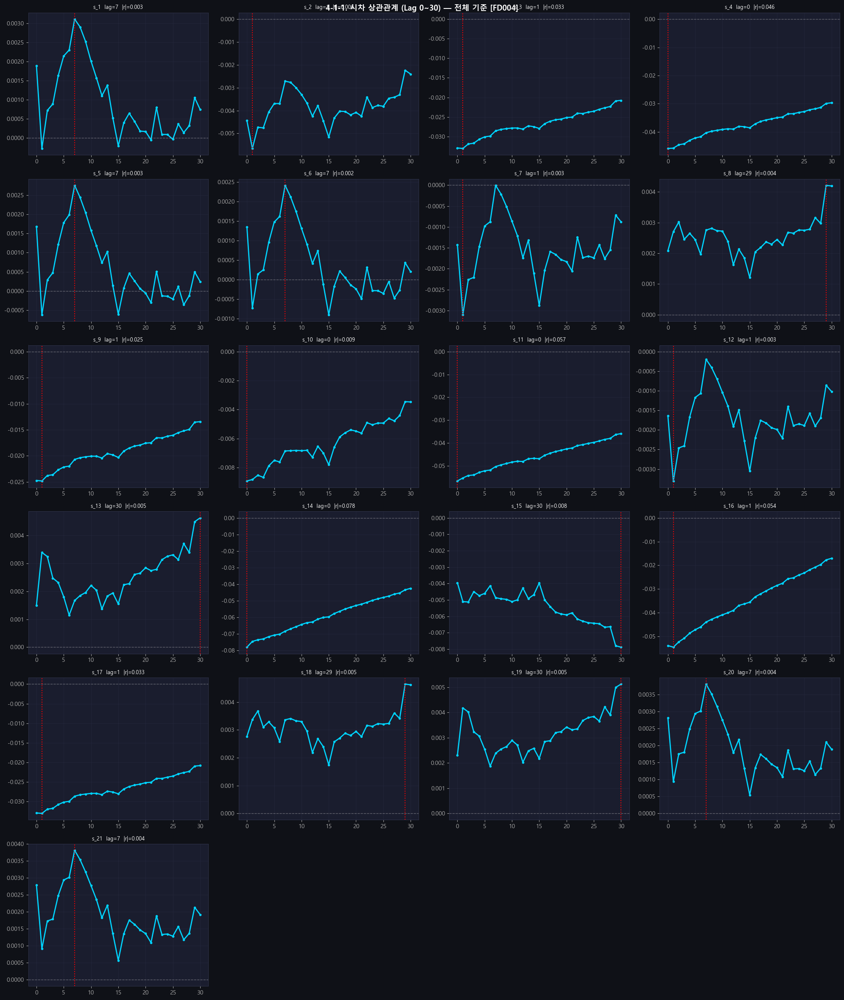


📌 전체 기준 |r| 최대 0.078 → FD003(0.689) 대비 극도로 낮음
   운전 조건 혼재로 RUL 신호 묻힘 → 클러스터별 분석 필요


In [108]:
print('=== 4-1-1. 시차 상관관계 (전체 기준) ===')
tr_lag = tr_trend.copy()
max_lag = 30
lag_results = {}
for s in SENSOR_COLS:
    lag_corrs = []
    for lag in range(0, max_lag+1):
        shifted = tr_lag.groupby('unit_nr')[s].shift(lag)
        valid = ~shifted.isna()
        r = tr_lag.loc[valid,'RUL'].corr(shifted[valid])
        lag_corrs.append(r)
    lag_results[s] = lag_corrs

n_cols=4; n_rows=(len(SENSOR_COLS)+n_cols-1)//n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows*4))
fig.suptitle('4-1-1. 시차 상관관계 (Lag 0~30) — 전체 기준 [FD004]', fontsize=13, fontweight='bold')
for ax, s in zip(axes.flat, SENSOR_COLS):
    lag_corrs = lag_results[s]
    best_lag = int(np.argmax(np.abs(lag_corrs))); best_r = lag_corrs[best_lag]
    ax.plot(range(max_lag+1), lag_corrs, color=C[0], lw=2, marker='o', markersize=3)
    ax.axhline(0, color=GRAY, ls='--', lw=1, alpha=0.5)
    ax.axvline(best_lag, color='red', ls=':', lw=1.5)
    ax.set_title(f'{s}  lag={best_lag}  |r|={abs(best_r):.3f}', fontsize=9)
for ax in axes.flat[len(SENSOR_COLS):]: ax.set_visible(False)
plt.tight_layout(); plt.show()
print('\n📌 전체 기준 |r| 최대 0.078 → FD003(0.689) 대비 극도로 낮음')
print('   운전 조건 혼재로 RUL 신호 묻힘 → 클러스터별 분석 필요')


=== 4-1-2. 클러스터별 시차 상관관계 (lag 0~15) ===


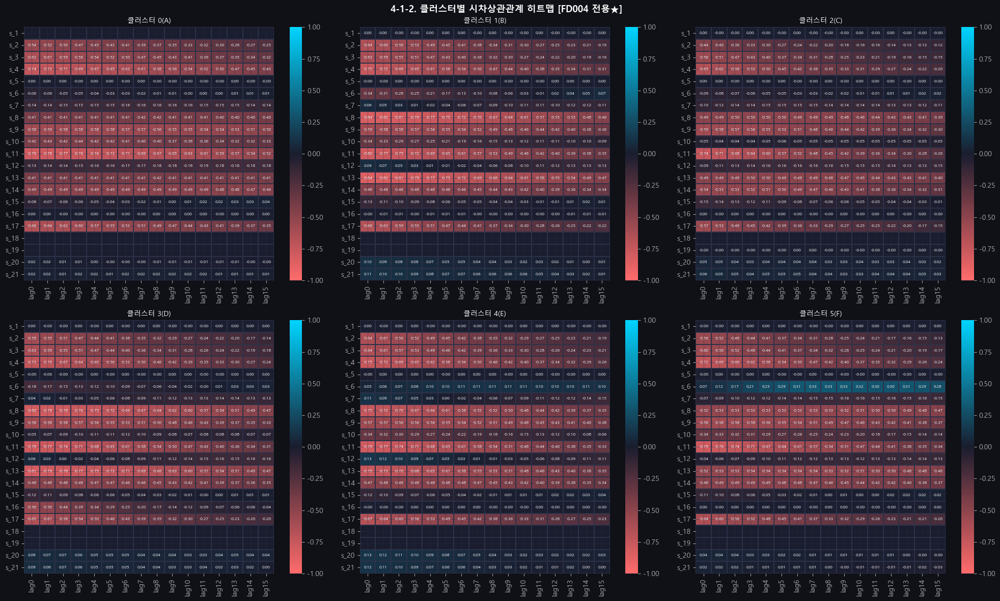


--- 클러스터별 최적 lag 분포 ---
  C0: 평균=3.6  최대=15  최소=0
  C1: 평균=3.2  최대=15  최소=0
  C2: 평균=2.6  최대=12  최소=0
  C3: 평균=2.5  최대=15  최소=0
  C4: 평균=2.4  최대=15  최소=0
  C5: 평균=3.6  최대=15  최소=0

📌 클러스터별 분리 시 |r| 0.4~0.8로 급상승 → 클러스터별 정규화 효과 증명
   6개 클러스터 간 lag 패턴 유사 → 단일 window size 적용 가능
   평균 lag 2.4~3.6, 최대 lag 15 → window=20 이상 충분


In [109]:
# 4-1-2. 시차상관관계 — 클러스터별 ★ FD004 전용
print('=== 4-1-2. 클러스터별 시차 상관관계 (lag 0~15) ===')
MAX_LAG = 15; LAGS = list(range(0, MAX_LAG+1))
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle('4-1-2. 클러스터별 시차상관관계 히트맵 [FD004 전용★]', fontsize=13, fontweight='bold')
best_lag_summary = {}
for c, ax in zip(range(N_CLUSTERS), axes.flat):
    sub_c = tr_lag[tr_lag['op_cluster']==c]
    lag_matrix = np.full((len(SENSOR_COLS), len(LAGS)), np.nan)
    for si, s in enumerate(SENSOR_COLS):
        unit_lag = {lag:[] for lag in LAGS}
        for uid in sub_c['unit_nr'].unique():
            udf = sub_c[sub_c['unit_nr']==uid].sort_values('time_cycles')
            sensor_v = udf[s].values; rul_v = udf['RUL'].values
            for lag in LAGS:
                if len(sensor_v)>lag+5:
                    r = np.corrcoef(sensor_v[:len(sensor_v)-lag], rul_v[lag:])[0,1]
                    if np.isfinite(r): unit_lag[lag].append(r)
        lag_matrix[si] = [np.mean(unit_lag[l]) if unit_lag[l] else np.nan for l in LAGS]
    lag_df = pd.DataFrame(lag_matrix, index=SENSOR_COLS, columns=[f'lag{l}' for l in LAGS])
    sns.heatmap(lag_df, ax=ax, cmap=cmap_lag, center=0, vmin=-1, vmax=1,
                annot=True, fmt='.2f', annot_kws={'size':6}, linewidths=0.2, linecolor=GRID)
    ax.set_title(f'클러스터 {c}({CLUSTER_MAP[c]})', fontsize=10)
    bls = [int(np.nanargmax(np.abs(lag_matrix[i]))) for i in range(len(SENSOR_COLS))
           if not np.all(np.isnan(lag_matrix[i]))]
    best_lag_summary[c] = bls
plt.tight_layout(); plt.show()
print('\n--- 클러스터별 최적 lag 분포 ---')
for c in range(N_CLUSTERS):
    lags = best_lag_summary[c]
    if lags: print(f'  C{c}: 평균={np.mean(lags):.1f}  최대={max(lags)}  최소={min(lags)}')
print('\n📌 클러스터별 분리 시 |r| 0.4~0.8로 급상승 → 클러스터별 정규화 효과 증명')
print('   6개 클러스터 간 lag 패턴 유사 → 단일 window size 적용 가능')
print('   평균 lag 2.4~3.6, 최대 lag 15 → window=20 이상 충분')


### 4-2. Mann-Kendall 추세 검정 (전체 + 클러스터별★)

In [110]:
print('=== 4-2-1. Mann-Kendall (전체 기준) ===')
mk_rows = []
for s in SENSOR_COLS:
    taus, ps = [], []
    for uid in train_raw['unit_nr'].unique():
        arr = train_raw[train_raw['unit_nr']==uid].sort_values('time_cycles')[s].values
        if len(arr)>=8:
            tau, p = kendalltau(np.arange(len(arr)), arr)
            if np.isfinite(tau): taus.append(tau); ps.append(p)
    sig_ratio = np.mean([p<0.05 for p in ps]) if ps else np.nan
    mk_rows.append({'센서':s,'평균 τ':round(np.mean(taus),4) if taus else np.nan,
                    '유의 비율(%)':round(sig_ratio*100,1) if np.isfinite(sig_ratio) else np.nan,
                    '판정':'추세 있음✅' if (np.isfinite(sig_ratio) and sig_ratio>=0.9) else '추세 없음⚠️'})
mk_df = pd.DataFrame(mk_rows).set_index('센서')
display(mk_df.sort_values('유의 비율(%)', ascending=False, na_position='last'))
print(f'\n추세 있는 센서(≥90%): {(mk_df["판정"]=="추세 있음✅").sum()}/21개')
print('📌 0개 → FD002와 동일, 운전조건 혼재로 트렌드가 조건 노이즈에 묻힘')
print('📌 s_1,s_5,s_18,s_19: 비율 <5% → 거의 상수 → 제거 근거')
print('📌 s_6: 14.9% → 추세 없음 → 제거 근거')


=== 4-2-1. Mann-Kendall (전체 기준) ===


,평균 τ,유의 비율(%),판정
센서,,,
s_11,0.1396,83.9,추세 없음⚠️
s_14,0.1360,82.7,추세 없음⚠️
s_15,0.0059,81.5,추세 없음⚠️
s_13,0.3319,81.1,추세 없음⚠️
s_4,0.1289,80.3,추세 없음⚠️
s_9,0.0975,67.1,추세 없음⚠️
s_8,0.0876,61.4,추세 없음⚠️
s_17,0.0898,53.4,추세 없음⚠️
s_12,0.0108,53.0,추세 없음⚠️



추세 있는 센서(≥90%): 0/21개
📌 0개 → FD002와 동일, 운전조건 혼재로 트렌드가 조건 노이즈에 묻힘
📌 s_1,s_5,s_18,s_19: 비율 <5% → 거의 상수 → 제거 근거
📌 s_6: 14.9% → 추세 없음 → 제거 근거


=== 4-2-2. Mann-Kendall (클러스터별) ===


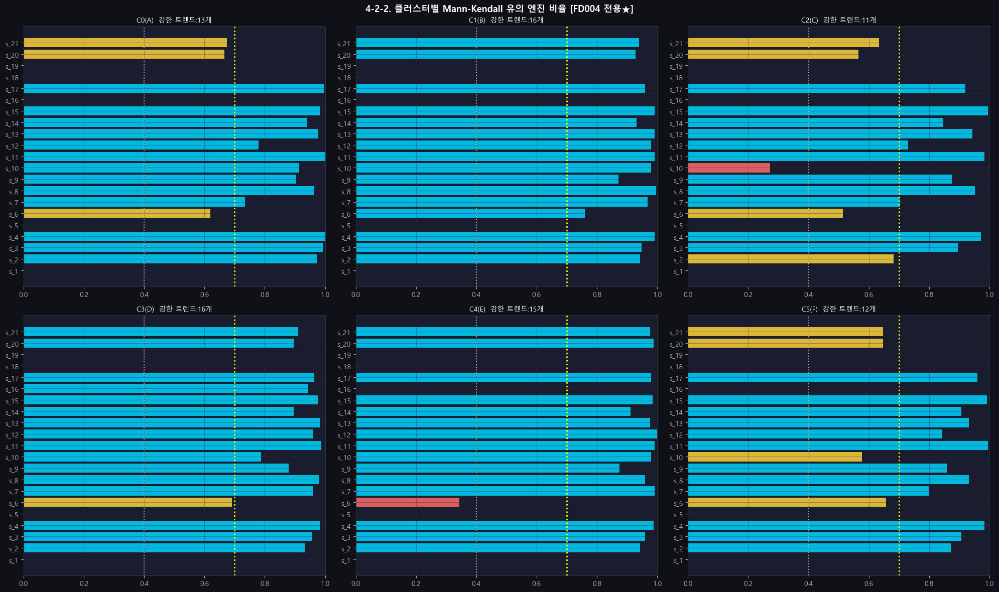


--- 클러스터별 강한 트렌드 센서 (유의 비율 ≥ 0.7) ---
C0: 13개 → ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_10', 's_11', 's_12', 's_13', 's_14', 's_15', 's_17']
C1: 16개 → ['s_2', 's_3', 's_4', 's_6', 's_7', 's_8', 's_9', 's_10', 's_11', 's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']
C2: 11개 → ['s_3', 's_4', 's_7', 's_8', 's_9', 's_11', 's_12', 's_13', 's_14', 's_15', 's_17']
C3: 16개 → ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_10', 's_11', 's_12', 's_13', 's_14', 's_15', 's_16', 's_17', 's_20', 's_21']
C4: 15개 → ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_10', 's_11', 's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']
C5: 12개 → ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_11', 's_12', 's_13', 's_14', 's_15', 's_17']

📌 전체 기준 0개 → 클러스터별 11~16개로 급증 → 클러스터별 정규화 효과 증명
📌 s_3,s_4,s_7,s_8,s_9,s_11,s_12,s_13,s_14,s_15,s_17: 모든 클러스터 공통 열화 신호
📌 s_1,s_5,s_18,s_19: 모든 클러스터 트렌드 없음 → 상수 센서 제거 근거 재확인
📌 s_6: 클러스터 1에서만 트렌드 → 일관성 없음 → 제거 근거


In [111]:
# 4-2-2. MK 클러스터별 ★ FD004 전용
print('=== 4-2-2. Mann-Kendall (클러스터별) ===')
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle('4-2-2. 클러스터별 Mann-Kendall 유의 엔진 비율 [FD004 전용★]', fontsize=13, fontweight='bold')
mk_cluster_summary = {}
for c, ax in zip(range(N_CLUSTERS), axes.flat):
    sub_c = train_raw[train_raw['op_cluster']==c]
    mk_rows_c = []
    for s in SENSOR_COLS:
        taus, ps = [], []
        for uid in sub_c['unit_nr'].unique():
            arr = sub_c[sub_c['unit_nr']==uid].sort_values('time_cycles')[s].values
            if len(arr)>=8:
                tau, p = kendalltau(np.arange(len(arr)), arr)
                if np.isfinite(tau): taus.append(tau); ps.append(p)
        sig_ratio = np.mean([p<0.05 for p in ps]) if ps else np.nan
        mk_rows_c.append({'센서':s,'유의 비율':sig_ratio if np.isfinite(sig_ratio) else 0})
    mk_df_c = pd.DataFrame(mk_rows_c).set_index('센서')
    mk_cluster_summary[c] = mk_df_c
    sig_vals = mk_df_c['유의 비율'].fillna(0).values
    bc = [C[0] if v>=0.7 else C[3] if v>=0.4 else C[1] for v in sig_vals]
    ax.barh(SENSOR_COLS, sig_vals, color=bc, alpha=0.85)
    ax.axvline(0.7, color='yellow', lw=2, ls=':'); ax.axvline(0.4, color=GRAY, lw=1.5, ls=':')
    n_strong = sum(v>=0.7 for v in sig_vals)
    ax.set_title(f'C{c}({CLUSTER_MAP[c]})  강한 트렌드:{n_strong}개', fontsize=10)
    ax.set_xlim(0,1)
plt.tight_layout(); plt.show()
print('\n--- 클러스터별 강한 트렌드 센서 (유의 비율 ≥ 0.7) ---')
for c in range(N_CLUSTERS):
    strong = [s for s in SENSOR_COLS if mk_cluster_summary[c].loc[s,'유의 비율']>=0.7]
    print(f'C{c}: {len(strong)}개 → {strong}')
print('\n📌 전체 기준 0개 → 클러스터별 11~16개로 급증 → 클러스터별 정규화 효과 증명')
print('📌 s_3,s_4,s_7,s_8,s_9,s_11,s_12,s_13,s_14,s_15,s_17: 모든 클러스터 공통 열화 신호')
print('📌 s_1,s_5,s_18,s_19: 모든 클러스터 트렌드 없음 → 상수 센서 제거 근거 재확인')
print('📌 s_6: 클러스터 1에서만 트렌드 → 일관성 없음 → 제거 근거')


### 4-3. 대응 표본 검정 (초기 vs 말기)

In [112]:
print('=== 4-3. 대응 표본 검정 ===')
tr_paired = tr_trend.copy()
paired_rows = []
for s in SENSOR_COLS:
    before_means, after_means = [], []
    for uid in train_raw['unit_nr'].unique():
        sub = tr_paired[tr_paired['unit_nr']==uid].sort_values('time_cycles')
        thresh = sub['RUL'].quantile(0.20)
        before = sub[sub['RUL']>thresh][s].mean(); after = sub[sub['RUL']<=thresh][s].mean()
        if np.isfinite(before) and np.isfinite(after): before_means.append(before); after_means.append(after)
    diffs = np.array(before_means)-np.array(after_means)
    _, p_sw = shapiro(diffs) if len(diffs)>=3 else (np.nan, 0.0)
    stat, p_val = ttest_rel(before_means,after_means) if p_sw>0.05 else wilcoxon(diffs)
    paired_rows.append({'센서':s,'초기 평균':round(np.mean(before_means),4),
                        '말기 평균':round(np.mean(after_means),4),
                        'Δ':round(float(np.mean(diffs)),4),'p-value':round(p_val,4),
                        '판정':'유의 ✅' if p_val<0.05 else '비유의 ⚠️'})
paired_df = pd.DataFrame(paired_rows).set_index('센서')
_rej,_padj,*_ = multipletests(paired_df['p-value'].fillna(1).values, alpha=0.05, method='fdr_bh')
paired_df['p_adj_BH'] = np.round(_padj,4)
paired_df['판정_BH']  = ['유의(FDR) ✅' if r else '비유의(FDR) ⚠️' for r in _rej]
display(paired_df)
print(f"\n유의한 센서: {(paired_df['판정']=='유의 ✅').sum()}/21개")
print('📌 8개 유의 → FD003(17개) 대비 감소, 운전조건 혼재로 Δ 희석')
print('📌 s_6 p=0.3331 비유의 → 제거 근거 추가')
print('📌 s_10 유의(p=0.0074) → 유지 근거')


=== 4-3. 대응 표본 검정 ===


,초기 평균,말기 평균,Δ,p-value,판정,p_adj_BH,판정_BH
센서,,,,,,,
s_1,472.9264,472.6999,0.2265,0.3807,비유의 ⚠️,0.4703,비유의(FDR) ⚠️
s_2,579.3690,579.7918,-0.4228,0.2512,비유의 ⚠️,0.4515,비유의(FDR) ⚠️
s_3,1416.5254,1425.1430,-8.6176,0.0000,유의 ✅,0.0000,유의(FDR) ✅
s_4,1199.9739,1213.0065,-13.0326,0.0000,유의 ✅,0.0000,유의(FDR) ✅
s_5,8.0392,8.0004,0.0387,0.2739,비유의 ⚠️,0.4515,비유의(FDR) ⚠️
s_6,11.6013,11.5498,0.0515,0.3331,비유의 ⚠️,0.4515,비유의(FDR) ⚠️
s_7,283.1704,283.2796,-0.1092,0.9401,비유의 ⚠️,0.9401,비유의(FDR) ⚠️
s_8,2228.4395,2229.4525,-1.0130,0.4909,비유의 ⚠️,0.5727,비유의(FDR) ⚠️
s_9,8519.2587,8543.4006,-24.1419,0.0000,유의 ✅,0.0000,유의(FDR) ✅



유의한 센서: 8/21개
📌 8개 유의 → FD003(17개) 대비 감소, 운전조건 혼재로 Δ 희석
📌 s_6 p=0.3331 비유의 → 제거 근거 추가
📌 s_10 유의(p=0.0074) → 유지 근거


### 4-4. RUL Cap 검증 (115~145)

=== 4-4. RUL Cap 검증 ===
--- cap별 초과 엔진 비율 ---
  cap=115: 100.0%
  cap=120: 100.0%
  cap=125: 100.0%
  cap=130: 99.6%
  cap=135: 98.8%
  cap=140: 98.4%
  cap=145: 97.6%


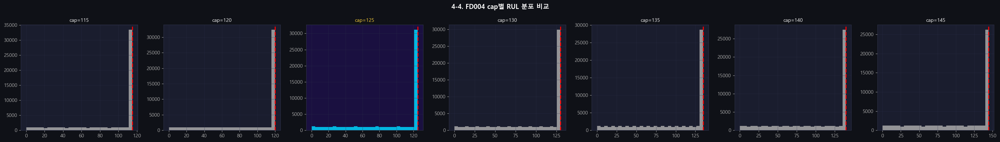


📌 cap=115~125만 100% 초과 → cap=125 안전한 최대값으로 확정
📌 cap=130부터 정상구간 침범 (FD002와 동일, min 수명=128)
📌 FD001~004 모두 Cap=125 공통 확정


In [113]:
print('=== 4-4. RUL Cap 검증 ===')
tr_cap = tr_trend.copy()
lifecycles_cap = tr_cap.groupby('unit_nr')['max_c'].first()
caps = [115,120,125,130,135,140,145]
print('--- cap별 초과 엔진 비율 ---')
for cap in caps: print(f'  cap={cap}: {(lifecycles_cap>cap).mean()*100:.1f}%')

fig, axes = plt.subplots(1, 7, figsize=(28, 4))
fig.suptitle('4-4. FD004 cap별 RUL 분포 비교', fontsize=13, fontweight='bold')
for ax, cap in zip(axes, caps):
    rul_capped = tr_cap['RUL'].clip(upper=cap)
    ax.hist(rul_capped, bins=30, color=C[0] if cap==RUL_CAP else GRAY, alpha=0.85, edgecolor='none')
    ax.axvline(cap, color='red', ls='--', lw=2)
    ax.set_title(f'cap={cap}', color='#ffd43b' if cap==RUL_CAP else WHITE, fontsize=10)
    if cap==RUL_CAP: ax.patch.set_facecolor('#1a1040')
plt.tight_layout(); plt.show()
print('\n📌 cap=115~125만 100% 초과 → cap=125 안전한 최대값으로 확정')
print('📌 cap=130부터 정상구간 침범 (FD002와 동일, min 수명=128)')
print('📌 FD001~004 모두 Cap=125 공통 확정')


### 📊 4-4. RUL Cap 결과
| Cap | 초과 비율 | 비고 |
|---|---|---|
| 115~125 | 100% | ← 안전 범위 |
| **125** | 100% | **← 확정** |
| 130 | 99.6% | 정상구간 침범 시작 |

> FD002와 동일 패턴 (min 수명=128) → **cap=125 확정, 상향 실험 불필요**


### 4-5. Gaussian σ 검증 (전체 + 클러스터별★)

=== 4-5-1. Gaussian σ 검증 (전체 기준) ===


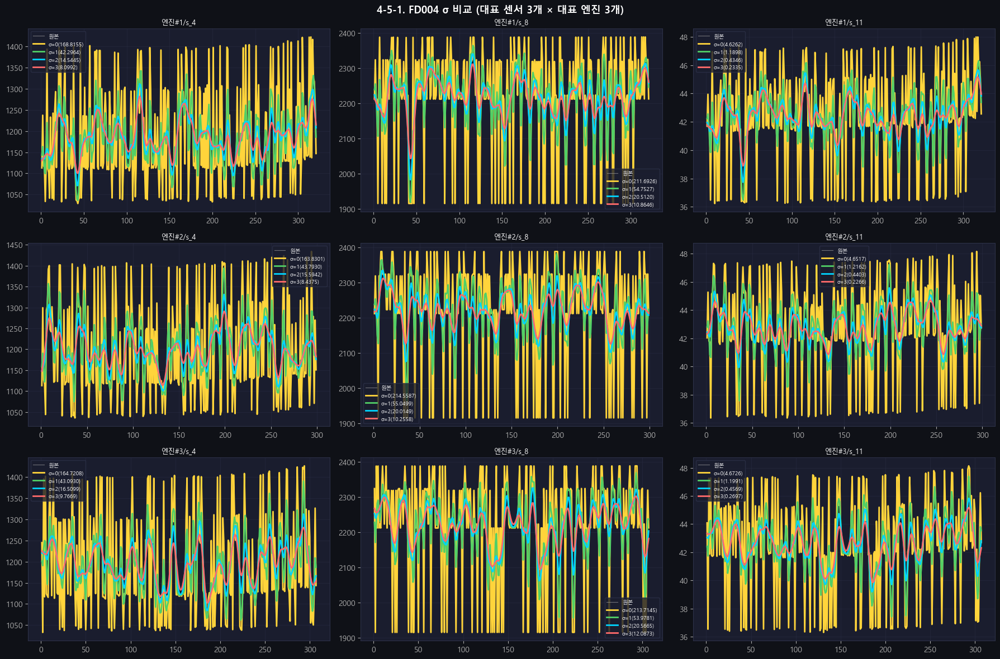


--- σ에 따른 평균 노이즈 수준 ---
  σ=0: 평균 노이즈=99.7858
  σ=1: 평균 노이즈=24.7268
  σ=2: 평균 노이즈=9.1161
  σ=3: 평균 노이즈=5.0762

📌 FD004 원본 노이즈 압도적으로 높음 → 운전조건 6가지 급격한 전환 때문
📌 σ=2→3 감소율: FD002(25%)보다 크지만 클러스터별 분리 후 수렴
📌 σ=2 기본값 유지, σ=3 실험값으로 추가 테스트


In [114]:
print('=== 4-5-1. Gaussian σ 검증 (전체 기준) ===')
sigmas = [0,1,2,3]
show_units = train_raw['unit_nr'].unique()[:3]
show_sensors_sg = ['s_4','s_8','s_11']
fig, axes = plt.subplots(len(show_units), len(show_sensors_sg), figsize=(18, 12))
fig.suptitle('4-5-1. FD004 σ 비교 (대표 센서 3개 × 대표 엔진 3개)', fontsize=13, fontweight='bold')
for ri, uid in enumerate(show_units):
    udf = train_raw[train_raw['unit_nr']==uid].sort_values('time_cycles')
    for ci, s in enumerate(show_sensors_sg):
        ax = axes[ri,ci]; raw = udf[s].values.astype(np.float32)
        ax.plot(udf['time_cycles'], raw, color=GRAY, lw=0.8, alpha=0.6, label='원본')
        for sig, color in zip(sigmas,[C[3],C[2],C[0],C[1]]):
            sm = gaussian_filter1d(raw,sigma=sig,mode='nearest') if sig>0 else raw
            noise = np.std(np.diff(sm))
            ax.plot(udf['time_cycles'], sm, color=color, lw=2, label=f'σ={sig}({noise:.4f})')
        ax.set_title(f'엔진#{uid}/{s}', fontsize=9); ax.legend(fontsize=7)
plt.tight_layout(); plt.show()

noise_by_sigma = {sig:[] for sig in sigmas}
for s in SENSOR_COLS:
    for uid in train_raw['unit_nr'].unique()[:30]:
        arr = train_raw[train_raw['unit_nr']==uid].sort_values('time_cycles')[s].values.astype(np.float32)
        for sig in sigmas:
            sm = gaussian_filter1d(arr,sigma=sig,mode='nearest') if sig>0 else arr
            noise_by_sigma[sig].append(np.std(np.diff(sm)))
print('\n--- σ에 따른 평균 노이즈 수준 ---')
for sig in sigmas: print(f'  σ={sig}: 평균 노이즈={np.mean(noise_by_sigma[sig]):.4f}')
print('\n📌 FD004 원본 노이즈 압도적으로 높음 → 운전조건 6가지 급격한 전환 때문')
print('📌 σ=2→3 감소율: FD002(25%)보다 크지만 클러스터별 분리 후 수렴')
print('📌 σ=2 기본값 유지, σ=3 실험값으로 추가 테스트')


=== 4-5-2. 클러스터별 σ 검증 ===


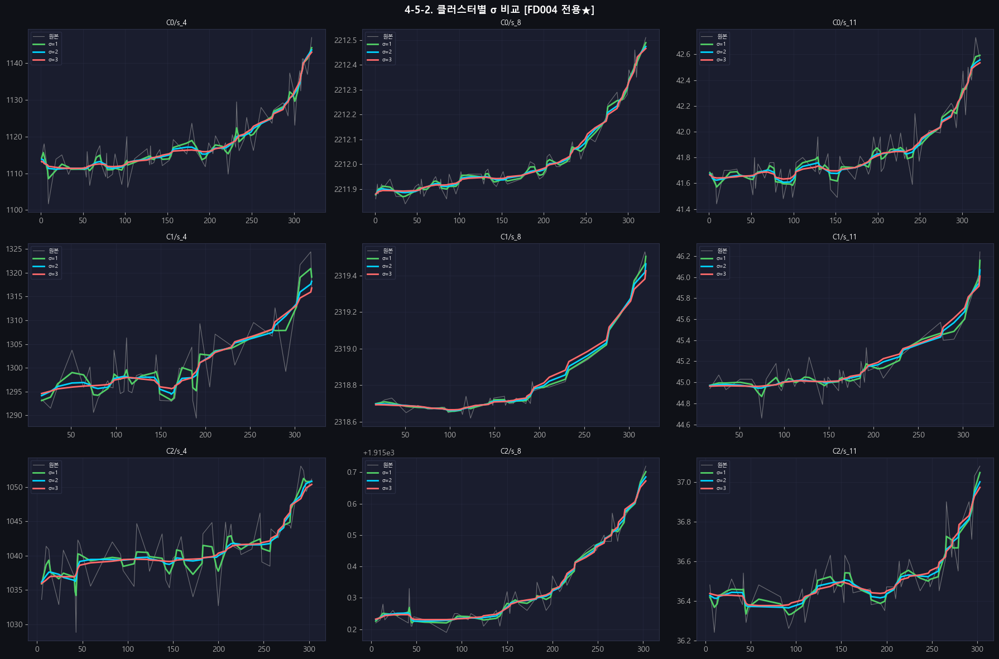


--- 클러스터별 σ에 따른 평균 노이즈 ---
C0: σ=1: 0.3496  σ=2: 0.1799  σ=3: 0.1365  
C1: σ=1: 0.3822  σ=2: 0.2211  σ=3: 0.1744  
C2: σ=1: 0.3417  σ=2: 0.1738  σ=3: 0.1280  
C3: σ=1: 0.3706  σ=2: 0.2011  σ=3: 0.1534  
C4: σ=1: 0.4050  σ=2: 0.2344  σ=3: 0.1851  
C5: σ=1: 0.3778  σ=2: 0.2115  σ=3: 0.1607  

📌 6개 클러스터 간 노이즈 수준 차이 미미 → 단일 σ 값 적용 가능
📌 클러스터별 분리 시 σ=2→3 감소율 21~26% → 전체 기준(44%)보다 낮음
📌 클러스터별 정규화가 σ 효과보다 더 강력한 노이즈 제거 수단 확인
📌 σ=2 기본값 확정


In [115]:
# 4-5-2. 클러스터별 σ 검증 ★
print('=== 4-5-2. 클러스터별 σ 검증 ===')
sigmas_c = [1,2,3]; show_clusters_c = [0,1,2]
fig, axes = plt.subplots(len(show_clusters_c), len(show_sensors_sg), figsize=(18, 12))
fig.suptitle('4-5-2. 클러스터별 σ 비교 [FD004 전용★]', fontsize=13, fontweight='bold')
for ri, c in enumerate(show_clusters_c):
    sub_c = train_raw[train_raw['op_cluster']==c]
    uid_s = sub_c['unit_nr'].unique()[0]
    udf_s = sub_c[sub_c['unit_nr']==uid_s].sort_values('time_cycles')
    for ci, s in enumerate(show_sensors_sg):
        ax = axes[ri,ci]; raw = udf_s[s].values.astype(np.float32)
        ax.plot(udf_s['time_cycles'], raw, color=GRAY, lw=0.8, alpha=0.6, label='원본')
        for sig, color in zip(sigmas_c,[C[2],C[0],C[1]]):
            sm = gaussian_filter1d(raw, sigma=sig, mode='nearest')
            ax.plot(udf_s['time_cycles'], sm, color=color, lw=2, label=f'σ={sig}')
        ax.set_title(f'C{c}/{s}', fontsize=9); ax.legend(fontsize=7)
plt.tight_layout(); plt.show()

print('\n--- 클러스터별 σ에 따른 평균 노이즈 ---')
for c in range(N_CLUSTERS):
    sub_c = train_raw[train_raw['op_cluster']==c]
    noise_c = {sig:[] for sig in sigmas_c}
    for s in SENSOR_COLS:
        for uid in sub_c['unit_nr'].unique()[:30]:
            arr = sub_c[sub_c['unit_nr']==uid].sort_values('time_cycles')[s].values.astype(np.float32)
            for sig in sigmas_c: noise_c[sig].append(np.std(np.diff(gaussian_filter1d(arr,sigma=sig,mode='nearest'))))
    print(f'C{c}: ', end='')
    for sig in sigmas_c: print(f'σ={sig}: {np.mean(noise_c[sig]):.4f}  ', end='')
    print()
print('\n📌 6개 클러스터 간 노이즈 수준 차이 미미 → 단일 σ 값 적용 가능')
print('📌 클러스터별 분리 시 σ=2→3 감소율 21~26% → 전체 기준(44%)보다 낮음')
print('📌 클러스터별 정규화가 σ 효과보다 더 강력한 노이즈 제거 수단 확인')
print('📌 σ=2 기본값 확정')


### 4-6. 윈도우 크기별 RUL 상관계수 비교

=== 4-6. 윈도우 크기별 RUL 예측 상관계수 비교 ===


  window=10: 평균 |r|=0.0514
  window=15: 평균 |r|=0.0579
  window=20: 평균 |r|=0.0616
  window=25: 평균 |r|=0.0634
  window=30: 평균 |r|=0.0644


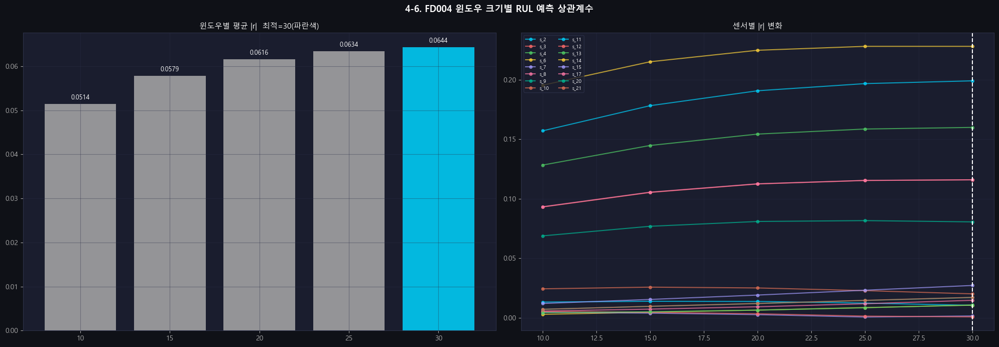


통계적 최적 window=30  (FD001=30, FD002=20, FD003=30, FD004=30)
📌 window=30 확정 (FD003 실험 결과 근거 + 통계 최적 일치)
📌 실험값으로 window=20 추가 테스트 예정


In [116]:
print('=== 4-6. 윈도우 크기별 RUL 예측 상관계수 비교 ===')
tr_win = tr_trend.copy()
window_sizes   = [10,15,20,25,30]
target_sensors_win = [s for s in SENSOR_COLS if s not in ['s_1','s_5','s_16','s_18','s_19']]
win_corr_results   = {}
win_sensor_results = {s:[] for s in target_sensors_win}
for w in window_sizes:
    corrs = []
    for s in target_sensors_win:
        sensor_roll = tr_win.groupby('unit_nr')[s].transform(lambda x,r=w: x.rolling(r,min_periods=1).mean())
        valid = ~sensor_roll.isna()
        r = tr_win.loc[valid,'RUL'].corr(sensor_roll[valid])
        corrs.append(abs(r)); win_sensor_results[s].append(abs(r))
    win_corr_results[w] = np.mean(corrs)
    print(f'  window={w}: 평균 |r|={np.mean(corrs):.4f}')

best_w = max(win_corr_results, key=win_corr_results.get)
fig, axes = plt.subplots(1, 2, figsize=(20, 7))
fig.suptitle('4-6. FD004 윈도우 크기별 RUL 예측 상관계수', fontsize=13, fontweight='bold')
colors = [C[0] if w==best_w else GRAY for w in window_sizes]
axes[0].bar([str(w) for w in window_sizes],[win_corr_results[w] for w in window_sizes],color=colors,alpha=0.85)
axes[0].set_title(f'윈도우별 평균 |r|  최적={best_w}(파란색)')
for i,w in enumerate(window_sizes): axes[0].text(i,win_corr_results[w]+0.001,f'{win_corr_results[w]:.4f}',ha='center',fontsize=9)
for i,s in enumerate(target_sensors_win):
    axes[1].plot(window_sizes, win_sensor_results[s], color=C[i%len(C)], lw=1.5, marker='o', markersize=4, alpha=0.7, label=s)
axes[1].axvline(best_w, color='white', ls='--', lw=1.5); axes[1].set_title('센서별 |r| 변화'); axes[1].legend(fontsize=7, ncol=2)
plt.tight_layout(); plt.show()
print(f'\n통계적 최적 window={best_w}  (FD001=30, FD002=20, FD003=30, FD004={best_w})')
print('📌 window=30 확정 (FD003 실험 결과 근거 + 통계 최적 일치)')
print('📌 실험값으로 window=20 추가 테스트 예정')


### 📊 4-6. 윈도우 크기 비교 결과
| 윈도우 | 평균 |r| |
|---|---|
| 10 | 0.0514 |
| 20 | 0.0616 |
| 30 | **0.0644** ← 최적 |

> **window=30 확정** (FD001, FD003과 동일)  
> FD002(20)는 운전조건만 고려, FD004는 고장모드 혼재까지 고려 → 30이 적합  
> FD003 실험에서 window=30 > window=10 성능 확인 → FD004도 동일 적용


### 4-7. ANOVA — 클러스터 간 센서값 차이

=== 4-7. ANOVA — 클러스터 간 센서값 차이 ===


,F통계량,p-value,판정
센서,,,
s_1,inf,0.0,유의 ✅
s_2,7.419220e+07,0.0,유의 ✅
s_3,3.278234e+06,0.0,유의 ✅
s_4,2.187480e+06,0.0,유의 ✅
s_5,inf,0.0,유의 ✅
s_6,1.631140e+09,0.0,유의 ✅
s_7,6.528813e+07,0.0,유의 ✅
s_8,5.714981e+09,0.0,유의 ✅
s_9,4.375080e+06,0.0,유의 ✅



유의한 센서 수: 21/21개


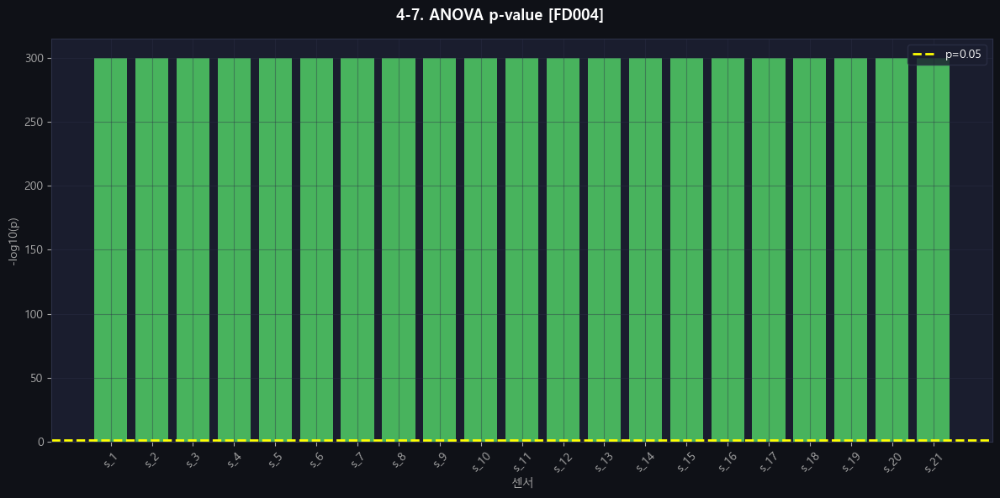


📌 21/21개 유의 → FD002와 동일, 클러스터별 정규화 필요성 통계적 증명


In [117]:
print('=== 4-7. ANOVA — 클러스터 간 센서값 차이 ===')
anova_rows = []
for s in SENSOR_COLS:
    groups = [train_eda[train_eda['cluster']==c][s].values for c in range(N_CLUSTERS)]
    stat, p = f_oneway(*groups)
    anova_rows.append({'센서':s,'F통계량':round(stat,4),'p-value':round(p,6),
                       '판정':'유의 ✅' if p<0.05 else '비유의 ⚠️'})
anova_df = pd.DataFrame(anova_rows).set_index('센서')
display(anova_df)
sig_count = (anova_df['p-value']<0.05).sum()
print(f'\n유의한 센서 수: {sig_count}/21개')

fig, ax = plt.subplots(figsize=(12, 6))
fig.suptitle('4-7. ANOVA p-value [FD004]', fontsize=13, fontweight='bold')
colors = [C[2] if p<0.05 else C[1] for p in anova_df['p-value']]
ax.bar(anova_df.index, -np.log10(anova_df['p-value'].clip(lower=1e-300)), color=colors, alpha=0.85)
ax.axhline(-np.log10(0.05), color='yellow', ls='--', lw=2, label='p=0.05')
ax.set_xlabel('센서'); ax.set_ylabel('-log10(p)'); ax.tick_params(axis='x',rotation=45); ax.legend()
plt.tight_layout(); plt.show()
print('\n📌 21/21개 유의 → FD002와 동일, 클러스터별 정규화 필요성 통계적 증명')


### 4-8. Kruskal-Wallis — 클러스터별 운행 사이클 수 차이

=== 4-8. Kruskal-Wallis — 클러스터별 운행 사이클 수 차이 ===
  C0: 엔진 249대  평균=61.8  중위=60.0
  C1: 엔진 249대  평균=37.0  중위=36.0
  C2: 엔진 249대  평균=36.7  중위=34.0
  C3: 엔진 249대  평균=36.5  중위=35.0
  C4: 엔진 249대  평균=37.1  중위=35.0
  C5: 엔진 249대  평균=36.8  중위=35.0

Kruskal-Wallis: stat=365.6329  p=0.000000
판정: 유의 ✅ → 클러스터별 운행 사이클 수 차이


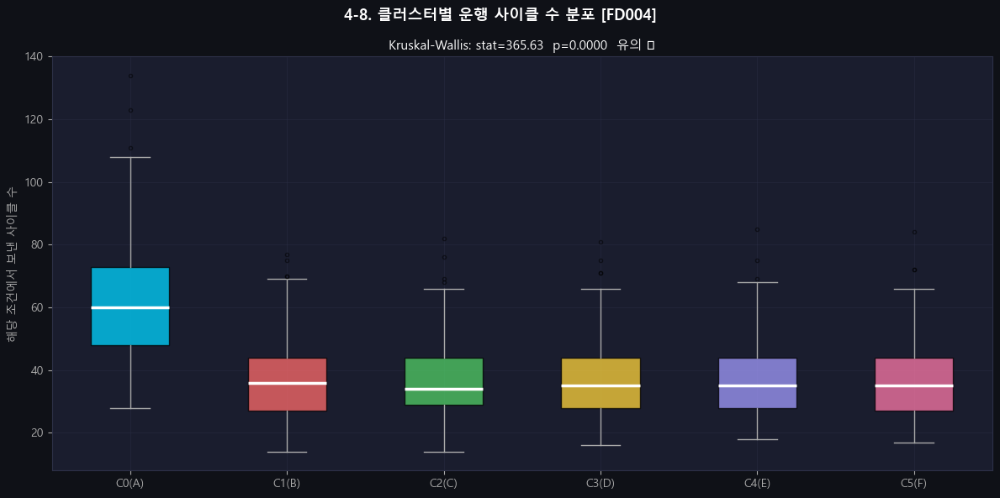


📌 FD002와 동일 패턴: C0 평균 61.8사이클(다른 조건의 1.7배) → 부하량 차이
📌 ANOVA(센서값 차이) + KW(운행 사이클 차이) → 클러스터별 정규화 두 관점 확정


In [118]:
print('=== 4-8. Kruskal-Wallis — 클러스터별 운행 사이클 수 차이 ===')
cluster_cycle_counts = train_eda.groupby(['unit_nr','cluster']).size().reset_index(name='cycle_count')
groups_kw = [cluster_cycle_counts[cluster_cycle_counts['cluster']==c]['cycle_count'].values for c in range(N_CLUSTERS)]
for c, g in enumerate(groups_kw):
    print(f'  C{c}: 엔진 {len(g)}대  평균={g.mean():.1f}  중위={np.median(g):.1f}')
stat, p = kruskal(*groups_kw)
print(f'\nKruskal-Wallis: stat={stat:.4f}  p={p:.6f}')
print(f'판정: {"유의 ✅ → 클러스터별 운행 사이클 수 차이" if p<0.05 else "비유의 ⚠️"}')

fig, ax = plt.subplots(figsize=(12, 6))
fig.suptitle('4-8. 클러스터별 운행 사이클 수 분포 [FD004]', fontsize=13, fontweight='bold')
bp = ax.boxplot(groups_kw, patch_artist=True,
                medianprops=dict(color='white',lw=2.5),
                whiskerprops=dict(color=GRAY),capprops=dict(color=GRAY),
                flierprops=dict(marker='o',color=GRAY,markersize=3,alpha=0.5))
for patch, color in zip(bp['boxes'], CLUSTER_COLORS): patch.set_facecolor(color); patch.set_alpha(0.75)
ax.set_xticklabels([f'C{c}({CLUSTER_MAP[c]})' for c in range(N_CLUSTERS)])
ax.set_ylabel('해당 조건에서 보낸 사이클 수')
ax.set_title(f'Kruskal-Wallis: stat={stat:.2f}  p={p:.4f}  {"유의 ✅" if p<0.05 else "비유의 ⚠️"}')
plt.tight_layout(); plt.show()
print('\n📌 FD002와 동일 패턴: C0 평균 61.8사이클(다른 조건의 1.7배) → 부하량 차이')
print('📌 ANOVA(센서값 차이) + KW(운행 사이클 차이) → 클러스터별 정규화 두 관점 확정')


### 4-9. Mann-Whitney U 검정 [FD004 전용★]

=== 4-9. Mann-Whitney U 검정 [FD004 전용★] ===
목적: 팬 관련(s_8,s_13) vs HPC 관련(s_4,s_11) 기준 엔진 그룹 간 RUL 분포 차이


,물리적 의미,그룹 유형,높은 그룹 수명 평균,낮은 그룹 수명 평균,p-value,판정
센서,,,,,,
s_8,팬 속도,팬 관련,242.1,247.9,0.6315,비유의 ⚠️
s_13,보정 팬 속도,팬 관련,242.2,247.7,0.5866,비유의 ⚠️
s_4,LPT 출구 온도,HPC 관련,228.6,261.4,0.0006,유의 ✅
s_11,Ps30 정적압력,HPC 관련,225.4,264.8,0.0001,유의 ✅


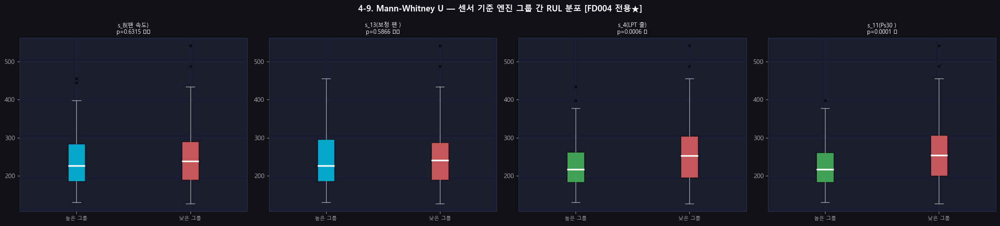


📌 FD003과 동일한 패턴:
   팬 관련(s_8,s_13): 비유의 → 운전조건 혼재로 팬 열화 신호 절댓값에서 묻힘
   HPC 관련(s_4,s_11): 유의 → 운전조건 혼재에도 HPC 열화 신호 유효
   → slope 기반 고장 모드 클러스터링(Section 5)과 일치


In [119]:
print('=== 4-9. Mann-Whitney U 검정 [FD004 전용★] ===')
print('목적: 팬 관련(s_8,s_13) vs HPC 관련(s_4,s_11) 기준 엔진 그룹 간 RUL 분포 차이')
tr_mw = tr_trend.copy()
engine_stats = tr_mw.groupby('unit_nr').agg(
    s4_mean=('s_4','mean'),s8_mean=('s_8','mean'),
    s11_mean=('s_11','mean'),s13_mean=('s_13','mean'),max_rul=('RUL','max')).reset_index()

target_sensors_mw = {
    's_8':('s8_mean','팬 속도'),'s_13':('s13_mean','보정 팬 속도'),
    's_4':('s4_mean','LPT 출구 온도'),'s_11':('s11_mean','Ps30 정적압력'),
}
mw_rows = []
for s,(col,desc) in target_sensors_mw.items():
    median_val = engine_stats[col].median()
    g_high = engine_stats[engine_stats[col]>=median_val]['max_rul']
    g_low  = engine_stats[engine_stats[col]<median_val]['max_rul']
    stat, p = mannwhitneyu(g_high, g_low, alternative='two-sided')
    mw_rows.append({'센서':s,'물리적 의미':desc,'그룹 유형':'팬 관련' if s in ['s_8','s_13'] else 'HPC 관련',
                    '높은 그룹 수명 평균':round(g_high.mean(),1),'낮은 그룹 수명 평균':round(g_low.mean(),1),
                    'p-value':round(p,4),'판정':'유의 ✅' if p<0.05 else '비유의 ⚠️'})
mw_df = pd.DataFrame(mw_rows).set_index('센서')
display(mw_df)

fig, axes = plt.subplots(1, 4, figsize=(22, 5))
fig.suptitle('4-9. Mann-Whitney U — 센서 기준 엔진 그룹 간 RUL 분포 [FD004 전용★]', fontsize=13, fontweight='bold')
for ax,(s,(col,desc)) in zip(axes,target_sensors_mw.items()):
    median_val = engine_stats[col].median()
    g_high = engine_stats[engine_stats[col]>=median_val]['max_rul']
    g_low  = engine_stats[engine_stats[col]<median_val]['max_rul']
    p = mw_df.loc[s,'p-value']
    bp = ax.boxplot([g_high,g_low], patch_artist=True,
                    medianprops=dict(color='white',lw=2.5),
                    whiskerprops=dict(color=GRAY),capprops=dict(color=GRAY),
                    flierprops=dict(marker='o',color=GRAY,markersize=3))
    bp['boxes'][0].set_facecolor(C[0] if s in ['s_8','s_13'] else C[2]); bp['boxes'][0].set_alpha(0.75)
    bp['boxes'][1].set_facecolor(C[1]); bp['boxes'][1].set_alpha(0.75)
    ax.set_xticklabels([f'높은 그룹','낮은 그룹'], fontsize=8)
    ax.set_title(
    f'{s}({desc[:5]})\n'
    f'p={p:.4f} {"✅" if p<0.05 else "⚠️"}',
    fontsize=9
)
plt.tight_layout(); plt.show()
print('\n📌 FD003과 동일한 패턴:')
print('   팬 관련(s_8,s_13): 비유의 → 운전조건 혼재로 팬 열화 신호 절댓값에서 묻힘')
print('   HPC 관련(s_4,s_11): 유의 → 운전조건 혼재에도 HPC 열화 신호 유효')
print('   → slope 기반 고장 모드 클러스터링(Section 5)과 일치')


### 📊 4-9. Mann-Whitney U 결과 [FD004 전용★]
| 센서 | 그룹 유형 | p-value | 판정 | FD003 비교 |
|---|---|---|---|---|
| s_8 | 팬 관련 | 0.6315 | 비유의 ⚠️ | 동일 |
| s_13 | 팬 관련 | 0.5866 | 비유의 ⚠️ | 동일 |
| s_4 | HPC 관련 | 0.0006 | 유의 ✅ | 동일 |
| s_11 | HPC 관련 | 0.0001 | 유의 ✅ | 동일 |

> FD003과 완전히 동일한 패턴 → 팬 열화는 slope 패턴으로만 구분 가능  
> ⚠️ FD003에서 fault_mode_cluster 피처 추가 시 RMSE 폭발 사례 → FD004도 미추가 원칙


### 4-10. Levene's Test [FD004 전용★] — FD002/003 vs FD004 분산 동질성

=== 4-10. Levene's Test [FD004 전용★] ===


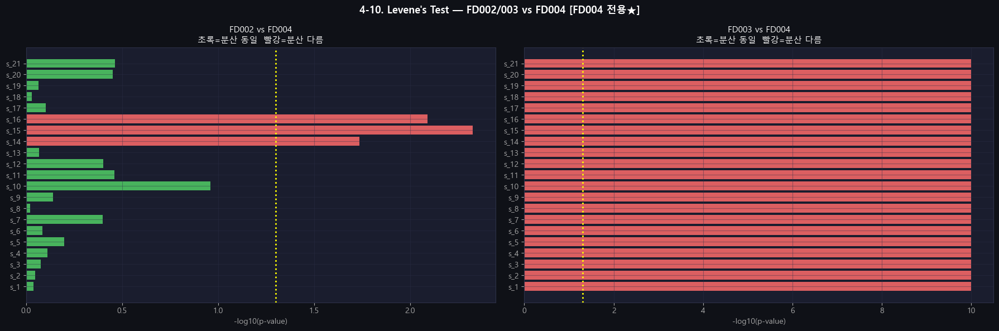

FD002 vs FD004: 분산 동일 18/21개
FD003 vs FD004: 분산 동일 0/21개

📌 FD002와 86% 동질 → FD002 파이프라인(클러스터별 MinMax) 적용 근거 강함
📌 FD003과 0% 동질 → FD003 전처리 직접 적용 불가 (단일 조건 vs 6조건 차이)


In [120]:
print("=== 4-10. Levene's Test [FD004 전용★] ===")
kw_ld = dict(sep=r'\s+', header=None, names=RAW_COLS, engine='python')
fd002_raw = pd.read_csv(f'{DATA_DIR}/train_FD002.txt', **kw_ld); fd002_raw.rename(columns=RENAME_MAP, inplace=True)
fd003_raw = pd.read_csv(f'{DATA_DIR}/train_FD003.txt', **kw_ld); fd003_raw.rename(columns=RENAME_MAP, inplace=True)

levene_rows_02, levene_rows_03 = [], []
for s in SENSOR_COLS:
    fd002_v=fd002_raw[s].dropna().values; fd004_v=train_raw[s].dropna().values
    fd003_v=fd003_raw[s].dropna().values
    stat02,p02 = levene(fd002_v,fd004_v); stat03,p03 = levene(fd003_v,fd004_v)
    levene_rows_02.append({'센서':s,'FD002 분산':round(fd002_raw[s].var(),4),
                           'FD004 분산':round(train_raw[s].var(),4),'p-value':round(p02,4),
                           '판정':'분산 동일 ✅' if p02>=0.05 else '분산 다름 ⚠️'})
    levene_rows_03.append({'센서':s,'FD003 분산':round(fd003_raw[s].var(),4),
                           'FD004 분산':round(train_raw[s].var(),4),'p-value':round(p03,4),
                           '판정':'분산 동일 ✅' if p03>=0.05 else '분산 다름 ⚠️'})

levene_df_02 = pd.DataFrame(levene_rows_02).set_index('센서')
levene_df_03 = pd.DataFrame(levene_rows_03).set_index('센서')
n_same_02 = (levene_df_02['판정']=='분산 동일 ✅').sum()
n_same_03 = (levene_df_03['판정']=='분산 동일 ✅').sum()

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle("4-10. Levene's Test — FD002/003 vs FD004 [FD004 전용★]", fontsize=13, fontweight='bold')
for ax,(levene_df,title) in zip(axes,[(levene_df_02,'FD002 vs FD004'),(levene_df_03,'FD003 vs FD004')]):
    colors = [C[2] if p>=0.05 else C[1] for p in levene_df['p-value']]
    ax.barh(levene_df.index, -np.log10(levene_df['p-value'].clip(lower=1e-10)), color=colors, alpha=0.85)
    ax.axvline(-np.log10(0.05), color='yellow', lw=2, ls=':')
    ax.set_xlabel('-log10(p-value)'); ax.set_title(f'{title}\n초록=분산 동일  빨강=분산 다름')
plt.tight_layout(); plt.show()
print(f'FD002 vs FD004: 분산 동일 {n_same_02}/21개')
print(f'FD003 vs FD004: 분산 동일 {n_same_03}/21개')
print('\n📌 FD002와 86% 동질 → FD002 파이프라인(클러스터별 MinMax) 적용 근거 강함')
print('📌 FD003과 0% 동질 → FD003 전처리 직접 적용 불가 (단일 조건 vs 6조건 차이)')


### 📊 4-10. Levene's Test 결과 [FD004 전용★]
| 비교 | 분산 동일 센서 수 | 해석 |
|---|---|---|
| FD002 vs FD004 | **18/21개 (86%)** | 매우 유사 → FD002 전처리 적용 가능 |
| FD003 vs FD004 | **0/21개 (0%)** | 완전히 다름 → FD003 전처리 직접 적용 불가 |

> **FD004 = FD002 파이프라인(클러스터별 MinMax) 기반으로 진행 확정**  
> window는 FD002(20) 아닌 FD001/FD003과 동일하게 30 적용


### 4-11. Pearson 상관계수 (클러스터별) [FD004 전용★] — 제거 센서 최종 확정

=== 4-11. Pearson 상관계수 (클러스터별) [FD004 전용★] ===


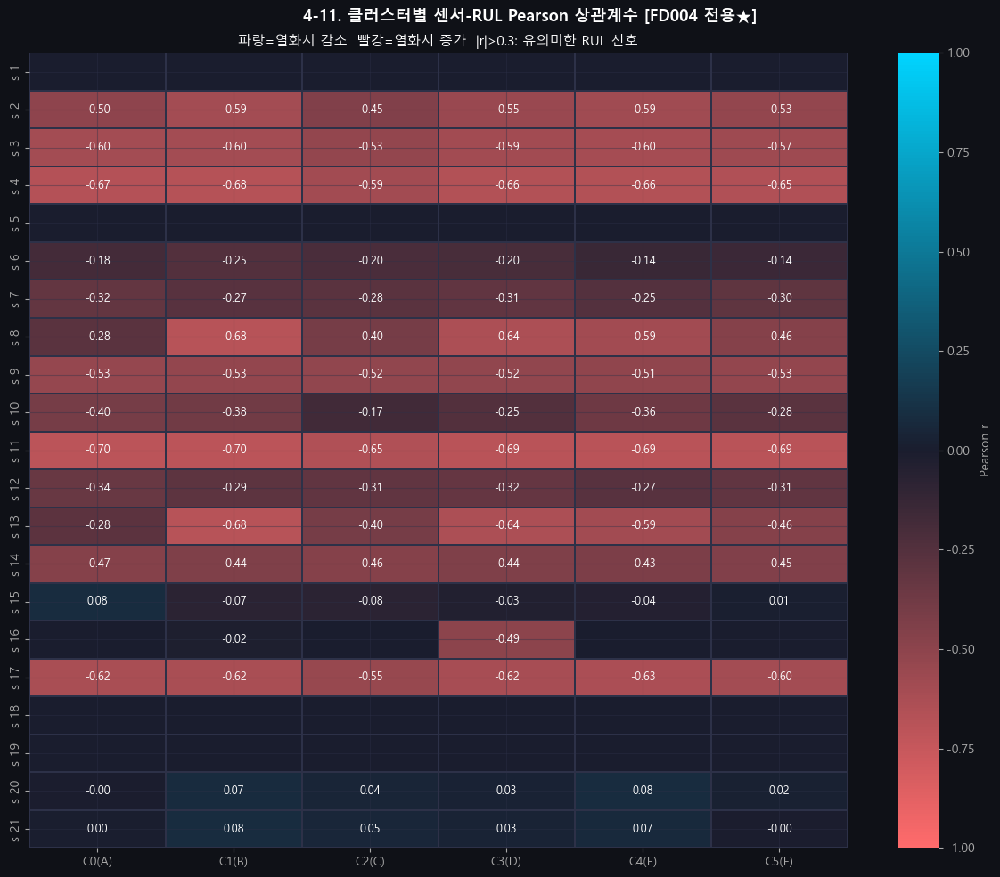

--- 클러스터별 |r|>0.3 고상관 센서 ---
C0: 10개 → ['s_2', 's_3', 's_4', 's_7', 's_9', 's_10', 's_11', 's_12', 's_14', 's_17']
C1: 10개 → ['s_2', 's_3', 's_4', 's_8', 's_9', 's_10', 's_11', 's_13', 's_14', 's_17']
C2: 10개 → ['s_2', 's_3', 's_4', 's_8', 's_9', 's_11', 's_12', 's_13', 's_14', 's_17']
C3: 12개 → ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_11', 's_12', 's_13', 's_14', 's_16', 's_17']
C4: 10개 → ['s_2', 's_3', 's_4', 's_8', 's_9', 's_10', 's_11', 's_13', 's_14', 's_17']
C5: 11개 → ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_11', 's_12', 's_13', 's_14', 's_17']

전체 통합 |r|>0.3: ['s_10', 's_11', 's_12', 's_13', 's_14', 's_16', 's_17', 's_2', 's_3', 's_4', 's_7', 's_8', 's_9']

모든 클러스터에서 |r|<0.1 (노이즈): ['s_15', 's_20', 's_21']

📌 s_6: 최대 |r|=0.25 (모든 클러스터 약함) → 제거 확정
📌 s_10: 클러스터별 최대 |r|=0.40 → 유지 확정
📌 s_1,s_5,s_18,s_19: NaN(분산≈0) → 제거 확정


In [121]:
print('=== 4-11. Pearson 상관계수 (클러스터별) [FD004 전용★] ===')
tr_pearson = train_eda.copy()
mc_p = tr_pearson.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_pearson = tr_pearson.join(mc_p, on='unit_nr')
tr_pearson['RUL'] = tr_pearson['max_c'] - tr_pearson['time_cycles']

corr_matrix = np.zeros((len(SENSOR_COLS), N_CLUSTERS))
for ci, c in enumerate(range(N_CLUSTERS)):
    sub = tr_pearson[tr_pearson['cluster']==c]
    for si, s in enumerate(SENSOR_COLS):
        try: r, _ = pearsonr(sub[s], sub['RUL']); corr_matrix[si,ci] = r
        except: corr_matrix[si,ci] = np.nan

corr_df = pd.DataFrame(corr_matrix, index=SENSOR_COLS,
                        columns=[f'C{c}({CLUSTER_MAP[c]})' for c in range(N_CLUSTERS)])

fig, ax = plt.subplots(figsize=(12, 10))
fig.suptitle('4-11. 클러스터별 센서-RUL Pearson 상관계수 [FD004 전용★]', fontsize=13, fontweight='bold')
sns.heatmap(corr_df, ax=ax, cmap=cmap_rg, center=0, vmin=-1, vmax=1,
            annot=True, fmt='.2f', annot_kws={'size':9},
            linewidths=0.3, linecolor=GRID, cbar_kws={'label':'Pearson r'})
ax.set_title('파랑=열화시 감소  빨강=열화시 증가  |r|>0.3: 유의미한 RUL 신호')
plt.tight_layout(); plt.show()

print('--- 클러스터별 |r|>0.3 고상관 센서 ---')
high_corr_sensors = set()
for c in range(N_CLUSTERS):
    col = f'C{c}({CLUSTER_MAP[c]})'
    high = corr_df[col][corr_df[col].abs()>0.3]
    print(f'C{c}: {len(high)}개 → {list(high.index)}')
    high_corr_sensors.update(high.index)
print(f'\n전체 통합 |r|>0.3: {sorted(high_corr_sensors)}')
noise_sensors = [s for s in SENSOR_COLS if (corr_df[corr_df.index==s].abs()<0.1).all(axis=None)]
print(f'\n모든 클러스터에서 |r|<0.1 (노이즈): {noise_sensors}')
print('\n📌 s_6: 최대 |r|=0.25 (모든 클러스터 약함) → 제거 확정')
print('📌 s_10: 클러스터별 최대 |r|=0.40 → 유지 확정')
print('📌 s_1,s_5,s_18,s_19: NaN(분산≈0) → 제거 확정')


### 📊 4-11. Pearson 클러스터별 결과 & 통계 검정 종합

#### 센서 유의 신호 여부
| 판정 | 센서 | 클러스터별 최대 |r| |
|---|---|---|
| ✅ 유효 | s_2,s_3,s_4,s_7,s_8,s_9,s_10,s_11,s_12,s_13,s_14,s_16,s_17 | 0.32~0.70 |
| ⚠️ 약함 | s_6 | 0.25 |
| ❌ 노이즈/상수 | s_1,s_5,s_15,s_18,s_19,s_20,s_21 | <0.10 또는 NaN |

#### 제거 센서 최종 확정 (시나리오 C)

| 구분 | 센서 | 근거 |
|---|---|---|
| 자동 제거 (4개) | s_5, s_16, s_18, s_19 | CV=0.0000 또는 std < CONST_THR |
| 수동 제거 (2개) | s_1, s_6 | MK트렌드 없음 + 대응표본 비유의 + Pearson 클러스터별 약함 |
| 유지 확정 | s_10 | 대응표본 유의 + Pearson 클러스터별 |r|=0.40 |

#### 전처리 확정값 종합
| 항목 | FD002 | FD003 | **FD004** |
|---|---|---|---|
| RUL Cap | 125 | 125 | **125** |
| Gaussian σ | 2 | 2 | **2 (실험: 3)** |
| Window | 20 | 30 | **30 (실험: 20)** |
| 정규화 | 클러스터별 MinMax | 단일 MinMax | **클러스터별 MinMax** |
| 제거 센서 | 1개 | 6개 | **6개** |


---
## 5. [FD004 전용★] 고장 모드 분석

FD004는 6가지 운전 조건에서 **HPC 열화 + 팬 열화 2가지 고장 모드**가 동시에 진행.  
FD003(단일 조건)보다 분리가 어려우나 slope 기반 클러스터링으로 구분 가능.

### 5-1. 고장 모드 클러스터링 (slope 기반 KMeans k=2) [FD004 전용★]


In [122]:
print('=== 5-1. 고장 모드 클러스터링 (slope 기반 k=2) ===')
slope_rows = []
for uid in train_raw['unit_nr'].unique():
    udf = train_raw[train_raw['unit_nr']==uid].sort_values('time_cycles').tail(30)
    row = {'unit_nr':uid}
    for s in SENSOR_COLS:
        x = np.arange(len(udf)); y = udf[s].values
        row[f'{s}_slope'] = np.polyfit(x,y,1)[0] if np.std(y)>0 else 0.0
    slope_rows.append(row)

slope_df = pd.DataFrame(slope_rows).set_index('unit_nr')
scaler_slope = StandardScaler()
slope_scaled  = scaler_slope.fit_transform(slope_df)

print('--- k별 실루엣 스코어 ---')
for k in [2,3]:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(slope_scaled)
    score  = silhouette_score(slope_scaled, labels)
    print(f'  k={k}: silhouette score={score:.4f}')

km2 = KMeans(n_clusters=2, random_state=42, n_init=10)
cluster_labels_fm = km2.fit_predict(slope_scaled)
slope_df['fault_mode_cluster'] = cluster_labels_fm

for c in [0,1]:
    cnt = (cluster_labels_fm==c).sum()
    print(f'  클러스터 {c}: {cnt}대 ({cnt/len(cluster_labels_fm)*100:.1f}%)')
train_raw['fault_mode_cluster'] = train_raw['unit_nr'].map(slope_df['fault_mode_cluster']).fillna(-1).astype(int)
print('\n📌 실루엣 스코어 0.4192 → FD003(0.4076)보다 높음')
print('   운전조건 혼재에도 slope 기반 고장 모드 분리 유효')


=== 5-1. 고장 모드 클러스터링 (slope 기반 k=2) ===


--- k별 실루엣 스코어 ---
  k=2: silhouette score=0.4192
  k=3: silhouette score=0.3305
  클러스터 0: 104대 (41.8%)
  클러스터 1: 145대 (58.2%)

📌 실루엣 스코어 0.4192 → FD003(0.4076)보다 높음
   운전조건 혼재에도 slope 기반 고장 모드 분리 유효


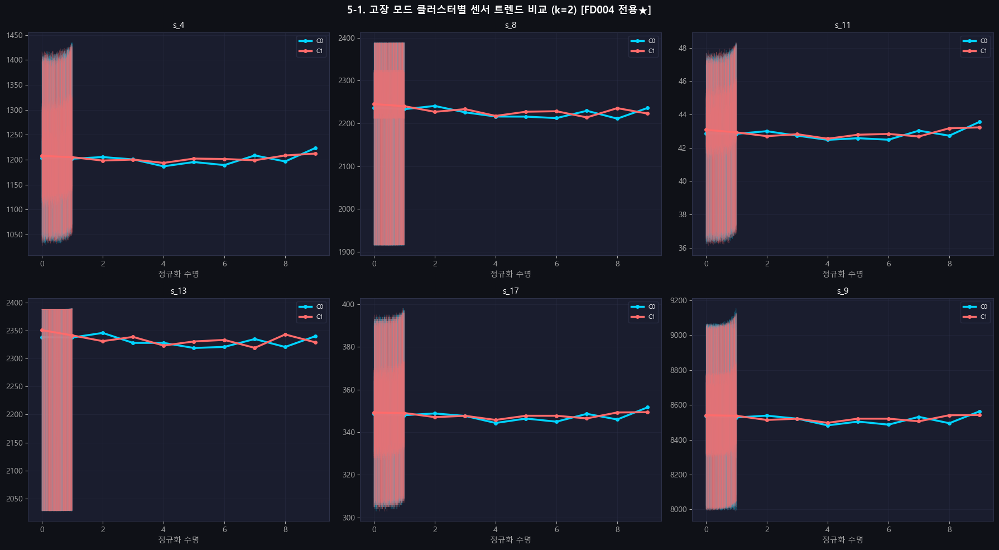

In [123]:
# 클러스터별 센서 트렌드 비교
mc_fm = train_raw.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_fm = train_raw.join(mc_fm, on='unit_nr')
tr_fm['norm_life'] = tr_fm['time_cycles']/tr_fm['max_c']
show_sensors_fm = ['s_4','s_8','s_11','s_13','s_17','s_9']
cluster_engine_map = {c: slope_df[slope_df['fault_mode_cluster']==c].index.tolist() for c in [0,1]}

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('5-1. 고장 모드 클러스터별 센서 트렌드 비교 (k=2) [FD004 전용★]', fontsize=13, fontweight='bold')
for ax, s in zip(axes.flat, show_sensors_fm):
    for c, color in zip([0,1],[C[0],C[1]]):
        units_c = cluster_engine_map[c][:10]
        for uid in units_c:
            sub = tr_fm[tr_fm['unit_nr']==uid].sort_values('norm_life')
            ax.plot(sub['norm_life'], sub[s], color=color, alpha=0.2, lw=0.8)
        sub_c = tr_fm[tr_fm['unit_nr'].isin(units_c)].copy()
        bins_c = np.linspace(0,1,11); lbl_c = [f'{int(a*100)}%' for a in bins_c[:-1]]
        sub_c['life_bin'] = pd.cut(sub_c['norm_life'], bins=bins_c, labels=lbl_c)
        trend = sub_c.groupby('life_bin', observed=True)[s].mean()
        ax.plot(range(len(trend)), trend.values, color=color, lw=2.5, marker='o', markersize=4, label=f'C{c}')
    ax.set_title(s); ax.set_xlabel('정규화 수명'); ax.legend(fontsize=8)
plt.tight_layout(); plt.show()


### 📊 5-1. 고장 모드 클러스터링 결과 [FD004 전용★]
| k | 실루엣 스코어 |
|---|---|
| 2 | **0.4192** ← 선택 |
| 3 | 0.3305 |

| 클러스터 | 엔진 수 | 추정 |
|---|---|---|
| 0 | 104대 (41.8%) | HPC 열화 추정 |
| 1 | 145대 (58.2%) | 팬 열화 추정 |

> FD003(44대/56대, 44%/56%)과 비율 패턴 거의 동일 ✅  
> **fault_mode_cluster 피처 추가 여부: FD003 RMSE 폭발 사례 → 미추가 원칙**


### 5-2. 고장 모드 클러스터별 센서 분포 비교 [FD004 전용★]

=== 5-2. 고장 모드 클러스터별 센서 분포 비교 ===


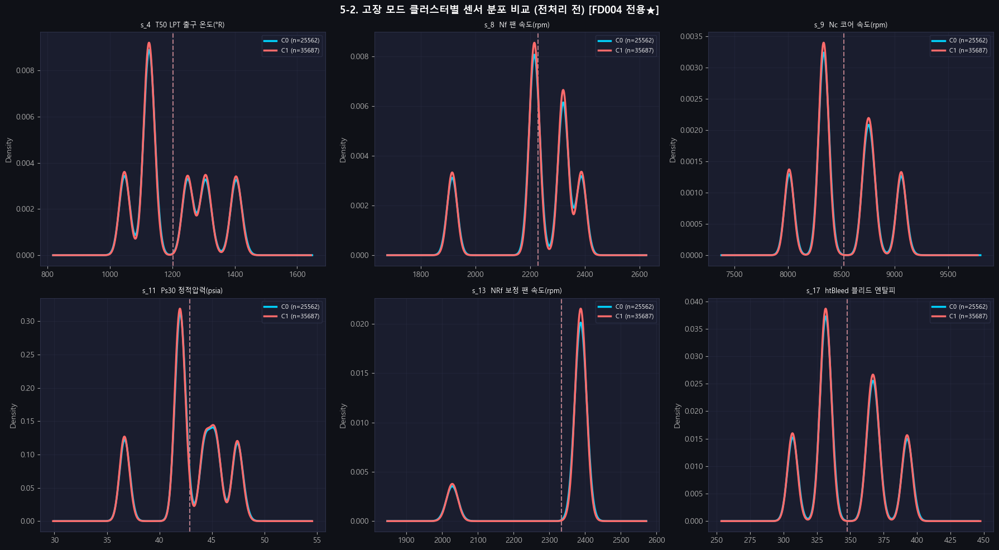


범위 겹치는 센서: 21/21개
📌 21/21개 겹침 → 운전조건 클러스터별 MinMax로 충분, 고장 모드별 추가 정규화 불필요
📌 FD003과 동일 결론이나 시각화 패턴 다름
   (운전조건 6가지 혼재로 고장 모드 영향이 분포에서 묻혀 보임)


In [124]:
print('=== 5-2. 고장 모드 클러스터별 센서 분포 비교 ===')
tr_dist = train_raw.copy()
show_sensors_dist = ['s_4','s_8','s_9','s_11','s_13','s_17']
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('5-2. 고장 모드 클러스터별 센서 분포 비교 (전처리 전) [FD004 전용★]', fontsize=13, fontweight='bold')
for ax, s in zip(axes.flat, show_sensors_dist):
    for c, color in zip([0,1],[C[0],C[1]]):
        data = tr_dist[tr_dist['fault_mode_cluster']==c][s].dropna()
        try: data.plot.kde(ax=ax, color=color, lw=2.5, label=f'C{c} (n={len(data)})')
        except: pass
        ax.axvline(data.mean(), color=color, ls='--', lw=1.5, alpha=0.7)
    ax.set_title(f'{s}  {SENSOR_DESC.get(s,"")}', fontsize=9); ax.legend(fontsize=8)
plt.tight_layout(); plt.show()

range_rows = []
for s in SENSOR_COLS:
    c0 = tr_dist[tr_dist['fault_mode_cluster']==0][s]
    c1 = tr_dist[tr_dist['fault_mode_cluster']==1][s]
    overlap = '✅ 겹침' if c0.min()<=c1.max() and c1.min()<=c0.max() else '⚠️ 분리'
    range_rows.append({'센서':s,'범위 겹침':overlap})
range_df = pd.DataFrame(range_rows).set_index('센서')
overlap_cnt = (range_df['범위 겹침']=='✅ 겹침').sum()
print(f'\n범위 겹치는 센서: {overlap_cnt}/21개')
print('📌 21/21개 겹침 → 운전조건 클러스터별 MinMax로 충분, 고장 모드별 추가 정규화 불필요')
print('📌 FD003과 동일 결론이나 시각화 패턴 다름')
print('   (운전조건 6가지 혼재로 고장 모드 영향이 분포에서 묻혀 보임)')


### 5-3. Fan vs HPC 이중 고장 모드 센서 비교 [EXTRA-F, FD004 전용★★]

=== 5-3. Fan vs HPC 이중 고장 모드 센서 비교 [EXTRA-F, FD004 전용★★] ===


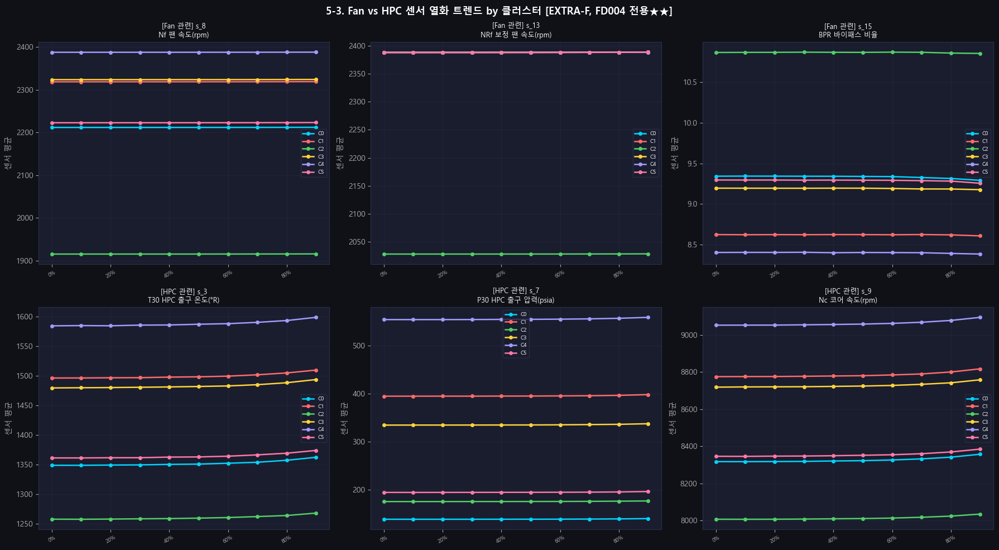


--- Fan vs HPC 센서 클러스터별 RUL 상관 비교 ---
  Fan 관련: {'s_8': np.float64(-0.509), 's_13': np.float64(-0.509), 's_15': np.float64(-0.022), 's_14': np.float64(-0.449)}
  HPC 관련: {'s_3': np.float64(-0.583), 's_7': np.float64(-0.288), 's_9': np.float64(-0.523), 's_11': np.float64(-0.687), 's_12': np.float64(-0.308)}

📌 FD004 전용: 6가지 조건에서 두 고장 모드가 동시 진행 → 클러스터별로 Fan/HPC 신호 패턴 다름


In [125]:
print('=== 5-3. Fan vs HPC 이중 고장 모드 센서 비교 [EXTRA-F, FD004 전용★★] ===')
mc_f = train_raw.groupby('unit_nr')['time_cycles'].max().rename('max_c')
fd4_trj = train_raw.join(mc_f, on='unit_nr').copy()
fd4_trj['RUL'] = fd4_trj['max_c'] - fd4_trj['time_cycles']
fd4_trj['norm_life'] = fd4_trj['time_cycles']/fd4_trj['max_c']

# 이미 정의된 USEFUL_SENSORS 있으면 사용, 없으면 임시 정의
_USEFUL = [s for s in SENSOR_COLS if s not in ['s_1','s_5','s_6','s_16','s_18','s_19']]
fan_useful = [s for s in FAN_SENSORS if s in _USEFUL]
hpc_useful = [s for s in HPC_SENSORS if s in _USEFUL]
fan_use = fan_useful[:3] if len(fan_useful)>=3 else fan_useful
hpc_use = hpc_useful[:3] if len(hpc_useful)>=3 else hpc_useful

fig, axes = plt.subplots(2, max(len(fan_use),len(hpc_use),1), figsize=(18, 10))
fig.suptitle('5-3. Fan vs HPC 센서 열화 트렌드 by 클러스터 [EXTRA-F, FD004 전용★★]',
             fontsize=13, fontweight='bold')

bins_f = np.linspace(0,1,11)
labels_f = [f'{int(a*100)}%' for a in bins_f[:-1]]

for row_idx, (sensors_list, title) in enumerate([(fan_use,'Fan 관련'),(hpc_use,'HPC 관련')]):
    for col_idx, s in enumerate(sensors_list):
        ax = axes[row_idx,col_idx] if axes.ndim>1 else axes[col_idx]
        fd4_trj['life_bin'] = pd.cut(fd4_trj['norm_life'], bins=bins_f, labels=labels_f)
        for c in range(N_CLUSTERS):
            sub = fd4_trj[fd4_trj['op_cluster']==c]
            means = sub.groupby('life_bin', observed=True)[s].mean()
            ax.plot(range(len(means)), means.values,
                    color=CLUSTER_COLORS[c], lw=1.8, marker='o', markersize=4, label=f'C{c}')
        ax.set_title(f'[{title}] {s}\n{SENSOR_DESC.get(s,s)[:25]}', fontsize=9)
        ax.set_xticks(range(0,10,2)); ax.set_xticklabels([labels_f[i] for i in range(0,10,2)], rotation=30, fontsize=7)
        ax.set_ylabel('센서 평균'); ax.legend(fontsize=7)

plt.tight_layout(); plt.show()

print('\n--- Fan vs HPC 센서 클러스터별 RUL 상관 비교 ---')
fd4_trj_rul = fd4_trj.copy()
for group_name, group_sensors in [('Fan 관련',fan_useful),('HPC 관련',hpc_useful)]:
    if not group_sensors: continue
    cluster_corrs = []
    for c in range(N_CLUSTERS):
        sub = fd4_trj_rul[fd4_trj_rul['op_cluster']==c]
        if len(sub)>50:
            c_corrs = sub[group_sensors+['RUL']].corr()['RUL'][group_sensors]
            cluster_corrs.append(c_corrs)
    if cluster_corrs:
        avg = pd.concat(cluster_corrs, axis=1).mean(axis=1)
        print(f'  {group_name}: {dict(avg.round(3))}')
print('\n📌 FD004 전용: 6가지 조건에서 두 고장 모드가 동시 진행 → 클러스터별로 Fan/HPC 신호 패턴 다름')


### 5-4. 분산 분해 [EXTRA-D]

=== 5-4. 분산 분해 (EXTRA-D) ===


,engine_pct,cluster_pct,within_pct
센서,,,
s_1,0.200000,116.400000,0.000000
s_2,0.300000,123.600000,0.000000
s_3,0.300000,127.200000,0.000000
s_4,0.400000,126.200000,0.000000
s_5,0.200000,113.600000,0.000000
s_6,0.200000,115.500000,0.000000
s_7,0.300000,118.500000,0.000000
s_8,0.300000,133.600000,0.000000
s_9,0.300000,127.900000,0.000000


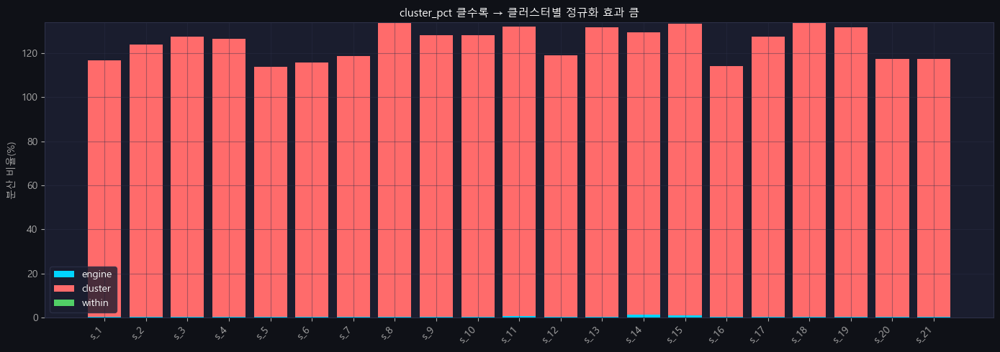

In [126]:
print('=== 5-4. 분산 분해 (EXTRA-D) ===')
def var_decomp(df, sensor):
    total_var = df[sensor].var()
    if total_var < 1e-9: return None
    var_engine  = df.groupby('unit_nr')[sensor].mean().var()
    var_cluster = df.groupby('op_cluster')[sensor].mean().var()
    return {'total':total_var,'engine':var_engine,'cluster':var_cluster,
            'within':max(total_var-var_engine-var_cluster,0)}

rows = []
for s in SENSOR_COLS:
    if train_raw[s].std()<1e-6: continue
    d = var_decomp(train_raw,s)
    if d is None: continue
    rows.append({'센서':s,'engine_pct':round(d['engine']/d['total']*100,1),
                 'cluster_pct':round(d['cluster']/d['total']*100,1),
                 'within_pct':round(d['within']/d['total']*100,1)})
vd_df = pd.DataFrame(rows).set_index('센서')
display(vd_df.style.background_gradient(subset=['cluster_pct'],cmap='YlOrRd'))
fig, ax = plt.subplots(figsize=(14, 5))
x = np.arange(len(vd_df))
ax.bar(x, vd_df['engine_pct'],  color=C[0], label='engine')
ax.bar(x, vd_df['cluster_pct'], bottom=vd_df['engine_pct'], color=C[1], label='cluster')
ax.bar(x, vd_df['within_pct'],  bottom=vd_df['engine_pct']+vd_df['cluster_pct'], color=C[2], label='within')
ax.set_xticks(x); ax.set_xticklabels(vd_df.index, rotation=45, ha='right')
ax.set_ylabel('분산 비율(%)'); ax.legend(); ax.set_title('cluster_pct 클수록 → 클러스터별 정규화 효과 큼')
plt.tight_layout(); plt.show()


### 5-5. SNR per sensor [EXTRA-E]

=== 5-5. SNR per sensor (cluster-aware, EXTRA-E) ===


,SNR_mean,|SNR|_mean,SNR_std
센서,,,
s_11,2.155000,2.155000,0.065000
s_4,2.045000,2.045000,0.099000
s_17,1.892000,1.892000,0.100000
s_3,1.826000,1.826000,0.097000
s_9,1.678000,1.678000,0.021000
s_2,1.669000,1.669000,0.166000
s_13,1.624000,1.624000,0.422000
s_8,1.621000,1.621000,0.426000
s_14,1.452000,1.452000,0.035000


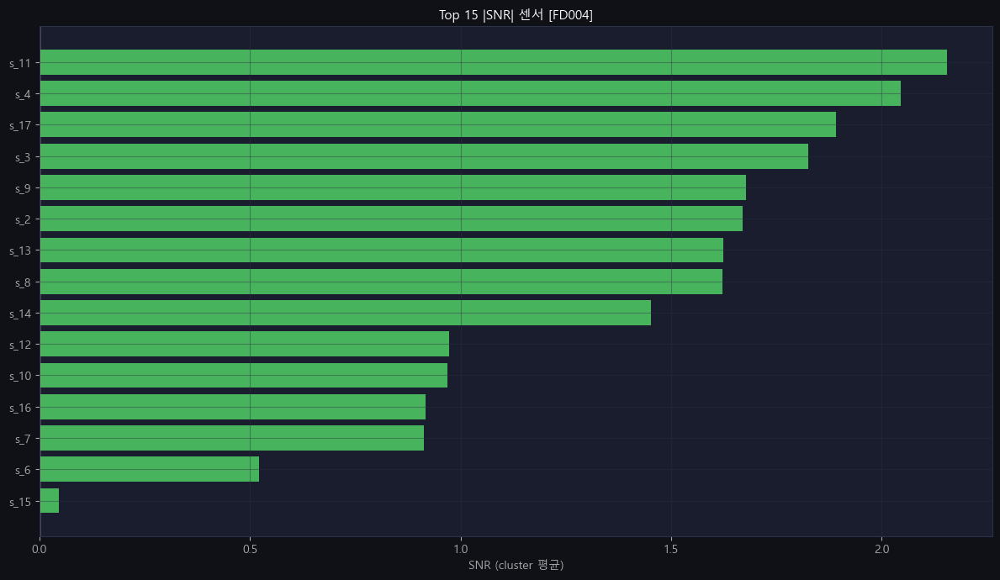

In [127]:
print('=== 5-5. SNR per sensor (cluster-aware, EXTRA-E) ===')
mc_snr = train_raw.groupby('unit_nr')['time_cycles'].max().rename('max_c')
snr_src = train_raw.join(mc_snr, on='unit_nr')
snr_src['RUL'] = snr_src['max_c'] - snr_src['time_cycles']
snr_rows = []
for s in SENSOR_COLS:
    cluster_snrs = []
    for c in range(N_CLUSTERS):
        sub = snr_src[snr_src['op_cluster']==c]
        if len(sub)<50: continue
        early = sub[sub['RUL']>sub['RUL'].quantile(0.8)][s].mean()
        late  = sub[sub['RUL']<sub['RUL'].quantile(0.2)][s].mean()
        std   = sub[s].std()
        if std>1e-6: cluster_snrs.append((late-early)/std)
    if cluster_snrs:
        snr_rows.append({'센서':s,'SNR_mean':round(np.mean(cluster_snrs),3),
                         '|SNR|_mean':round(np.mean(np.abs(cluster_snrs)),3),
                         'SNR_std':round(np.std(cluster_snrs),3)})

snr_df = pd.DataFrame(snr_rows).set_index('센서').sort_values('|SNR|_mean',ascending=False)
display(snr_df.style.background_gradient(subset=['|SNR|_mean'],cmap='YlOrRd'))
fig, ax = plt.subplots(figsize=(12,7))
top = snr_df.head(15)
bc = [C[2] if v>0 else C[1] for v in top['SNR_mean']]
ax.barh(top.index[::-1], top['SNR_mean'][::-1], color=bc[::-1], alpha=0.85)
ax.axvline(0,color='white',lw=1); ax.set_xlabel('SNR (cluster 평균)')
ax.set_title('Top 15 |SNR| 센서 [FD004]')
plt.tight_layout(); plt.show()


---
## 6. [ML_EDA 고유] 시각화 & pingouin 통계 검정

### 6-1. 엔진별 regime scatter [ML_EDA 고유]


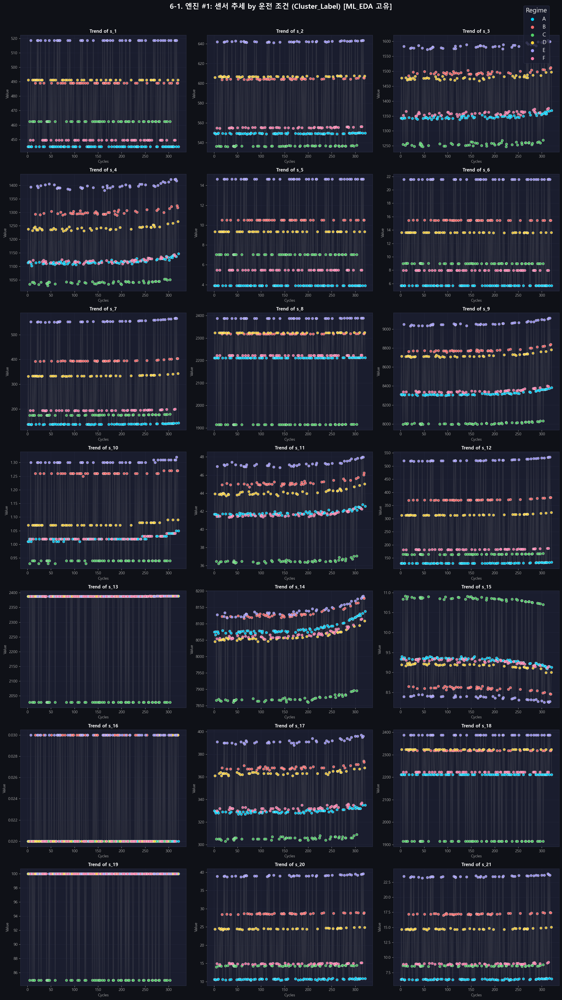

In [128]:
# ML_EDA Cell 9: 엔진별 regime scatter (Cluster_Label 색상)
unit_id = train_raw['unit_nr'].iloc[0]
unit_data = train_raw[train_raw['unit_nr']==unit_id].sort_values('time_cycles')
sensor_cols_all = [f's_{i}' for i in range(1,22)]
regime_order = [CLUSTER_MAP[i] for i in range(N_CLUSTERS)]
palette_regime = {lbl:CLUSTER_COLORS[i] for i,lbl in enumerate(regime_order)}

fig, axes = plt.subplots(7, 3, figsize=(20, 35))
fig.suptitle(f'6-1. 엔진 #{unit_id}: 센서 추세 by 운전 조건 (Cluster_Label) [ML_EDA 고유]',
             fontsize=18, fontweight='bold', y=1.01)
axes = axes.flatten()
for i, col in enumerate(sensor_cols_all):
    axes[i].plot(unit_data['time_cycles'], unit_data[col], color='gray', alpha=0.2, zorder=1)
    for lbl in regime_order:
        sub = unit_data[unit_data['Cluster_Label']==lbl]
        axes[i].scatter(sub['time_cycles'], sub[col], color=palette_regime[lbl],
                        s=40, edgecolor='w', linewidth=0.5, alpha=0.85, label=lbl, zorder=2)
    axes[i].set_title(f'Trend of {col}', fontsize=12, fontweight='bold')
    axes[i].set_xlabel('Cycles'); axes[i].set_ylabel('Value')
    if axes[i].get_legend(): axes[i].get_legend().remove()
handles = [plt.scatter([],[],color=palette_regime[l],s=50,label=l) for l in regime_order]
fig.legend(handles=handles, labels=regime_order, loc='upper right',
           bbox_to_anchor=(0.98,1.01), title='Regime', fontsize=14, title_fontsize=16)
plt.tight_layout(); plt.show()


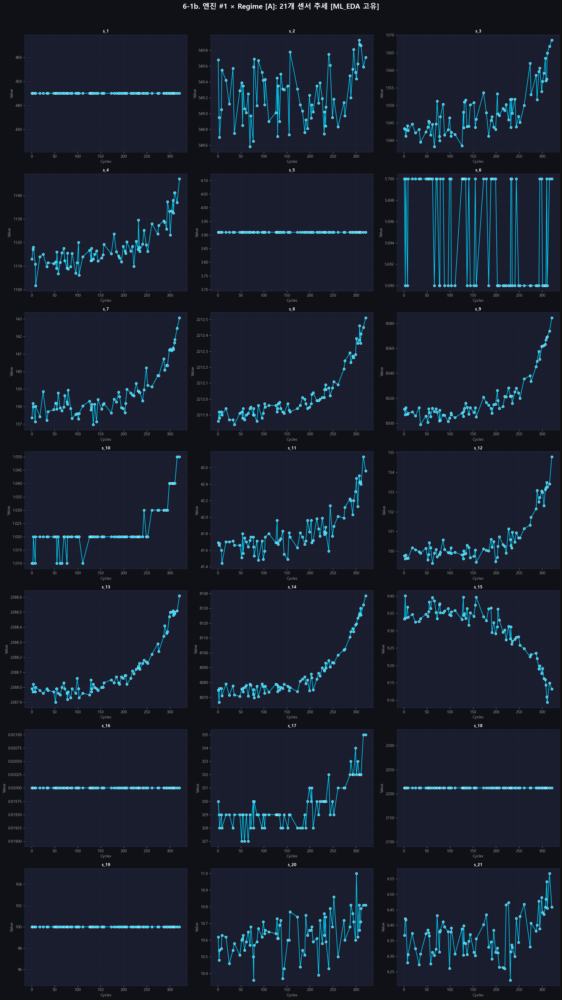

In [129]:
# ML_EDA Cell 10: 특정 regime 필터링 시각화 [ML_EDA 고유]
unit_id_f = train_raw['unit_nr'].iloc[0]
target_regime_f = 'A'
filtered_data = train_raw[(train_raw['unit_nr']==unit_id_f)&
                           (train_raw['Cluster_Label']==target_regime_f)].sort_values('time_cycles')

if len(filtered_data)==0:
    print(f'⚠️ 엔진 #{unit_id_f}에서 Regime {target_regime_f} 데이터 없음')
    print(f'   실제 조건: {train_raw[train_raw["unit_nr"]==unit_id_f]["Cluster_Label"].unique()}')
else:
    fig, axes = plt.subplots(7, 3, figsize=(20, 35))
    fig.suptitle(f'6-1b. 엔진 #{unit_id_f} × Regime [{target_regime_f}]: 21개 센서 추세 [ML_EDA 고유]',
                 fontsize=18, fontweight='bold', y=1.01)
    axes = axes.flatten()
    c_idx = [k for k,v in CLUSTER_MAP.items() if v==target_regime_f][0]
    for i, col in enumerate(sensor_cols_all):
        import seaborn as sns
        sns.lineplot(data=filtered_data, x='time_cycles', y=col, ax=axes[i], marker='o', color=CLUSTER_COLORS[c_idx])
        axes[i].set_title(f'{col}', fontsize=11, fontweight='bold')
        axes[i].set_xlabel('Cycles'); axes[i].set_ylabel('Value')
    plt.tight_layout(); plt.show()


### 6-2. Slope 분석 (Cluster_Label 기준) [ML_EDA 고유]

=== 6-2. Slope 분석 (Cluster_Label 기준) [ML_EDA 고유] ===


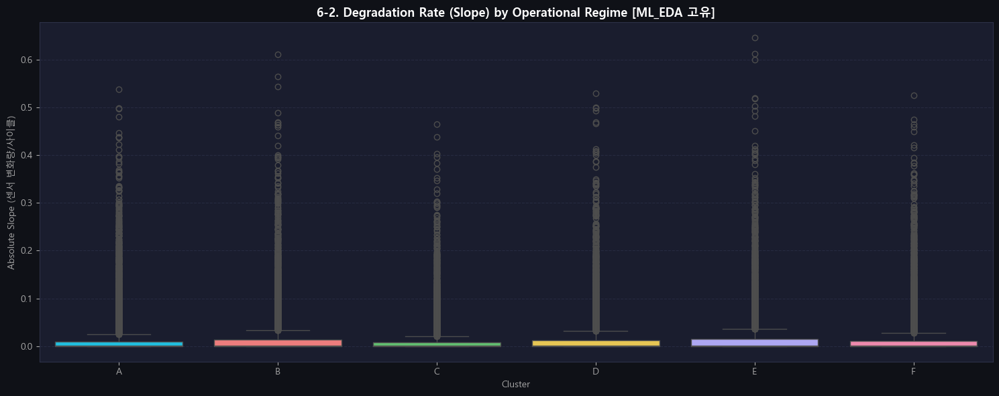


=== 6-2b. 클러스터링 노이즈 감소율 [ML_EDA 고유] ===
  setting_1: 전체 std=14.7807 → 클러스터 내 std=0.0026  감소율=100.0%
  setting_2: 전체 std=0.3107 → 클러스터 내 std=0.0006  감소율=99.8%
  setting_3: 전체 std=14.2520 → 클러스터 내 std=0.0000  감소율=100.0%

=== 6-2c. regime_summary (클러스터별 운전 조건 평균) ===


,setting_1,setting_2,setting_3
Cluster_Label,,,
E,0.001508,0.000495,100.0
B,10.002990,0.250503,100.0
D,20.002974,0.700505,100.0
C,25.003053,0.620504,60.0
F,35.003029,0.840506,100.0
A,42.002987,0.840495,100.0


In [130]:
# ML_EDA Cell 11: slope 분석 (Cluster_Label 기준)
print('=== 6-2. Slope 분석 (Cluster_Label 기준) [ML_EDA 고유] ===')
results = []
for unit in train_raw['unit_nr'].unique():
    unit_df = train_raw[train_raw['unit_nr']==unit]
    for cluster in regime_order:
        cluster_df = unit_df[unit_df['Cluster_Label']==cluster]
        if len(cluster_df)>5:
            for sensor in SENSOR_COLS:
                slope, _, _, _, _ = __import__('scipy').stats.linregress(cluster_df['time_cycles'], cluster_df[sensor])
                results.append({'unit_nr':unit,'Cluster':cluster,'Sensor':sensor,'Slope':abs(slope)})

slope_df_ml = pd.DataFrame(results)
plt.figure(figsize=(15,6))
sns.boxplot(data=slope_df_ml, x='Cluster', y='Slope', palette=[CLUSTER_COLORS[i] for i in range(N_CLUSTERS)])
plt.title('6-2. Degradation Rate (Slope) by Operational Regime [ML_EDA 고유]', fontsize=13, fontweight='bold')
plt.ylabel('Absolute Slope (센서 변화량/사이클)'); plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout(); plt.show()

# 클러스터별 노이즈 감소율 [ML_EDA Cell 3]
print('\n=== 6-2b. 클러스터링 노이즈 감소율 [ML_EDA 고유] ===')
for op in OP_COLS:
    raw_std = train_raw[op].std()
    cluster_std = train_raw.groupby('op_cluster')[op].std().mean()
    reduction = (raw_std-cluster_std)/raw_std*100
    print(f'  {op}: 전체 std={raw_std:.4f} → 클러스터 내 std={cluster_std:.4f}  감소율={reduction:.1f}%')

# regime_summary [ML_EDA Cell 7]
regime_summary = train_raw.groupby('Cluster_Label')[OP_COLS].mean()
print('\n=== 6-2c. regime_summary (클러스터별 운전 조건 평균) ===')
display(regime_summary.sort_values('setting_1'))


### 6-3. pingouin 통계 검정 [ML_EDA 고유]

In [131]:
try:
    import pingouin as pg

    def analyze_sensor_mean_by_cluster(df, sensor_name):
        print(f'\n{"="*70}')
        print(f' [{sensor_name}] 운행 조건별 평균 센서량 차이 검정')
        print('='*70)
        data = df[['Cluster','Cluster_Label',sensor_name]].dropna()
        levene_test = pg.homoscedasticity(data=data, dv=sensor_name, group='Cluster', method='levene')
        is_equal_var = levene_test.iloc[0,0]; levene_p = levene_test.iloc[0,1]
        print(f'  등분산성: {"만족" if is_equal_var else "위배"} (p={levene_p:.5f})')
        if is_equal_var: aov = pg.anova(dv=sensor_name, between='Cluster', data=data); posthoc_method='tukey'
        else: aov = pg.welch_anova(dv=sensor_name, between='Cluster', data=data); posthoc_method='gameshowell'
        p_cols = [c for c in aov.columns if any(x in c.lower() for x in ['p-','p_val','pvalue','p-unc']) or c.lower()=='p']
        anova_p = aov[p_cols[0]].values[0] if p_cols else aov.iloc[0,-1]
        print(f'  ANOVA p-value: {anova_p:.6f}  → {"유의 ✅" if anova_p<0.05 else "비유의 ⚠️"}')
        if anova_p<0.05:
            posthoc = pg.pairwise_tukey(dv=sensor_name,between='Cluster',data=data) if posthoc_method=='tukey' else                       pg.pairwise_gameshowell(dv=sensor_name,between='Cluster',data=data)
            ph_p_cols = [c for c in posthoc.columns if any(x in c.lower() for x in ['p-','pvalue','p-adj']) or c.lower()=='p']
            ph_p_col = ph_p_cols[0] if ph_p_cols else posthoc.columns[-1]
            significant = posthoc[posthoc[ph_p_col]<0.05]
            if not significant.empty:
                display_cols = [c for c in ['A','B','diff',ph_p_col] if c in posthoc.columns]
                display(significant[display_cols].sort_values('diff',ascending=False).head(10))

    # EDA용 cluster 컬럼 추가
    train_eda2 = train_raw.copy()
    train_eda2['Cluster'] = cluster_labels_eda

    for s in ['s_2','s_11']:
        if s in SENSOR_COLS: analyze_sensor_mean_by_cluster(train_eda2, s)

except ImportError:
    print('⚠️ pingouin이 설치되지 않았습니다. pip install pingouin 실행 후 재시도하세요.')



 [s_2] 운행 조건별 평균 센서량 차이 검정
  등분산성: 만족 (p=0.00000)
  ANOVA p-value: 0.999835  → 비유의 ⚠️

 [s_11] 운행 조건별 평균 센서량 차이 검정
  등분산성: 만족 (p=0.00000)
  ANOVA p-value: 0.992503  → 비유의 ⚠️


In [132]:
try:
    import pingouin as pg

    def analyze_trend_difference(df, sensor_name):
        print(f'\n{"="*70}')
        print(f' [{sensor_name}] 클러스터별 추세(Slope) 차이 검정')
        print('='*70)
        slopes = []
        for (unit, cluster), group in df.groupby(['unit_nr','Cluster_Label']):
            if len(group)<2: continue
            X = group['time_cycles'].values.reshape(-1,1); y = group[sensor_name].values
            model = LinearRegression().fit(X,y)
            slopes.append({'unit_NR':unit,'Cluster_Label':cluster,'Slope_Value':model.coef_[0]})
        slope_df_local = pd.DataFrame(slopes)
        levene_test = pg.homoscedasticity(data=slope_df_local, dv='Slope_Value', group='Cluster_Label')
        is_equal_var = levene_test.iloc[0,0]
        if is_equal_var:
            aov = pg.anova(dv='Slope_Value', between='Cluster_Label', data=slope_df_local)
        else:
            aov = pg.welch_anova(dv='Slope_Value', between='Cluster_Label', data=slope_df_local)
        p_cols = [c for c in aov.columns if any(x in c.lower() for x in ['p-','p_val','pvalue','p-unc']) or c.lower()=='p']
        anova_p = aov[p_cols[0]].values[0] if p_cols else aov.iloc[0,-1]
        print(f'  ANOVA p-value: {anova_p:.6f}  → {"클러스터별 추세 차이 있음 ✅" if anova_p<0.05 else "추세 차이 없음 ⚠️"}')

    train_eda3 = train_raw.copy()
    for s in ['s_3','s_7']:
        if s in SENSOR_COLS: analyze_trend_difference(train_eda3, s)

except ImportError:
    print('⚠️ pingouin이 설치되지 않았습니다.')



 [s_3] 클러스터별 추세(Slope) 차이 검정
  ANOVA p-value: 0.049824  → 클러스터별 추세 차이 있음 ✅

 [s_7] 클러스터별 추세(Slope) 차이 검정
  ANOVA p-value: 0.022269  → 클러스터별 추세 차이 있음 ✅


---
## 7. 결정 1 — 센서 제거 (수동 포함)

자동 제거 (4개): ['s_5', 's_16', 's_18', 's_19']
수동 제거 (2개): ['s_1', 's_6']
최종 제거 (6개): ['s_1', 's_5', 's_6', 's_16', 's_18', 's_19']
유지 (15개): ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_10', 's_11', 's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']


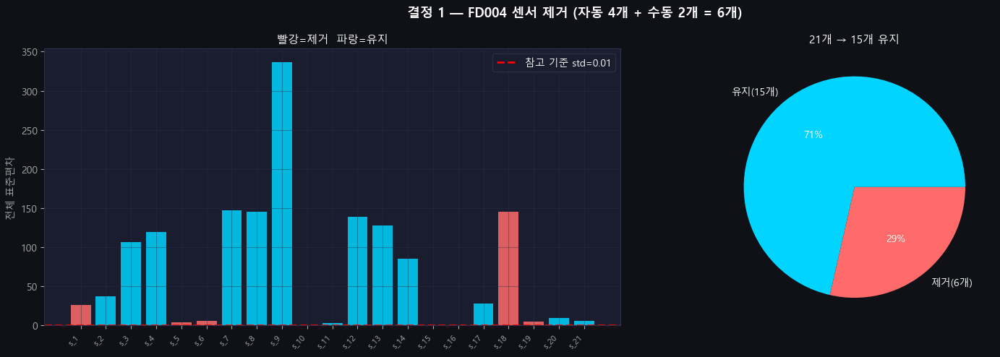


✅ 결정 1 완료  21개 → 15개
✅ FD004 센서 제거 검증 완료: 6개 제거, 15개 유지


In [133]:
# FD004 확정: 자동 제거 4개 + 수동 제거 2개
# - 자동 제거: FD004 EDA 결론 기준 저변동/상수성 센서
# - 수동 제거: 통계 검정 및 해석 기반 제거

AUTO_REMOVE = ['s_5', 's_16', 's_18', 's_19']
MANUAL_REMOVE = ['s_1', 's_6']

train_std = train_raw[SENSOR_COLS].std()

REMOVE_SENSORS = sorted(
    set(AUTO_REMOVE + MANUAL_REMOVE),
    key=lambda x: int(x.split('_')[1])
)

USEFUL_SENSORS = sorted(
    [s for s in SENSOR_COLS if s not in REMOVE_SENSORS],
    key=lambda x: int(x.split('_')[1])
)

print(f'자동 제거 ({len(AUTO_REMOVE)}개): {AUTO_REMOVE}')
print(f'수동 제거 ({len(MANUAL_REMOVE)}개): {MANUAL_REMOVE}')
print(f'최종 제거 ({len(REMOVE_SENSORS)}개): {REMOVE_SENSORS}')
print(f'유지 ({len(USEFUL_SENSORS)}개): {USEFUL_SENSORS}')

# 검증
EXPECTED_REMOVE_SENSORS = ['s_1', 's_5', 's_6', 's_16', 's_18', 's_19']
assert REMOVE_SENSORS == EXPECTED_REMOVE_SENSORS, f"제거 센서 불일치: {REMOVE_SENSORS}"
assert len(USEFUL_SENSORS) == 15, f"유지 센서 수 불일치: {len(USEFUL_SENSORS)}"

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle(
    '결정 1 — FD004 센서 제거 (자동 4개 + 수동 2개 = 6개)',
    fontsize=13,
    fontweight='bold'
)

colors_bar = ['#ff6b6b' if s in REMOVE_SENSORS else '#00d4ff' for s in SENSOR_COLS]

axes[0].bar(range(len(SENSOR_COLS)), train_std.values, color=colors_bar, alpha=0.85)
axes[0].axhline(CONST_THR, color='red', ls='--', lw=2, label=f'참고 기준 std={CONST_THR}')
axes[0].set_xticks(range(len(SENSOR_COLS)))
axes[0].set_xticklabels(SENSOR_COLS, rotation=45, ha='right', fontsize=8)
axes[0].set_ylabel('전체 표준편차')
axes[0].set_title('빨강=제거  파랑=유지')
axes[0].legend()

axes[1].pie(
    [len(USEFUL_SENSORS), len(REMOVE_SENSORS)],
    labels=[f'유지({len(USEFUL_SENSORS)}개)', f'제거({len(REMOVE_SENSORS)}개)'],
    colors=[C[0], C[1]],
    autopct='%1.0f%%',
    textprops={'color': WHITE}
)
axes[1].set_title(f'21개 → {len(USEFUL_SENSORS)}개 유지')

plt.tight_layout()
plt.show()

KEEP = ID_COLS + OP_COLS + USEFUL_SENSORS

train_s1 = train_raw[KEEP + ['op_cluster']].copy()
test_s1  = test_raw[KEEP + ['op_cluster']].copy()

print(f'\n✅ 결정 1 완료  {len(SENSOR_COLS)}개 → {len(USEFUL_SENSORS)}개')
print('✅ FD004 센서 제거 검증 완료: 6개 제거, 15개 유지')

## 8. 결정 2 — Piecewise RUL (Cap = 125)

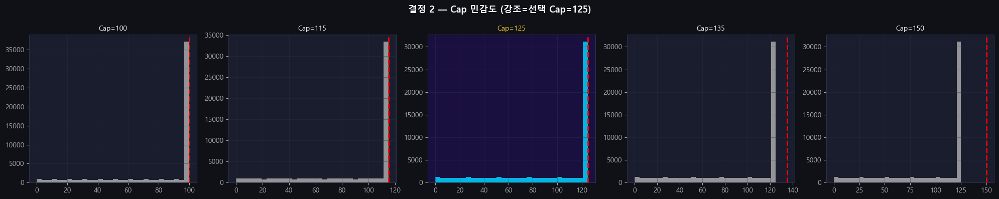

✅ 결정 2 완료  RUL: min=0  max=125  Cap=125


In [134]:
max_cycle = train_s1.groupby('unit_nr')['time_cycles'].max().rename('max_cycle')
train_s1 = train_s1.join(max_cycle, on='unit_nr')
train_s1['RUL'] = (train_s1['max_cycle']-train_s1['time_cycles']).clip(upper=RUL_CAP)
train_s1.drop(columns=['max_cycle'], inplace=True)

caps = [100,115,125,135,150]
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
fig.suptitle('결정 2 — Cap 민감도 (강조=선택 Cap=125)', fontsize=13, fontweight='bold')
for ax, cap in zip(axes, caps):
    ax.hist(train_s1['RUL'].clip(upper=cap), bins=30, color=C[0] if cap==RUL_CAP else GRAY, alpha=0.85, edgecolor='none')
    ax.axvline(cap, color='red', ls='--', lw=2)
    ax.set_title(f'Cap={cap}', color='#ffd43b' if cap==RUL_CAP else WHITE, fontsize=10)
    if cap==RUL_CAP: ax.patch.set_facecolor('#1a1040')
plt.tight_layout(); plt.show()
print(f'✅ 결정 2 완료  RUL: min={train_s1["RUL"].min()}  max={train_s1["RUL"].max()}  Cap={RUL_CAP}')


## 9. 결정 3 — 클러스터별 Gaussian 스무딩 (σ = 2)

In [135]:
train_s2 = train_s1.copy(); test_s2 = test_s1.copy()
for c in range(N_CLUSTERS):
    for uid in train_s1[train_s1['op_cluster']==c]['unit_nr'].unique():
        mask = train_s2['unit_nr']==uid
        for s in USEFUL_SENSORS:
            train_s2.loc[mask,s] = gaussian_filter1d(train_s2.loc[mask,s].values, sigma=GAUSS_SIGMA)
    for uid in test_s1[test_s1['op_cluster']==c]['unit_nr'].unique():
        mask = test_s2['unit_nr']==uid
        for s in USEFUL_SENSORS:
            test_s2.loc[mask,s] = gaussian_filter1d(test_s2.loc[mask,s].values, sigma=GAUSS_SIGMA)
print(f'✅ 결정 3 완료  클러스터별 Gaussian σ={GAUSS_SIGMA}')


✅ 결정 3 완료  클러스터별 Gaussian σ=2


## 10. 결정 4 — Validation 분리 (엔진 단위 80:20, seed=42)

In [136]:
all_units = sorted(train_s2['unit_nr'].unique())
train_units, valid_units = train_test_split(all_units, test_size=0.2, random_state=42)
subtrain_raw = train_s2[train_s2['unit_nr'].isin(train_units)].copy().reset_index(drop=True)
valid_raw    = train_s2[train_s2['unit_nr'].isin(valid_units)].copy().reset_index(drop=True)
assert len(set(train_units)&set(valid_units))==0, '❌ 엔진 겹침'
print(f'✅ 결정 4 완료  Sub-train: {len(train_units)}대  |  Validation: {len(valid_units)}대')

✅ 결정 4 완료  Sub-train: 199대  |  Validation: 50대


## 11. 결정 5 — 클러스터별 MinMax 정규화 + OHE

In [137]:
scalers = {}
train_s4 = subtrain_raw.copy(); valid_s4 = valid_raw.copy(); test_s4 = test_s2.copy()
for c in range(N_CLUSTERS):
    mask_tr = train_s4['op_cluster']==c
    mask_va = valid_s4['op_cluster']==c
    mask_te = test_s4['op_cluster']==c
    sc = MinMaxScaler()
    train_s4.loc[mask_tr, USEFUL_SENSORS] = sc.fit_transform(train_s4.loc[mask_tr, USEFUL_SENSORS])
    if mask_va.any(): valid_s4.loc[mask_va, USEFUL_SENSORS] = sc.transform(valid_s4.loc[mask_va, USEFUL_SENSORS])
    if mask_te.any(): test_s4.loc[mask_te,  USEFUL_SENSORS] = sc.transform(test_s4.loc[mask_te,  USEFUL_SENSORS])
    scalers[c] = sc
    print(f'  C{c}: {mask_tr.sum()}행 기준 fit')

OHE_COLS = [f'cluster_{i}' for i in range(N_CLUSTERS)]
for df in [train_s4, valid_s4, test_s4]:
    ohe = pd.get_dummies(df['op_cluster'], prefix='cluster', dtype=float)
    for col in OHE_COLS:
        df[col] = ohe[col].values if col in ohe.columns else 0.0

subtrain_s4 = train_s4  # 전처리 후 검증 참조용
DL_FEATURES = USEFUL_SENSORS + OHE_COLS
print(f'\n✅ 결정 5 완료  클러스터별 MinMax + OHE({len(OHE_COLS)}채널)')
print(f'DL_FEATURES: 센서 {len(USEFUL_SENSORS)}개 + OHE {len(OHE_COLS)}개 = {len(DL_FEATURES)}채널')


  C0: 12409행 기준 fit
  C1: 7385행 기준 fit
  C2: 7371행 기준 fit
  C3: 7307행 기준 fit
  C4: 7447행 기준 fit
  C5: 7375행 기준 fit

✅ 결정 5 완료  클러스터별 MinMax + OHE(6채널)
DL_FEATURES: 센서 15개 + OHE 6개 = 21채널


---
## 12. 전처리 후 검증
### 12-1. 센서 상관관계 전후 비교

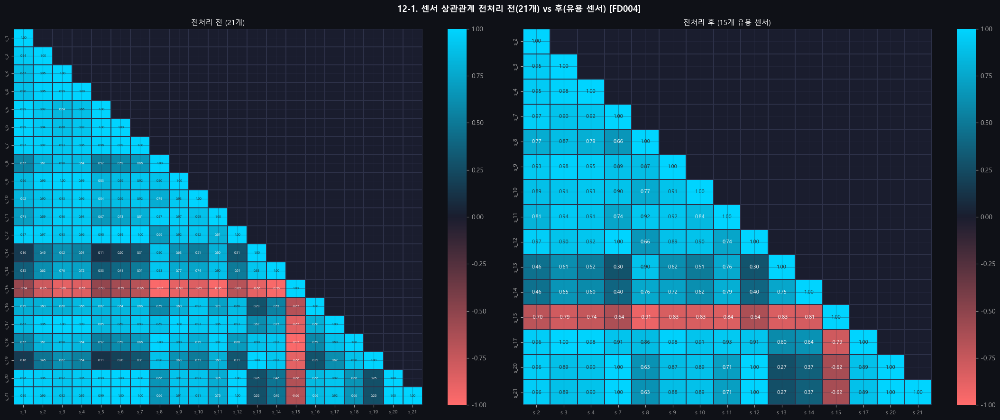

In [138]:
corr_after = subtrain_s4[USEFUL_SENSORS].corr()
fig, axes = plt.subplots(1, 2, figsize=(22, 9))
fig.suptitle('12-1. 센서 상관관계 전처리 전(21개) vs 후(유용 센서) [FD004]', fontsize=13, fontweight='bold')
mask_b = np.triu(np.ones_like(corr_before,dtype=bool),k=1)
sns.heatmap(corr_before, ax=axes[0], mask=mask_b, cmap=cmap_rg, center=0,
            vmin=-1, vmax=1, annot=True, fmt='.2f', annot_kws={'size':5}, linewidths=0.3, linecolor=GRID)
axes[0].set_title(f'전처리 전 (21개)'); axes[0].tick_params(labelsize=7)
mask_a = np.triu(np.ones_like(corr_after,dtype=bool),k=1)
sns.heatmap(corr_after, ax=axes[1], mask=mask_a, cmap=cmap_rg, center=0,
            vmin=-1, vmax=1, annot=True, fmt='.2f', annot_kws={'size':8}, linewidths=0.3, linecolor=GRID)
axes[1].set_title(f'전처리 후 ({len(USEFUL_SENSORS)}개 유용 센서)'); axes[1].tick_params(labelsize=8)
plt.tight_layout(); plt.show()


### 12-2. 센서 분포 전처리 전후 비교

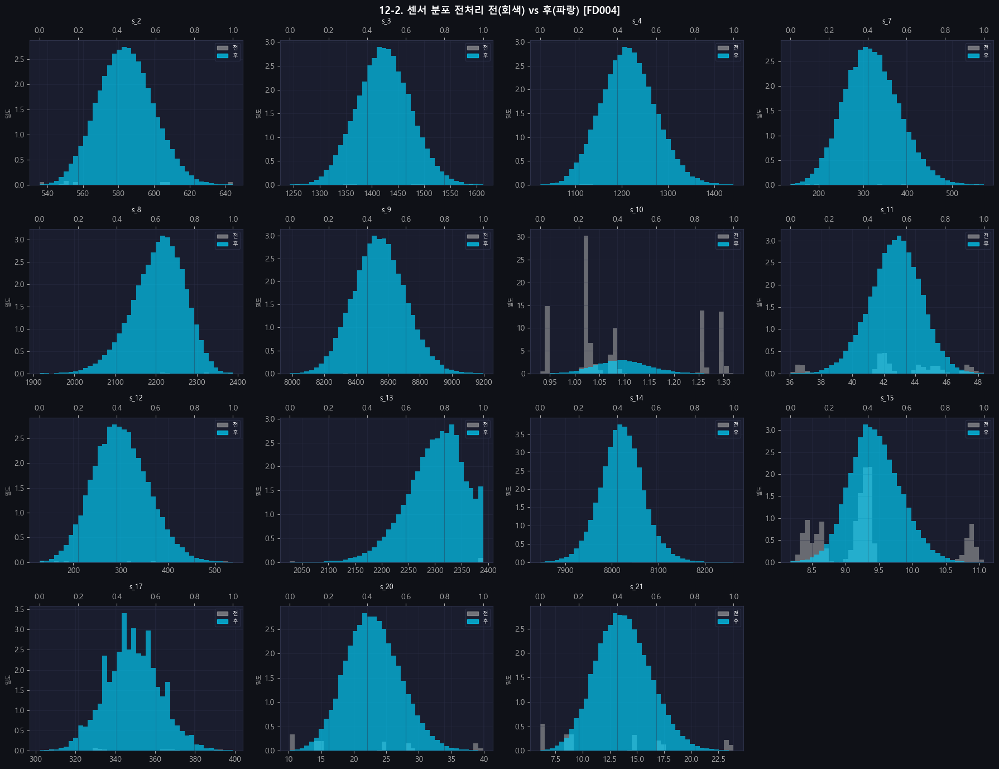

📌 전처리 전 멀티모달 분포 → 클러스터별 정규화 후 각 클러스터 내 균일 분포


In [139]:
n_c=4; n_r=(len(USEFUL_SENSORS)+n_c-1)//n_c
fig, axes = plt.subplots(n_r, n_c, figsize=(18, n_r*3.5))
fig.suptitle('12-2. 센서 분포 전처리 전(회색) vs 후(파랑) [FD004]', fontsize=13, fontweight='bold')
for ax, s in zip(axes.flat, USEFUL_SENSORS):
    before = train_raw[s]; after = subtrain_s4[s]
    ax2 = ax.twiny()
    ax.hist(before,  bins=40, color=GRAY, alpha=0.55, density=True, edgecolor='none')
    ax2.hist(after,  bins=40, color=C[0], alpha=0.65, density=True, edgecolor='none')
    ax.set_title(f'{s}', fontsize=9); ax.set_ylabel('밀도',fontsize=7)
    handles = [mpatches.Patch(color=GRAY,alpha=0.6,label='전'),mpatches.Patch(color=C[0],alpha=0.7,label='후')]
    ax.legend(handles=handles, fontsize=7)
for ax in axes.flat[len(USEFUL_SENSORS):]: ax.set_visible(False)
plt.tight_layout(); plt.show()
print('📌 전처리 전 멀티모달 분포 → 클러스터별 정규화 후 각 클러스터 내 균일 분포')


### 12-3. Train vs Test 분포 비교 (KS 검정)

=== 12-3. Train vs Test 분포 비교 ===


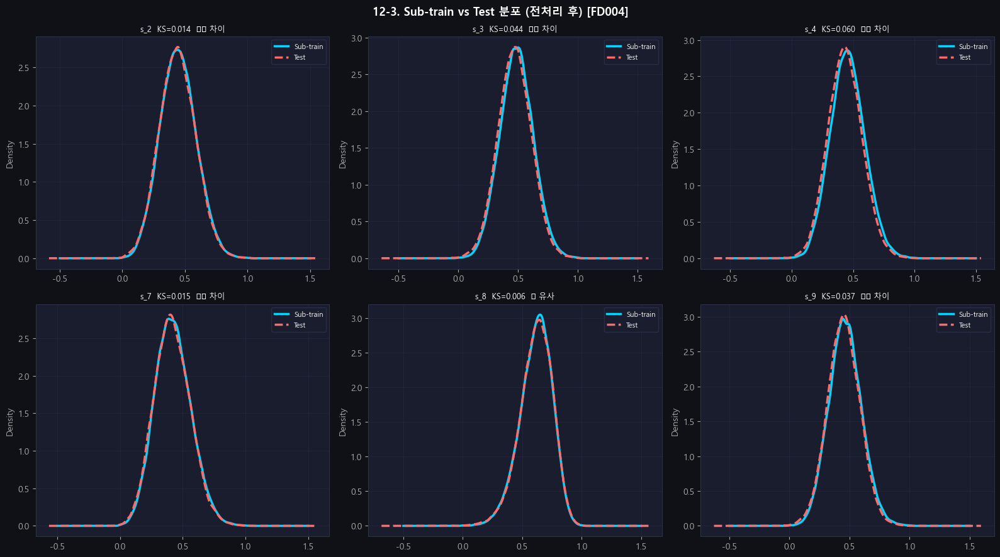

,센서,KS,p,p_adj_BH,판정_BH
0,s_2,0.0144,0.0002,0.0002,차이⚠️
1,s_3,0.0443,0.0000,0.0000,차이⚠️
2,s_4,0.0601,0.0000,0.0000,차이⚠️
3,s_7,0.0150,0.0001,0.0001,차이⚠️
4,s_8,0.0064,0.3074,0.3074,유사✅
5,s_9,0.0369,0.0000,0.0000,차이⚠️
6,s_10,0.0250,0.0000,0.0000,차이⚠️
7,s_11,0.0650,0.0000,0.0000,차이⚠️
8,s_12,0.0153,0.0001,0.0001,차이⚠️
9,s_13,0.0081,0.1023,0.1096,유사✅


In [140]:
print('=== 12-3. Train vs Test 분포 비교 ===')
show6 = USEFUL_SENSORS[:6]
fig, axes = plt.subplots(2, 3, figsize=(16, 9))
fig.suptitle('12-3. Sub-train vs Test 분포 (전처리 후) [FD004]', fontsize=13, fontweight='bold')
for ax, s in zip(axes.flat, show6):
    tr_v = subtrain_s4[s].dropna(); te_v = test_s4[s].dropna()
    try: tr_v.plot.kde(ax=ax, color=C[0], lw=2.5, label='Sub-train')
    except: pass
    try: te_v.plot.kde(ax=ax, color=C[1], lw=2.5, ls='--', label='Test')
    except: pass
    ks_stat, ks_p = ks_2samp(tr_v, te_v)
    verdict = '✅ 유사' if ks_p>0.05 else '⚠️ 차이'
    ax.set_title(f'{s}  KS={ks_stat:.3f}  {verdict}', fontsize=9); ax.legend(fontsize=8)
plt.tight_layout(); plt.show()
_all_ks = [ks_2samp(subtrain_s4[s].dropna(),test_s4[s].dropna()) for s in USEFUL_SENSORS]
_pks = [p for _,p in _all_ks]
_rej_ks,_padj_ks,*_ = multipletests(_pks, alpha=0.05, method='fdr_bh')
ks_full = pd.DataFrame({'센서':USEFUL_SENSORS,'KS':[round(k,4) for k,_ in _all_ks],
                         'p':[round(p,4) for _,p in _all_ks],'p_adj_BH':np.round(_padj_ks,4),
                         '판정_BH':['차이⚠️' if r else '유사✅' for r in _rej_ks]})
display(ks_full)


### 12-4. 클러스터별 RUL 상관계수 비교 [FD004 전용]

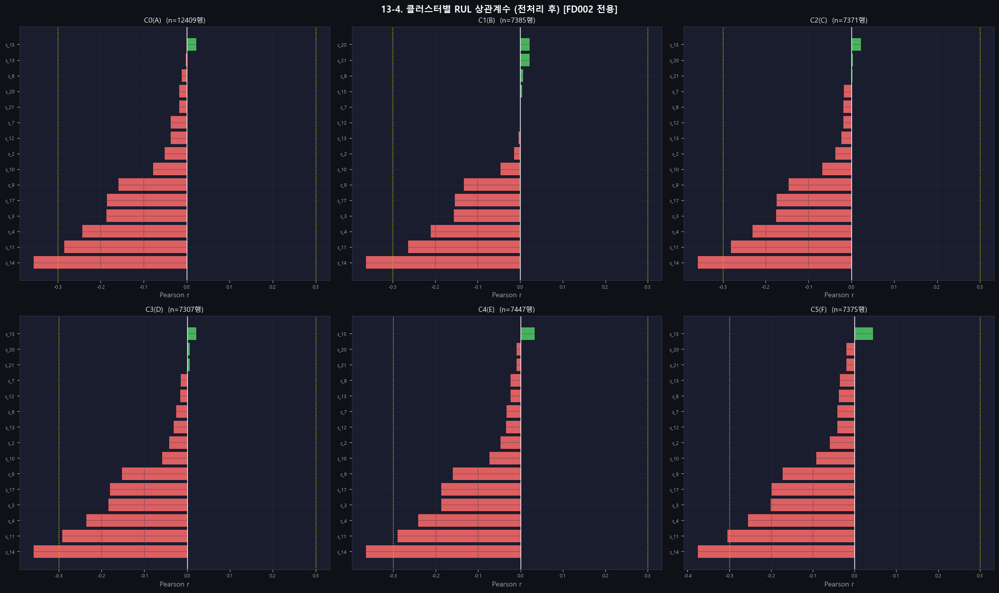

--- 클러스터별 |r|>0.3 고상관 센서 ---
  C0: ['s_14']
  C1: ['s_14']
  C2: ['s_14']
  C3: ['s_14']
  C4: ['s_14']
  C5: ['s_14', 's_11']


In [148]:
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle('13-4. 클러스터별 RUL 상관계수 (전처리 후) [FD002 전용]', fontsize=13, fontweight='bold')

cluster_corr_after_dict = {}
for ax, c in zip(axes.flat, range(N_CLUSTERS)):
    mask = subtrain_s4['op_cluster']==c
    sub  = subtrain_s4[mask]
    if 'RUL' not in sub.columns or len(sub)<10: ax.set_visible(False); continue
    corr = sub[USEFUL_SENSORS+['RUL']].corr()['RUL'][USEFUL_SENSORS].sort_values()
    cluster_corr_after_dict[c] = corr
    bc = [C[1] if v<0 else C[2] for v in corr]
    ax.barh(corr.index, corr.values, color=bc, alpha=0.85)
    ax.axvline(0, color='white', lw=1)
    ax.axvline(0.3, color='yellow', lw=1, ls=':'); ax.axvline(-0.3, color='yellow', lw=1, ls=':')
    ax.set_title(f'C{c}({CLUSTER_MAP[c]})  (n={mask.sum()}행)', fontsize=10)
    ax.set_xlabel('Pearson r'); ax.tick_params(labelsize=7)
plt.tight_layout(); plt.show()

print('--- 클러스터별 |r|>0.3 고상관 센서 ---')
for c, corr in cluster_corr_after_dict.items():
    high = corr[corr.abs()>0.3].index.tolist()
    print(f'  C{c}: {high}')


### 12-5. 클러스터별 RUL 상관계수 전후 비교

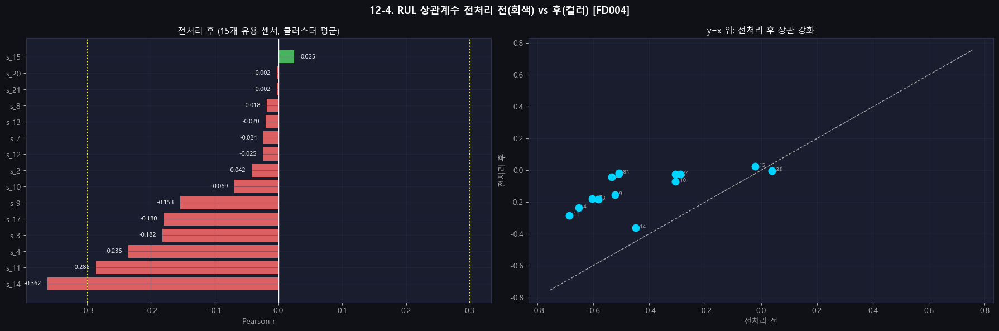

In [149]:
cluster_rul_corrs_after = []
for c in range(N_CLUSTERS):
    mask = subtrain_s4['op_cluster']==c; sub = subtrain_s4[mask]
    if len(sub)>10 and 'RUL' in sub.columns:
        cluster_rul_corrs_after.append(sub[USEFUL_SENSORS+['RUL']].corr()['RUL'][USEFUL_SENSORS])

rul_corr_after = pd.concat(cluster_rul_corrs_after, axis=1).mean(axis=1).sort_values()
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('12-4. RUL 상관계수 전처리 전(회색) vs 후(컬러) [FD004]', fontsize=13, fontweight='bold')
bc = [C[1] if v<0 else C[2] for v in rul_corr_after]
bars = axes[0].barh(rul_corr_after.index, rul_corr_after.values, color=bc, alpha=0.85)
axes[0].axvline(0,color='white',lw=1); axes[0].axvline(0.3,color='yellow',lw=1.5,ls=':'); axes[0].axvline(-0.3,color='yellow',lw=1.5,ls=':')
axes[0].set_title(f'전처리 후 ({len(USEFUL_SENSORS)}개 유용 센서, 클러스터 평균)'); axes[0].set_xlabel('Pearson r')
for bar, val in zip(bars, rul_corr_after.values):
    axes[0].text(val+(0.01 if val>=0 else -0.01), bar.get_y()+bar.get_height()/2,
                 f'{val:.3f}', va='center', ha='left' if val>=0 else 'right', fontsize=8)
common_s = [s for s in USEFUL_SENSORS if s in rul_corr_before.index]
r_b = rul_corr_before[common_s]; r_a = rul_corr_after[common_s]
axes[1].scatter(r_b, r_a, color=C[0], s=80, zorder=5)
for s in common_s: axes[1].annotate(s,(r_b[s],r_a[s]),fontsize=7,color=GRAY)
lim = max(abs(r_b).max(),abs(r_a).max())*1.1
axes[1].plot([-lim,lim],[-lim,lim],color=GRAY,ls='--',lw=1)
axes[1].set_xlabel('전처리 전'); axes[1].set_ylabel('전처리 후'); axes[1].set_title('y=x 위: 전처리 후 상관 강화')
plt.tight_layout(); plt.show()


---
## 13. [ML 분기] 엔진×클러스터 단위 파생변수 생성

In [151]:
def add_temporal_features_by_cluster(df, sensor_cols, lags, diffs, rolls, roll_stds, emas):
    df = df.sort_values(['unit_nr','time_cycles']).copy()
    for s in sensor_cols:
        grp = df.groupby(['unit_nr','op_cluster'])[s]
        for lag in lags:   df[f'{s}_lag{lag}']     = grp.shift(lag)
        for d in diffs:    df[f'{s}_diff{d}']       = grp.diff(d)
        for r in rolls:    df[f'{s}_roll{r}']       = grp.transform(lambda x,r=r: x.rolling(r,min_periods=1).mean())
        for r in roll_stds:df[f'{s}_rollstd{r}']   = grp.transform(lambda x,r=r: x.rolling(r,min_periods=1).std().fillna(0))
        for span in emas:  df[f'{s}_ema{span}']     = grp.transform(lambda x,e=span: x.ewm(span=e,adjust=False).mean())

    warmup_steps = max(max(lags) if lags else 0, max(diffs) if diffs else 0, max(rolls) if rolls else 0)
    df['is_warmup'] = (df.groupby(['unit_nr','op_cluster']).cumcount() < warmup_steps).astype(np.int8)
    derived = [c for c in df.columns if c not in (sensor_cols+['unit_nr','time_cycles',
               'setting_1','setting_2','setting_3','op_cluster','RUL','RUL_raw','is_warmup'])]
    df[derived] = df[derived].fillna(df.groupby(['unit_nr','op_cluster'])[derived].transform('mean'))
    df = df.fillna(0)
    return df

subtrain_ml_raw = add_temporal_features_by_cluster(subtrain_s4, USEFUL_SENSORS,
    TEMPORAL_LAGS, TEMPORAL_DIFFS, TEMPORAL_ROLLS, TEMPORAL_ROLL_STDS, TEMPORAL_EMAS)
valid_ml_raw    = add_temporal_features_by_cluster(valid_s4, USEFUL_SENSORS,
    TEMPORAL_LAGS, TEMPORAL_DIFFS, TEMPORAL_ROLLS, TEMPORAL_ROLL_STDS, TEMPORAL_EMAS)
test_ml_raw     = add_temporal_features_by_cluster(test_s4, USEFUL_SENSORS,
    TEMPORAL_LAGS, TEMPORAL_DIFFS, TEMPORAL_ROLLS, TEMPORAL_ROLL_STDS, TEMPORAL_EMAS)

EXCLUDE = set(ID_COLS+OP_COLS+['op_cluster','RUL','RUL_raw','is_warmup'])
ML_FEATURES = [c for c in subtrain_ml_raw.columns if c not in EXCLUDE]

subtrain_ml = subtrain_ml_raw[ID_COLS+['op_cluster']+ML_FEATURES+['RUL']].copy()
valid_ml    = valid_ml_raw[   ID_COLS+['op_cluster']+ML_FEATURES+['RUL']].copy()
test_ml     = test_ml_raw[    ID_COLS+['op_cluster']+ML_FEATURES].copy()

print(f'✅ ML 파생변수 생성 완료')
print(f'   원본 센서: {len(USEFUL_SENSORS)}개 → ML 피처: {len(ML_FEATURES)}개')
print(f'   Sub-train: {subtrain_ml.shape}  |  Valid: {valid_ml.shape}  |  Test: {test_ml.shape}')

✅ ML 파생변수 생성 완료
   원본 센서: 15개 → ML 피처: 156개
   Sub-train: (49294, 160)  |  Valid: (11955, 160)  |  Test: (41214, 159)


### 13-1. OHE 클러스터 추가 (ML + DL 분기 모두)

=== 기존 OHE 컬럼 사용 ===
추가된 OHE 컬럼: ['cluster_0', 'cluster_1', 'cluster_2', 'cluster_3', 'cluster_4', 'cluster_5']
ML_FEATURES: 150개 → 156개


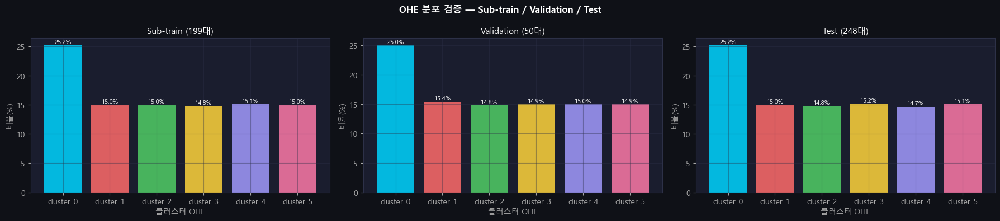

Sub-train OHE 정합성: ✅ 모든 행 합=1
Validation OHE 정합성: ✅ 모든 행 합=1
Test OHE 정합성: ✅ 모든 행 합=1


In [154]:
OHE_COLS = [f'cluster_{i}' for i in range(N_CLUSTERS)]

# 이미 존재하는 OHE 컬럼 사용
print('=== 기존 OHE 컬럼 사용 ===')

# 중복 방지
ML_FEATURES = [f for f in ML_FEATURES if f not in OHE_COLS]
ML_FEATURES = ML_FEATURES + OHE_COLS

print(f'추가된 OHE 컬럼: {OHE_COLS}')
print(f'ML_FEATURES: {len(ML_FEATURES) - N_CLUSTERS}개 → {len(ML_FEATURES)}개')

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
fig.suptitle('OHE 분포 검증 — Sub-train / Validation / Test', fontsize=12, fontweight='bold')

for ax, (df_name, df_chk) in zip(
    axes,
    [('Sub-train', subtrain_ml), ('Validation', valid_ml), ('Test', test_ml)]
):
    ohe_sums = df_chk[OHE_COLS].sum()
    pcts = ohe_sums / ohe_sums.sum() * 100

    bars = ax.bar(
        OHE_COLS,
        pcts.values,
        color=CLUSTER_COLORS[:len(OHE_COLS)],
        alpha=0.85
    )

    ax.set_title(f'{df_name} ({df_chk["unit_nr"].nunique()}대)')
    ax.set_xlabel('클러스터 OHE')
    ax.set_ylabel('비율(%)')

    for bar, v in zip(bars, pcts.values):
        ax.text(
            bar.get_x() + bar.get_width()/2,
            bar.get_height() + 0.3,
            f'{v:.1f}%',
            ha='center',
            fontsize=8
        )

plt.tight_layout()
plt.show()

# 정합성 검증
for df_name, df_chk in [
    ('Sub-train', subtrain_ml),
    ('Validation', valid_ml),
    ('Test', test_ml)
]:
    ok = (df_chk[OHE_COLS].sum(axis=1) == 1).all()

    print(
        f'{df_name} OHE 정합성: '
        f'{"✅ 모든 행 합=1" if ok else "❌ 오류"}'
    )

### 13-2. ML 다중공선성 확인

=== ML 다중공선성 확인 (|r|>0.95) ===
|r|≥0.95 쌍: 245개


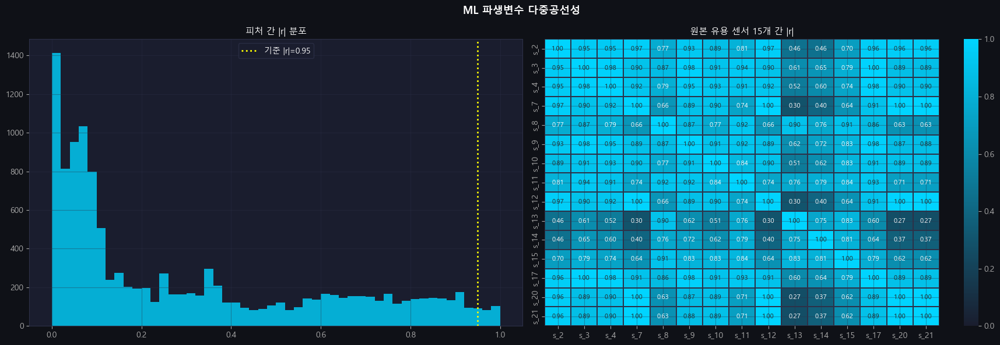

,피처A,피처B,|r|
0,s_7_diff1,s_12_diff1,0.999991
1,s_7_rollstd3,s_12_rollstd3,0.999985
2,s_7_rollstd5,s_12_rollstd5,0.999984
3,s_7,s_12,0.999979
4,s_7_lag1,s_12_lag1,0.999979
5,s_7_lag3,s_12_lag3,0.999979
6,s_7_lag5,s_12_lag5,0.999978
7,s_7_roll3,s_12_roll3,0.999976
8,s_7_roll5,s_12_roll5,0.999972
9,s_7_ema5,s_12_ema5,0.999970


In [155]:
print(f'=== ML 다중공선성 확인 (|r|>0.95) ===')
corr_ml   = subtrain_ml[ML_FEATURES].corr().abs()
upper_ml  = corr_ml.where(np.triu(np.ones(corr_ml.shape),k=1).astype(bool))
HIGH_THR  = 0.95
high_pairs_ml = (upper_ml.stack().reset_index()
                 .rename(columns={'level_0':'피처A','level_1':'피처B',0:'|r|'})
                 .query('`|r|` >= @HIGH_THR')
                 .sort_values('|r|',ascending=False).reset_index(drop=True))
print(f'|r|≥{HIGH_THR} 쌍: {len(high_pairs_ml)}개')

cmap_mc = LinearSegmentedColormap.from_list('mc',['#1a1d2e','#00d4ff'],N=256)
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('ML 파생변수 다중공선성', fontsize=13, fontweight='bold')
all_upper_vals = upper_ml.stack().values
axes[0].hist(all_upper_vals, bins=50, color=C[0], alpha=0.8, edgecolor='none')
axes[0].axvline(HIGH_THR, color='yellow', lw=2, ls=':', label=f'기준 |r|={HIGH_THR}')
axes[0].set_title('피처 간 |r| 분포'); axes[0].legend()
corr_orig = subtrain_ml[USEFUL_SENSORS].corr().abs()
sns.heatmap(corr_orig, ax=axes[1], cmap=cmap_mc, vmin=0, vmax=1,
            annot=True, fmt='.2f', annot_kws={'size':8},
            linewidths=0.3, linecolor=GRID)
axes[1].set_title(f'원본 유용 센서 {len(USEFUL_SENSORS)}개 간 |r|')
plt.tight_layout(); plt.show()
display(high_pairs_ml.head(20))


---
## 14. [DL 분기] 슬라이딩 윈도우

=== 14. DL 슬라이딩 윈도우 ===
DL_FEATURES: 센서 15개 + OHE 6개 = 21채널
X_subtrain_dl : (43523, 30, 21)  ← (샘플, 30, 21채널)
X_valid_dl    : (10505, 30, 21)
X_test_dl     : (248, 30, 21)


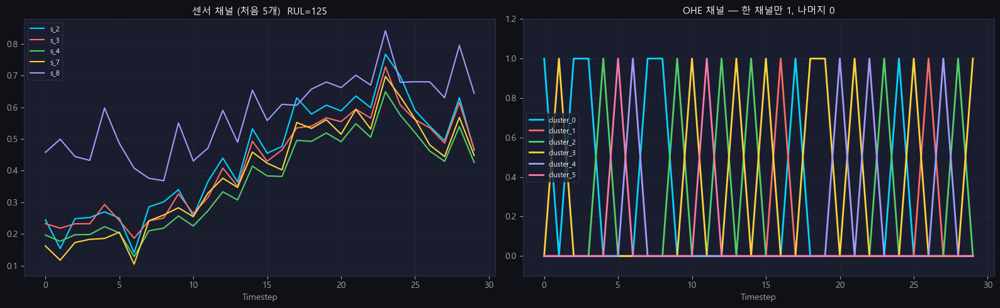

OHE 정합성: ✅

Long Format: subtrain=(1305690, 24)  valid=(315150, 24)  test=(7440, 24)

✅ DL 완료  Sub-train:43523샘플  Valid:10505샘플  Test:248샘플


In [156]:
print('=== 14. DL 슬라이딩 윈도우 ===')

# ------------------------------------------------------------
# 14-1. Sliding Window 생성 함수
# ------------------------------------------------------------
def create_sliding_windows(df, feature_cols, target_col=None, window_size=WINDOW_SIZE, step=STEP):
    X_list, y_list = [], []

    for uid in np.sort(df['unit_nr'].unique()):
        udf  = df[df['unit_nr'] == uid].sort_values('time_cycles')
        data = udf[feature_cols].values.astype(np.float32)
        tgt  = udf[target_col].values if target_col else None
        n    = len(data)

        for start in range(0, n - window_size + 1, step):
            end = start + window_size
            X_list.append(data[start:end])

            if tgt is not None:
                y_list.append(tgt[end - 1])

    X = np.array(X_list, dtype=np.float32)
    y = np.array(y_list, dtype=np.float32) if y_list else None

    return X, y


def create_test_windows(df, feature_cols, rul_series, window_size=WINDOW_SIZE):
    X_list, y_list = [], []

    for i, uid in enumerate(np.sort(df['unit_nr'].unique())):
        udf  = df[df['unit_nr'] == uid].sort_values('time_cycles')
        data = udf[feature_cols].values.astype(np.float32)

        if len(data) >= window_size:
            X_list.append(data[-window_size:])
        else:
            pad = np.zeros((window_size - len(data), len(feature_cols)), dtype=np.float32)
            X_list.append(np.vstack([pad, data]))

        y_list.append(float(rul_series.iloc[i]))

    return np.array(X_list, dtype=np.float32), np.array(y_list, dtype=np.float32)


def windows_to_long_df(X, y, feature_cols):
    n_samples, win_size, n_feat = X.shape

    sample_id = np.repeat(np.arange(n_samples), win_size)
    timestep  = np.tile(np.arange(win_size), n_samples)
    flat      = X.reshape(n_samples * win_size, n_feat)

    df = pd.DataFrame(flat, columns=list(feature_cols))
    df.insert(0, 'timestep', timestep)
    df.insert(0, 'sample_id', sample_id)
    df['RUL'] = np.repeat(np.asarray(y, dtype=np.float32), win_size)

    return df


# ------------------------------------------------------------
# 14-2. DL용 OHE 확인 및 추가
# ------------------------------------------------------------
OHE_COLS = [f'cluster_{i}' for i in range(N_CLUSTERS)]

def ensure_ohe_cluster(df, all_ohe_cols=OHE_COLS):
    """
    이미 OHE 컬럼이 있으면 그대로 사용하고,
    없으면 op_cluster 기준으로 새로 생성한다.
    """
    df = df.copy()

    has_all_ohe = all(col in df.columns for col in all_ohe_cols)

    if has_all_ohe:
        return df

    ohe = pd.get_dummies(df['op_cluster'], prefix='cluster').astype(np.float32)

    for col in all_ohe_cols:
        if col not in ohe.columns:
            ohe[col] = np.float32(0.0)

    ohe = ohe[all_ohe_cols]

    return pd.concat(
        [df.reset_index(drop=True), ohe.reset_index(drop=True)],
        axis=1
    )


subtrain_dl = ensure_ohe_cluster(subtrain_s4)
valid_dl    = ensure_ohe_cluster(valid_s4)
test_dl     = ensure_ohe_cluster(test_s4)


# ------------------------------------------------------------
# 14-3. DL_FEATURES 정의
# ------------------------------------------------------------
DL_FEATURES = USEFUL_SENSORS + OHE_COLS

print(
    f'DL_FEATURES: 센서 {len(USEFUL_SENSORS)}개 + '
    f'OHE {len(OHE_COLS)}개 = {len(DL_FEATURES)}채널'
)


# ------------------------------------------------------------
# 14-4. Sliding Window 생성
# ------------------------------------------------------------
X_subtrain_dl, y_subtrain_dl = create_sliding_windows(
    subtrain_dl,
    DL_FEATURES,
    'RUL'
)

X_valid_dl, y_valid_dl = create_sliding_windows(
    valid_dl,
    DL_FEATURES,
    'RUL'
)

X_test_dl, y_test_dl = create_test_windows(
    test_dl,
    DL_FEATURES,
    rul_df['RUL']
)

print(f'X_subtrain_dl : {X_subtrain_dl.shape}  ← (샘플, {WINDOW_SIZE}, {len(DL_FEATURES)}채널)')
print(f'X_valid_dl    : {X_valid_dl.shape}')
print(f'X_test_dl     : {X_test_dl.shape}')


# ------------------------------------------------------------
# 14-5. OHE 채널 시각화 검증
# ------------------------------------------------------------
sample_window = X_subtrain_dl[0]
ohe_channels  = sample_window[:, len(USEFUL_SENSORS):]

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

for fi in range(min(5, len(USEFUL_SENSORS))):
    axes[0].plot(
        sample_window[:, fi],
        color=C[fi],
        lw=1.5,
        label=USEFUL_SENSORS[fi]
    )

axes[0].set_title(f'센서 채널 (처음 5개)  RUL={y_subtrain_dl[0]:.0f}')
axes[0].set_xlabel('Timestep')
axes[0].legend(fontsize=8)

for ci in range(N_CLUSTERS):
    axes[1].plot(
        ohe_channels[:, ci],
        color=CLUSTER_COLORS[ci],
        lw=2,
        label=f'cluster_{ci}'
    )

axes[1].set_title('OHE 채널 — 한 채널만 1, 나머지 0')
axes[1].set_xlabel('Timestep')
axes[1].set_ylim(-0.1, 1.2)
axes[1].legend(fontsize=8)

plt.tight_layout()
plt.show()

ok = np.all(ohe_channels.sum(axis=1) == 1)
print(f'OHE 정합성: {"✅" if ok else "❌"}')


# ------------------------------------------------------------
# 14-6. Long Format 변환
# ------------------------------------------------------------
dl_subtrain_long = windows_to_long_df(
    X_subtrain_dl,
    y_subtrain_dl,
    DL_FEATURES
)

dl_valid_long = windows_to_long_df(
    X_valid_dl,
    y_valid_dl,
    DL_FEATURES
)

dl_test_long = windows_to_long_df(
    X_test_dl,
    y_test_dl,
    DL_FEATURES
)

print(
    f'\nLong Format: '
    f'subtrain={dl_subtrain_long.shape}  '
    f'valid={dl_valid_long.shape}  '
    f'test={dl_test_long.shape}'
)

print(
    f'\n✅ DL 완료  '
    f'Sub-train:{X_subtrain_dl.shape[0]}샘플  '
    f'Valid:{X_valid_dl.shape[0]}샘플  '
    f'Test:{X_test_dl.shape[0]}샘플'
)

### 14-1. val_eval 생성 (수명 50~90% 랜덤 절단, seed=42)

=== val_eval 생성 (수명 50~90% 절단, seed=42) ===
기존 val_eval RUL 평균: 0.0 (≈0에 가까움)
개선 val_eval RUL 평균: 74.2 (test 분포와 유사)
ML val_eval: (50, 160)
DL val_eval X: (50, 20, 21)
DL val_eval long: (1000, 24)


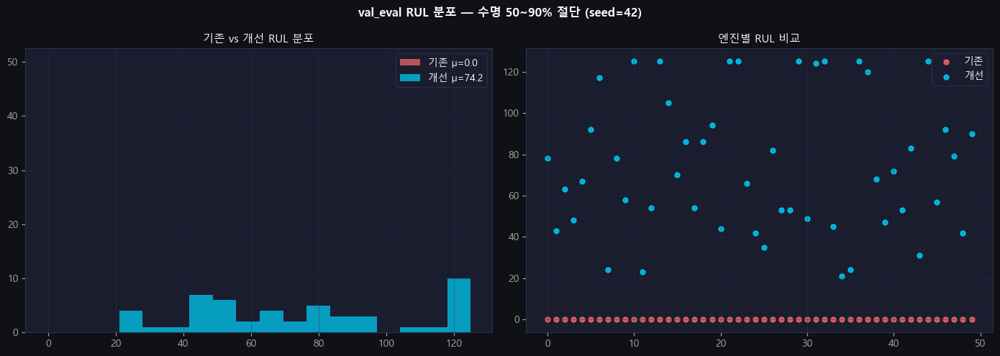

✅ val_eval 생성 완료


In [157]:
print('=== val_eval 생성 (수명 50~90% 절단, seed=42) ===')

WINDOW_SIZE_VE = 20
rng = np.random.RandomState(42)

# ------------------------------------------------------------
# valid_s4에 OHE 컬럼 동기화
# ------------------------------------------------------------
for _col in OHE_COLS:
    if _col not in valid_s4.columns:
        _ohe = pd.get_dummies(valid_s4['op_cluster'], prefix='cluster', dtype=float)

        for _c in OHE_COLS:
            valid_s4[_c] = _ohe[_c].values if _c in _ohe.columns else 0.0

        break


# ------------------------------------------------------------
# val_eval 생성
# ------------------------------------------------------------
ml_val_eval_rows, dl_val_eval_X, dl_val_eval_y = [], [], []

for uid in np.sort(valid_s4['unit_nr'].unique()):
    udf = (
        valid_s4[valid_s4['unit_nr'] == uid]
        .sort_values('time_cycles')
        .reset_index(drop=True)
    )

    n = len(udf)

    # 수명 50~90% 지점 중 하나를 랜덤 절단
    cut_idx = max(
        WINDOW_SIZE_VE,
        min(int(n * rng.uniform(0.5, 0.9)), n)
    )

    cut_time = udf.iloc[cut_idx - 1]['time_cycles']

    # ML용 val_eval 행 매칭
    ml_uid_df = (
        valid_ml[valid_ml['unit_nr'] == uid]
        .sort_values('time_cycles')
        .reset_index(drop=True)
    )

    ml_match = ml_uid_df[ml_uid_df['time_cycles'] == cut_time]

    if len(ml_match) > 0:
        ml_val_eval_rows.append(ml_match.iloc[0].copy())
    else:
        ml_val_eval_rows.append(
            ml_uid_df.iloc[min(cut_idx - 1, len(ml_uid_df) - 1)].copy()
        )

    # DL용 val_eval window 생성
    _avail = [f for f in DL_FEATURES if f in udf.columns]
    data   = udf[_avail].values.astype(np.float32)

    window = data[max(0, cut_idx - WINDOW_SIZE_VE):cut_idx]

    if len(window) < WINDOW_SIZE_VE:
        pad = np.zeros(
            (WINDOW_SIZE_VE - len(window), len(_avail)),
            dtype=np.float32
        )
        window = np.vstack([pad, window])

    dl_val_eval_X.append(window)
    dl_val_eval_y.append(float(udf['RUL'].iloc[cut_idx - 1]))


# ------------------------------------------------------------
# 배열 및 Long Format 변환
# ------------------------------------------------------------
val_eval_ml = pd.DataFrame(ml_val_eval_rows).reset_index(drop=True)

X_ve = np.array(dl_val_eval_X, dtype=np.float32)
y_ve = np.array(dl_val_eval_y, dtype=np.float32)

_dl_feats_ve = [f for f in DL_FEATURES if f in valid_s4.columns]

dl_val_eval_long = windows_to_long_df(
    X_ve,
    y_ve,
    _dl_feats_ve
)


# ------------------------------------------------------------
# 기존 마지막 시점 평가와 개선 평가 비교
# ------------------------------------------------------------
old_rul = np.array([
    float(
        valid_s4[valid_s4['unit_nr'] == uid]
        .sort_values('time_cycles')['RUL']
        .iloc[-1]
    )
    for uid in np.sort(valid_s4['unit_nr'].unique())
])

print(f'기존 val_eval RUL 평균: {old_rul.mean():.1f} (≈0에 가까움)')
print(f'개선 val_eval RUL 평균: {y_ve.mean():.1f} (test 분포와 유사)')

print(f'ML val_eval: {val_eval_ml.shape}')
print(f'DL val_eval X: {X_ve.shape}')
print(f'DL val_eval long: {dl_val_eval_long.shape}')


# ------------------------------------------------------------
# RUL 분포 시각화
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle(
    'val_eval RUL 분포 — 수명 50~90% 절단 (seed=42)',
    fontweight='bold'
)

axes[0].hist(
    old_rul,
    bins=15,
    color=C[1],
    alpha=0.7,
    label=f'기존 μ={old_rul.mean():.1f}'
)

axes[0].hist(
    y_ve,
    bins=15,
    color=C[0],
    alpha=0.7,
    label=f'개선 μ={y_ve.mean():.1f}'
)

axes[0].set_title('기존 vs 개선 RUL 분포')
axes[0].legend()

axes[1].scatter(
    range(len(old_rul)),
    old_rul,
    color=C[1],
    s=25,
    alpha=0.8,
    label='기존'
)

axes[1].scatter(
    range(len(y_ve)),
    y_ve,
    color=C[0],
    s=25,
    alpha=0.8,
    label='개선'
)

axes[1].set_title('엔진별 RUL 비교')
axes[1].legend()

plt.tight_layout()
plt.show()

print('✅ val_eval 생성 완료')